# Application of design best practices to COVID dataset

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import os,sys
import scanpy as sc 
import pandas as pd
import numpy as np
import milopy
import scipy
import anndata

# from diff2atlas.diff_analysis_wrappers import run_milo, run_sccoda
from oor_benchmark.methods.scArches_milo import run_milo

import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt

sns.set_context('talk')
from matplotlib.pyplot import rc_context

Global seed set to 0
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:53: LightningDeprecationWarning: pytorch_lightning.utilities.warnings.rank_zero_deprecation has been deprecated in v1.6 and will be removed in v1.8. Use the equivalent function from the pytorch_lightning.utilities.rank_zero module instead.
  new_rank_zero_deprecation(
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/pytorch_lightning/utilities/warnings.py:58: LightningDeprecationWarning: The `pytorch_lightning.loggers.base.rank_zero_experiment` is deprecated in v1.7 and will be removed in v1.9. Please use `pytorch_lightning.loggers.logger.rank_zero_experiment` instead.
  return new_rank_zero_deprecation(*args, **kwargs)


In [5]:
figdir = '/home/jovyan/mount/gdrive/diff2atlas/figures/COVID_analysis/'
if not os.path.exists(figdir):
    os.mkdir(figdir)
sc.settings.figdir = figdir


In [6]:
## r2py setup
import rpy2.rinterface_lib.callbacks
import logging
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)


In [7]:
%load_ext rpy2.ipython

In [8]:
%%R
library(tidyverse)
library(reshape2)
library(patchwork)

remove_x_axis <- function(){
  theme(axis.text.x = element_blank(), axis.ticks.x = element_blank(), axis.title.x = element_blank())  
}

remove_y_axis <- function(){
  theme(axis.text.y = element_blank(), axis.ticks.y = element_blank(), axis.title.y = element_blank())  
}

System has not been booted with systemd as init system (PID 1). Can't operate.
Failed to create bus connection: Host is down


In [9]:
## Define color palette
pal = sns.color_palette('Paired').as_hex()
design_palette = {'ACR':pal[3], 'CR':pal[7], 'AR':pal[9], 'joint_CR':pal[6]}
design_palette_df = pd.DataFrame(design_palette.values(), index =design_palette.keys() )
design_palette_df.columns = ['color']

In [10]:
%%R -i design_palette_df -i figdir
design_palette = setNames(design_palette_df$color, rownames(design_palette_df))

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


plotting utils

In [8]:
pip install adjustText

  Using cached adjustText-0.7.3.tar.gz (7.5 kB)
  Preparing metadata (setup.py) ... done
  Created wheel for adjustText: filename=adjustText-0.7.3-py3-none-any.whl size=7097 sha256=dbebb4757762a389fad4912884e39a5068eb6be78e11449c9c43770d05dddba1
  Stored in directory: /home/jovyan/.cache/pip/wheels/08/17/ca/9b56027427d0a46e5696312ad2bc4e8a47620d31a25c473d44
Successfully built adjustText
Note: you may need to restart the kernel to use updated packages.


In [11]:
from adjustText import adjust_text
def gen_mpl_labels(
    adata, groupby, exclude=(), ax=None, adjust_kwargs=None, text_kwargs=None
):
    if adjust_kwargs is None:
        adjust_kwargs = {"text_from_points": False}
    if text_kwargs is None:
        text_kwargs = {}

    medians = {}

    for g, g_idx in adata.obs.groupby(groupby).groups.items():
        if g in exclude:
            continue
        medians[g] = np.median(adata[g_idx].obsm["X_umap"], axis=0)

    if ax is None:
        texts = [
            plt.text(x=x, y=y, s=k, **text_kwargs) for k, (x, y) in medians.items()
        ]
    else:
        texts = [ax.text(x=x, y=y, s=k, **text_kwargs) for k, (x, y) in medians.items()]

    adjust_text(texts, **adjust_kwargs)

In [12]:
def plot_w_ggplot(r_fct_str, args, figdir='.', pl_name='plot', pl_width=8, pl_height=8):

    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP

    r_pkg = STAP(r_fct_str, "r_pkg")
    #this was needed for the code to run on jhub
    #if you have a different version of rpy2 you may not need these two lines
    rpy2.robjects.pandas2ri.activate()
    rpy2.robjects.numpy2ri.activate()
    
    # PASS OBJECTS INTO FUNCTION
    pl = r_pkg.plot_func(args)
    
    ggsave_str = '''
    save_plot <- function(pl, figdir, pl_name, pl_width, pl_height){
        pl + 
        ggsave(file.path(figdir, paste0(pl_name, ".png")), width=pl_width, height=pl_height)  +
        ggsave(file.path(figdir, paste0(pl_name, ".pdf")), width=pl_width, height=pl_height)
    }
    
    '''
    r_save = STAP(ggsave_str, "r_save")
    r_save.save_plot(pl, figdir, pl_name=pl_name, pl_width=pl_width, pl_height=pl_height)
    

## Prepare dataset

Anndata objects filtered (subsampling to 500 cells per sample) and split by condition are prepared running `submit_split_PBMC_dataset.sh` and stored in `/nfs/team205/ed6/data/PBMC_CZI_integration_filtered/tmp/`

In [4]:
data_dir = '/nfs/team205/ed6/data/PBMC_CZI_integration_filtered/'
query_batch = '10_1038_s41591_021_01329_2'

In [5]:
normal_sample_obs = pd.read_csv(data_dir + 'PBMC_sample_metadata.normal.csv')
covid_sample_obs = pd.read_csv(data_dir + 'PBMC_sample_metadata.COVID.csv')

In [6]:
step_adata = sc.read_h5ad(data_dir + f'{query_batch}.h5ad', backed='r')

In [7]:
atlas_batch = normal_sample_obs[normal_sample_obs.dataset_id != query_batch].dataset_id.unique()

In [8]:
data_dir = '/nfs/team205/ed6/data/PBMC_CZI_integration_filtered/'
tmp_dir = '/nfs/team205/ed6/data/PBMC_CZI_integration_filtered/tmp/'

h5ad_files_atlas = [f'{x}.normal.subsample500cells.h5ad' for x in atlas_batch]
h5ad_files_covid = f'{query_batch}.COVID.subsample500cells.h5ad' 
h5ad_files_ctrl = f'{query_batch}.normal.subsample500cells.h5ad' 

assert os.path.exists(tmp_dir + h5ad_files_covid)
assert os.path.exists(tmp_dir + h5ad_files_ctrl)
assert all([os.path.exists(tmp_dir + x) for x in h5ad_files_atlas])

In [9]:
# check X stores raw counts 
def _check_counts_in_X(adata):
    return(all(np.random.choice(adata.X.data, 100) % 1 == 0))

def _clean_adata(a):
    ## Make obs_names unique
    a.obs_names = a.obs['dataset_id'].astype('str') + '-' + a.obs_names.astype("str")
    assert _check_counts_in_X(a)

    sc.pp.calculate_qc_metrics(a, inplace=True)
    sc.pp.filter_cells(a, min_counts=1000)

    ## Filter inside training functions instead
    ## to avoid missing genes when mapping query
    # ## Filter genes not expressed anywhere
    # sc.pp.filter_genes(a, min_cells=1)
    return(a)

### Prep atlas data

In [10]:
adata_atlas_ls = [sc.read_h5ad(tmp_dir + f) for f in h5ad_files_atlas]
for a in adata_atlas_ls:
    _clean_adata(a)

## Concatenate
adata_atlas = anndata.concat(adata_atlas_ls)

## Make var with gene names
adata_atlas.var['gene_id'] = adata_atlas.var_names.values
adata_atlas.var['gene_name'] = [a for a in adata_atlas_ls if 'feature_name' in a.var.columns][0].var['feature_name']

## Exclude 3 donors with Smart-seq2 data
adata_atlas = adata_atlas[adata_atlas.obs['assay'] != 'Smart-seq2'].copy()

## Fix dataset naming
adata_atlas.obs['dataset_id'] = [x[0] for x in adata_atlas.obs['dataset_id'].str.split("_innate")]
adata_atlas.obs['dataset_id'] = [x[0] for x in adata_atlas.obs['dataset_id'].str.split("_adaptive")]

### Prep COVID data

In [11]:
adata_covid = sc.read_h5ad(tmp_dir + h5ad_files_covid)
_clean_adata(adata_covid)

AnnData object with n_obs × n_vars = 48083 × 24727
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts'
    var: 'feature_biotype', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

### Prep control data

In [12]:
adata_ctrl = sc.read_h5ad(tmp_dir + h5ad_files_ctrl)
_clean_adata(adata_ctrl)

AnnData object with n_obs × n_vars = 14426 × 24727
    obs: 'sex', 'tissue', 'ethnicity', 'disease', 'assay', 'assay_ontology_term_id', 'sample_id', 'donor_id', 'dataset_id', 'development_stage', 'cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'n_counts'
    var: 'feature_biotype', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [13]:
## Save datasets
outdir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/'
if not os.path.exists(outdir):
    os.mkdir(outdir)

In [14]:
adata_atlas.obs['donor_id'] = adata_atlas.obs['donor_id'].astype("str").astype("category")
adata_covid.obs['donor_id'] = adata_covid.obs['donor_id'].astype("str").astype("category")
adata_ctrl.obs['donor_id'] = adata_ctrl.obs['donor_id'].astype("str").astype("category")

In [15]:
adata_atlas.var['gene_id'] = adata_atlas.var['gene_id'].astype("category")

In [16]:
adata_atlas.write_h5ad(outdir + 'PBMC_COVID.subsample500cells.atlas.h5ad')
# adata_covid.write_h5ad(outdir + 'PBMC_COVID.subsample500cells.covid.h5ad')
adata_ctrl.write_h5ad(outdir + 'PBMC_COVID.subsample500cells.ctrl.h5ad')

## Train models

Running on farm

In [ ]:
conda activate scvi-env
cd /nfs/team205/ed6/bin/diff2atlas/scripts

outdir=/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/

## Train reference models
for d in 'A' 'C' 'AC' 'PA' 'PC' 'PAC'; do     
    echo "python COVID_train_references.py ${d} --datadir ${outdir}" | \
    bsub -G teichlab -o logfile-scvi-%J.out -e logfile-scvi-%J.err -q gpu-normal -M50000 -R "select[mem>50000] rusage[mem=50000]" -gpu "mode=shared:j_exclusive=no:gmem=6000:num=1"
done

## Map query datasets

In [ ]:
conda activate scvi-env
cd /nfs/team205/ed6/bin/diff2atlas/scripts

outdir=/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/

for q in 'P' 'PC'; do
    echo "python COVID_map_query.py model_reference_A ${q} --datadir ${outdir}" | \
    bsub -G teichlab -o logfile-scarches-%J.out -e logfile-scarches-%J.err -q gpu-normal -M25000 -R "select[mem>25000] rusage[mem=25000]" -gpu "mode=shared:j_exclusive=no:gmem=6000:num=1"
done

echo "python COVID_map_query.py model_reference_AC P --datadir ${outdir}" | \
    bsub -G teichlab -o logfile-scarches-%J.out -e logfile-scarches-%J.err -q gpu-normal -M25000 -R "select[mem>25000] rusage[mem=25000]" -gpu "mode=shared:j_exclusive=no:gmem=6000:num=1"


echo "python COVID_map_query.py model_reference_C P --datadir ${outdir}" | \
    bsub -G teichlab -o logfile-scarches-%J.out -e logfile-scarches-%J.err -q gpu-normal -M25000 -R "select[mem>25000] rusage[mem=25000]" -gpu "mode=shared:j_exclusive=no:gmem=6000:num=1"

## Parse outputs into designs

In [30]:
import scvi
import shutil

data_dir = outdir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/'

Global seed set to 0


In [4]:
adata_atlas = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.atlas.h5ad')
adata_covid = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.covid.h5ad')
adata_ctrl = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.ctrl.h5ad')
adata_dict = {'A': adata_atlas, 'P': adata_covid, 'C': adata_ctrl}

Global seed set to 0


In [7]:
def _read_design(model_query_dir, n_neighbors=100):
    ref_string = model_query_dir.split('ref')[-1]
    query_string = model_query_dir.split('_ref')[0].split('_')[-1]
    model_reference_dir = f'model_reference_{ref_string}'

    # Make merged anndata object
    print("Merging anndatas...\n")
    adata_design = anndata.concat([adata_dict[d] for d in ref_string] + [adata_dict[d] for d in query_string],
        label='dataset_group',
        keys = [d for d in ref_string] + [d for d in query_string]
        )

    print("Loading trained models...\n")
    try:
        vae_reference = scvi.model.SCVI.load(outdir + model_reference_dir + f'_scvi{scvi.__version__}')
    except:
        scvi.model.SCVI.convert_legacy_save(outdir + model_reference_dir, outdir + model_reference_dir + f'_scvi{scvi.__version__}', overwrite=True)
        shutil.copyfile(outdir + model_reference_dir + '/adata.h5ad', outdir + model_reference_dir + f'_scvi{scvi.__version__}/adata.h5ad')
        vae_reference = scvi.model.SCVI.load(outdir + model_reference_dir + f'_scvi{scvi.__version__}')
    try:
        vae_query = scvi.model.SCVI.load( outdir + model_query_dir + f'_scvi{scvi.__version__}')
    except:
        scvi.model.SCVI.convert_legacy_save(outdir + model_query_dir, outdir + model_query_dir + f'_scvi{scvi.__version__}', overwrite=True)
        shutil.copyfile(outdir + model_query_dir + '/adata.h5ad', outdir + model_query_dir + f'_scvi{scvi.__version__}/adata.h5ad')
        vae_query = scvi.model.SCVI.load( outdir + model_query_dir + f'_scvi{scvi.__version__}')

    model_obs_names = vae_reference.adata.obs_names.tolist() + vae_query.adata.obs_names.tolist()
    if all(model_obs_names == adata_design.obs_names):
        adata_design.obsm['X_scVI'] = np.vstack([
            vae_reference.get_latent_representation(),
            vae_query.get_latent_representation(),
            ])
    else:
        raise ValueError("Cell names don't match order in model")

    ## Remove atlas, if present
    adata_design = adata_design[adata_design.obs['dataset_group'] != 'A'].copy()

    ## Compute KNN graph
    print("Computing KNN graph...\n")
    sc.pp.neighbors(adata_design, use_rep='X_scVI', n_neighbors=n_neighbors)

    ## Run UMAP
    print("Running UMAP...\n")
    sc.tl.umap(adata_design)

    ## Save 
    file_name = f"PBMC_COVID.subsample500cells.design.{model_query_dir.split('model_')[-1]}.h5ad"
    print(f"Saving to {file_name}...\n")
    adata_design.write_h5ad(outdir + file_name)

def _read_design_scvi(model_reference_dir, n_neighbors=100):
    ref_string = model_reference_dir.split('_')[-1]
    model_reference_dir = f'model_reference_{ref_string}'

    # Make merged anndata object
    print("Merging anndatas...\n")
    adata_design = anndata.concat([adata_dict[d] for d in ref_string],
        label='dataset_group',
        keys = [d for d in ref_string]
        )

    print("Loading trained models...\n")
    try:
        vae_reference = scvi.model.SCVI.load(outdir + model_reference_dir + f'_scvi{scvi.__version__}')
    except:
        scvi.model.SCVI.convert_legacy_save(outdir + model_reference_dir, outdir + model_reference_dir + f'_scvi{scvi.__version__}', overwrite=True)
        shutil.copyfile(outdir + model_reference_dir + '/adata.h5ad', outdir + model_reference_dir + f'_scvi{scvi.__version__}/adata.h5ad')
        vae_reference = scvi.model.SCVI.load(outdir + model_reference_dir + f'_scvi{scvi.__version__}')
    
    model_obs_names = vae_reference.adata.obs_names.tolist() 
    if all(model_obs_names == adata_design.obs_names):
        adata_design.obsm['X_scVI'] = vae_reference.get_latent_representation()
    else:
        raise ValueError("Cell names don't match order in model")

    ## Remove atlas, if present
    adata_design = adata_design[adata_design.obs['dataset_group'] != 'A'].copy()

    ## Compute KNN graph
    print("Computing KNN graph...\n")
    sc.pp.neighbors(adata_design, use_rep='X_scVI', n_neighbors=n_neighbors)

    ## Run UMAP
    print("Running UMAP...\n")
    sc.tl.umap(adata_design)

    ## Save 
    file_name = f"PBMC_COVID.subsample500cells.design.{model_reference_dir.split('model_reference')[-1]}.h5ad"
    print(f"Saving to {file_name}...\n")
    adata_design.write_h5ad(outdir + file_name)


In [8]:
for mq in [x for x in os.listdir(outdir) if x.startswith('model_query_') and 'scvi' not in x]:
    _read_design(mq)

for mq in ['model_reference_PC', 'model_reference_PAC']:
    _read_design_scvi(mq)


Merging anndatas...

Loading trained models...

INFO     File /lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/model_reference_A_scvi0.16.2/
         model.pt already downloaded                                                         
INFO     No backup URL provided for missing file /lustre/scratch117/cellgen/team205/ed6/PBMC_
         COVID/model_query_PC_refA_scvi0.16.2/model.pt                                       
INFO     File /lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/model_query_PC_refA_scvi0.16.
         2/model.pt already downloaded                                                       
Computing KNN graph...

Running UMAP...

Saving to {file_name}...

Merging anndatas...

Loading trained models...

INFO     No backup URL provided for missing file /lustre/scratch117/cellgen/team205/ed6/PBMC_
         COVID/model_reference_C_scvi0.16.2/model.pt                                         
INFO     File /lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/model_reference_C_scv

## Run Milo analysis

In [11]:
data_dir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/'
adata_atlas = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.atlas.h5ad', backed='r')

## Load dataset specific obs
query_batch = '/nfs/team205/ed6/data/PBMC_CZI_integration_filtered/10_1038_s41591_021_01329_2.h5ad'
stephenson_obs = sc.read_h5ad(query_batch, backed='r').obs.copy()

### With ACR design

In [12]:
adata = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.design.query_PC_refA.h5ad')

## Add dataset specific obs 
new_obs = stephenson_obs.loc[[x.split('10_1038_s41591_021_01329_2-')[-1] for x in adata.obs_names]]
new_obs.index = adata.obs_names
adata.obs = pd.concat([new_obs.loc[:,~new_obs.columns.isin(adata.obs.columns)], adata.obs], 1)

## Add interferon signature 
adata.layers['counts'] = adata.X.copy()
sc.pp.normalize_per_cell(adata)
sc.pp.log1p(adata)

adata.var = adata_atlas.var.loc[adata.var_names]
adata.var_names = adata.var['gene_name'].values
## Taken from https://www.nature.com/articles/s41586-021-04345-x
ifn_signature_genes = [
    'BST2', 'CMPK2', 'EIF2AK2', 'EPSTI1', 'HERC5', 'IFI35', 'IFI44L', 'IFI6', 
    'IFIT3', 'ISG15', 'LY6E', 'MX1', 'MX2', 'OAS1', 'OAS2', 'PARP9', 'PLSCR1', 
    'SAMD9', 'SAMD9L', 'SP110', 'STAT1', 'TRIM22', 'UBE2L6', 'XAF1', 'IRF7'
    ]

sc.tl.score_genes(adata, ifn_signature_genes, score_name='IFN_signature')

/tmp/ipykernel_8908/1888922573.py:6: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  adata.obs = pd.concat([new_obs.loc[:,~new_obs.columns.isin(adata.obs.columns)], adata.obs], 1)
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/anndata/_core/anndata.py:895: UserWarning: 
AnnData expects .var.index to contain strings, but got values like:
    ['FAM87B', 'LINC00115', 'FAM41C', 'SAMD11', 'NOC2L']

    Inferred to be: categorical

  names = self._prep_dim_index(names, "var")
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [13]:
run_milo(adata, 'P', 'C', sample_col='sample_id', annotation_col='cell_type', design='~Site+is_query')
milopy.utils.annotate_nhoods_continuous(adata, "IFN_signature")
milopy.utils.annotate_nhoods(adata, 'author_cell_type')

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scipy/sparse/_base.py:665: RuntimeWarning: invalid value encountered in divide
  return np.true_divide(self.todense(), other)
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/vectors.py:1010: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/pandas/core/arrays/datetimes.py:2178: PytzUsageWarning: The zone attribute is specific to pytz's interface; please migrate to a new time zone provider. For more details on how to do so, see https://pytz-deprecation-shim.readthedocs.io/en/latest/migration.ht

### With CR design

In [14]:
adata_c = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.design.query_P_refC.h5ad')
new_obs = stephenson_obs.loc[[x.split('10_1038_s41591_021_01329_2-')[-1] for x in adata_c.obs_names]]
new_obs.index = adata_c.obs_names
adata_c.obs = pd.concat([new_obs.loc[:,~new_obs.columns.isin(adata_c.obs.columns)], adata_c.obs], 1)
adata_c.obs['IFN_signature'] = adata.obs.loc[adata_c.obs_names, 'IFN_signature']

/tmp/ipykernel_8908/2177349046.py:4: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  adata_c.obs = pd.concat([new_obs.loc[:,~new_obs.columns.isin(adata_c.obs.columns)], adata_c.obs], 1)


In [64]:
adata_c.layers['counts'] = adata_c.X.copy()
sc.pp.normalize_per_cell(adata_c)
sc.pp.log1p(adata_c)

In [15]:
run_milo(adata_c, 'P', 'C', sample_col='sample_id', annotation_col='cell_type', design='~Site+is_query')
milopy.utils.annotate_nhoods(adata_c, 'author_cell_type')
milopy.utils.annotate_nhoods_continuous(adata_c, "IFN_signature")

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scipy/sparse/_base.py:665: RuntimeWarning: invalid value encountered in divide
  return np.true_divide(self.todense(), other)
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/milopy/core.py:285: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)


## Add broad annotation labels

In [17]:
anno_labels = adata.obs['author_cell_type'].unique()
anno_groups = {}
anno_groups['B_cell'] = [x for x in adata.obs['author_cell_type'].unique() if x.startswith('B_')]
anno_groups['HSPC'] = [x for x in adata.obs['author_cell_type'].unique() if x.startswith('HSC_')]
anno_groups['CD14_mono'] =[x for x in adata.obs['author_cell_type'].unique() if 'CD14_mono' in x]
anno_groups['CD16_mono'] =[x for x in adata.obs['author_cell_type'].unique() if 'CD16_mono' in x]
anno_groups['CD4_T'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("CD4.")]
anno_groups['CD8_T'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("CD8.")]
anno_groups['ILC'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("ILC")]
anno_groups['Plasma_cell'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("Plasma_cell")]

for x in anno_labels: 
    if x not in sum(anno_groups.values(), []):
        anno_groups[x] = [x]

anno_labels_dict = {x:k for k,v in anno_groups.items() for x in v}

adata.obs['author_cell_type_broad'] = [anno_labels_dict[x] for x in adata.obs['author_cell_type']]
adata_c.obs['author_cell_type_broad'] = [anno_labels_dict[x] for x in adata_c.obs['author_cell_type']]


## Integration plots

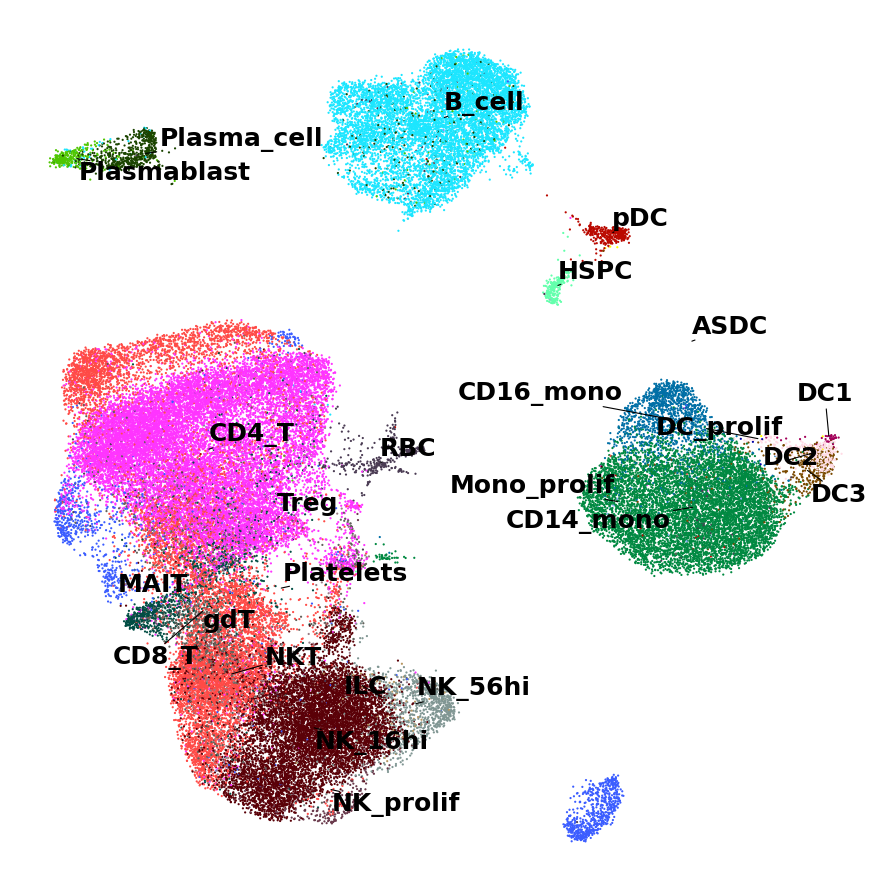

In [25]:
with rc_context({'figure.figsize':[9,9]}):
    ax = sc.pl.umap(adata, color=['author_cell_type_broad'], size=10, palette=sc.pl.palettes.godsnot_102,
                legend_fontsize=14, frameon=False,
                title="", show=False, legend_loc=None)
    gen_mpl_labels(
        adata,
        "author_cell_type_broad",
    #     exclude=merged_adata.obs['annotation_reference'][~merged_adata.obs['annotation_reference'].isin(anno_labels)].unique().tolist(),
        ax=ax,
        adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
        text_kwargs=dict(fontsize=18, fontweight='bold'),
    )
    fig = ax.get_figure()
    fig.tight_layout()
    plt.savefig(figdir + "PAC_design_celltypes.png")

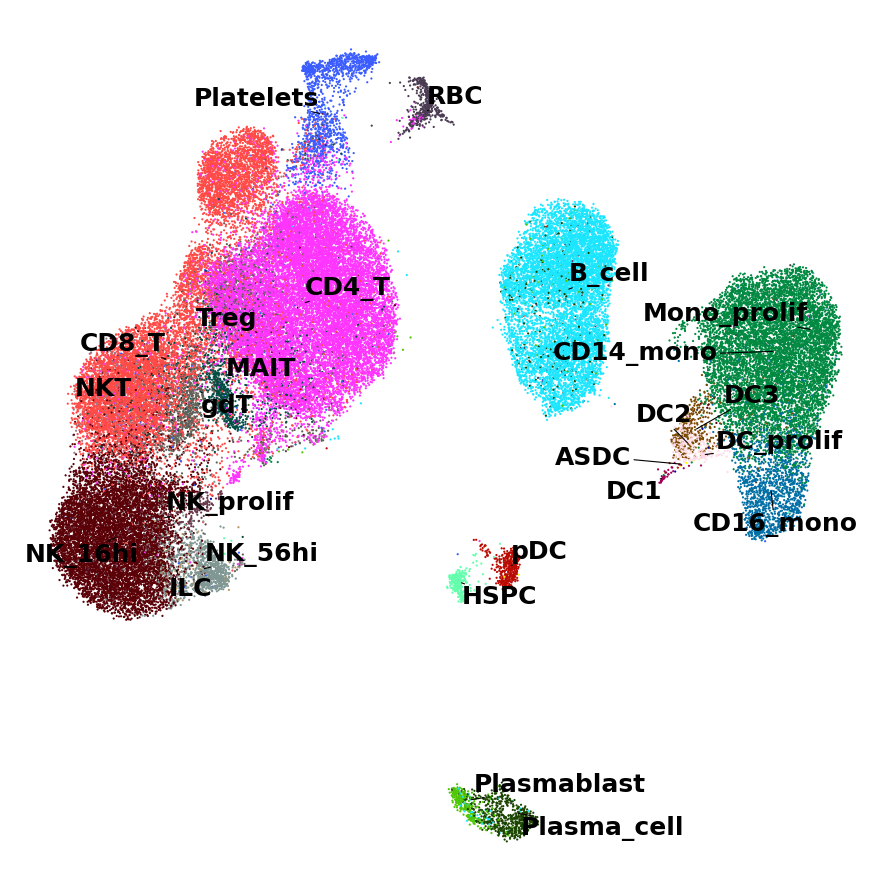

In [29]:
with rc_context({'figure.figsize':[9,9]}):
    ax = sc.pl.umap(adata_c, color=['author_cell_type_broad'], size=10, palette=sc.pl.palettes.godsnot_102,
                legend_fontsize=14, frameon=False,
                title="", show=False, legend_loc=None)
    gen_mpl_labels(
        adata_c,
        "author_cell_type_broad",
    #     exclude=merged_adata.obs['annotation_reference'][~merged_adata.obs['annotation_reference'].isin(anno_labels)].unique().tolist(),
        ax=ax,
        adjust_kwargs=dict(arrowprops=dict(arrowstyle='-', color='black')),
        text_kwargs=dict(fontsize=18, fontweight='bold'),
    )
    fig = ax.get_figure()
    fig.tight_layout()
    plt.savefig(figdir + "PC_design_celltypes.png")

In [35]:
pc_donors = adata_c.obs.donor_id.unique()
pac_donors = adata.obs.donor_id.unique()
len(pac_donors)
len(pc_donors)

119

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


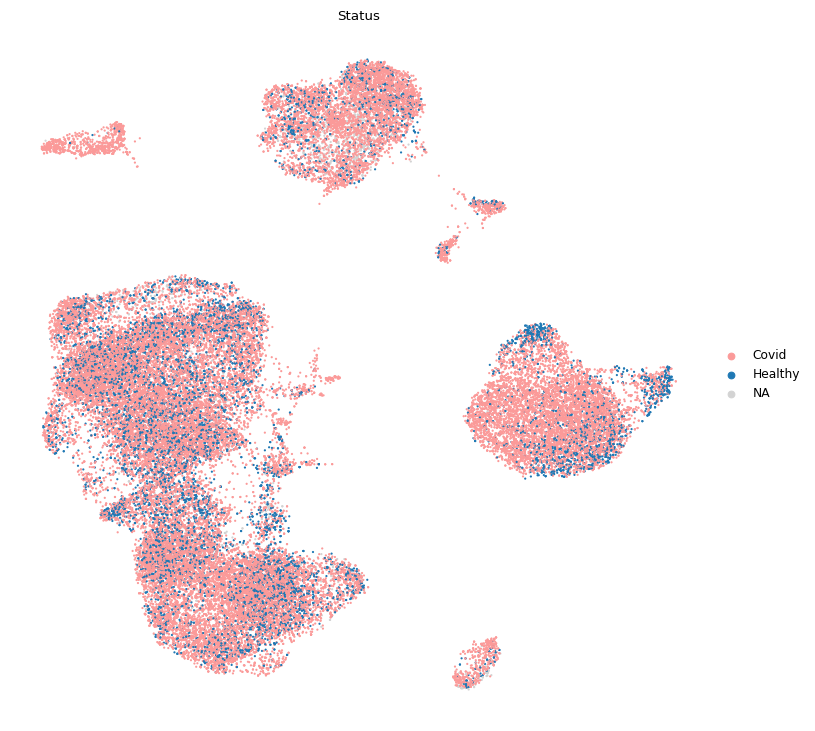

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


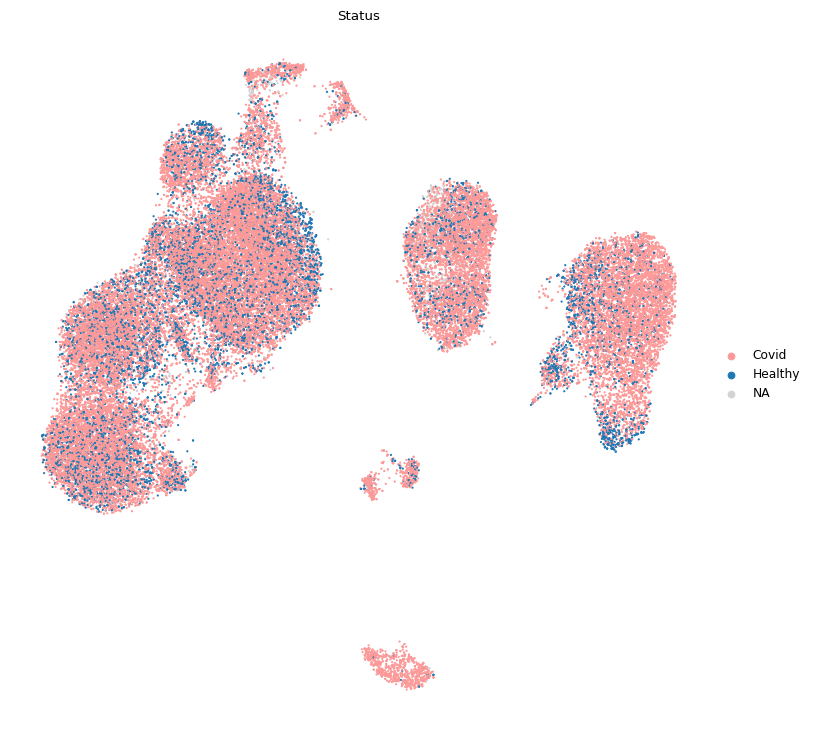

In [42]:
covid_palette = {'Covid':'#fb9a99', "Healthy":'#1f78b4', 'LPS':'#fdbf6f', 'Non_covid':'#fdbf6f'}

with rc_context({'figure.figsize':[9,9]}):
    sc.pl.umap(adata[np.random.choice(adata.obs_names, adata.n_obs)], color=['Status'], 
               legend_loc='right margin', frameon=False, groups=['Covid', 'Healthy'],
               size=10, palette=covid_palette,
              save='PAC_covid_status.png');
    sc.pl.umap(adata_c[np.random.choice(adata_c.obs_names, adata_c.n_obs)], color=['Status'], 
               legend_loc='right margin', frameon=False, groups=['Covid', 'Healthy'],
               size=10, palette=covid_palette,
              save='PC_covid_status.png');


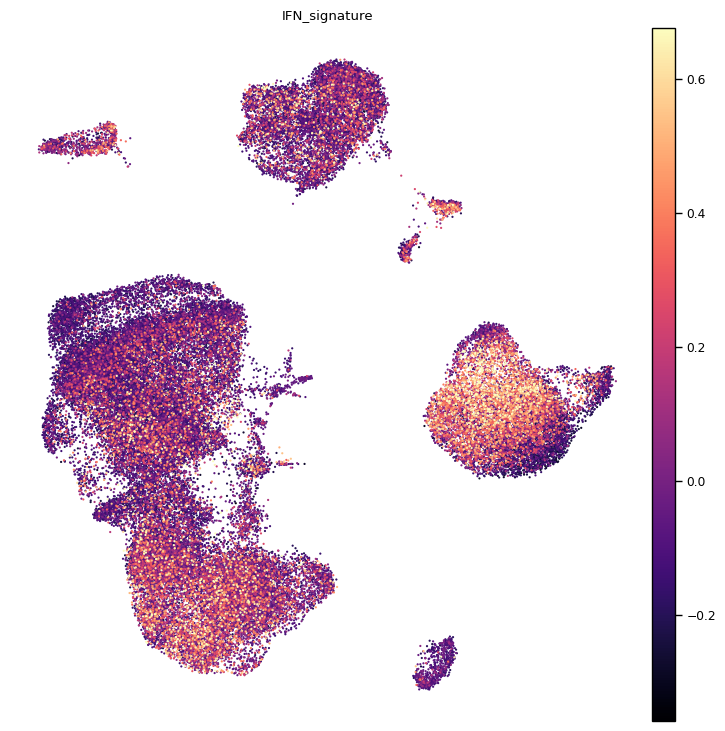

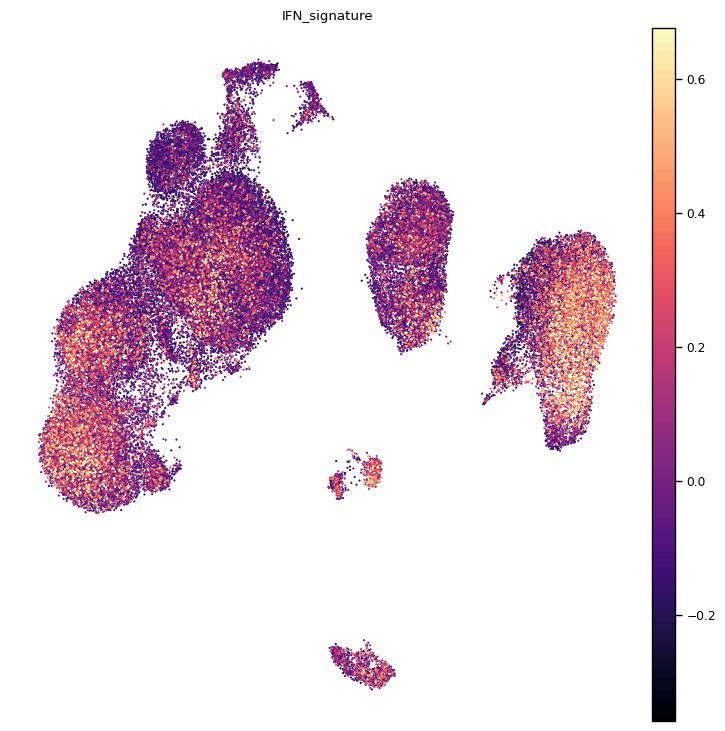

In [47]:
covid_palette = {'Covid':'#fb9a99', "Healthy":'#1f78b4', 'LPS':'#fdbf6f'}
with rc_context({'figure.figsize':[9,9]}):
    sc.pl.umap(adata, color=['IFN_signature'], 
               legend_loc='right margin', frameon=False, 
               size=10, cmap = 'magma', vmax=np.quantile(adata.obs['IFN_signature'], 0.99),
              save='PAC_IFN_status.png');
    sc.pl.umap(adata_c, color=['IFN_signature'], 
               legend_loc='right margin', frameon=False, 
               size=10, cmap = 'magma', vmax=np.quantile(adata.obs['IFN_signature'], 0.99),
              save='PC_IFN_status.png');


In [57]:
adata.obs.donor_id.unique()

(119,)

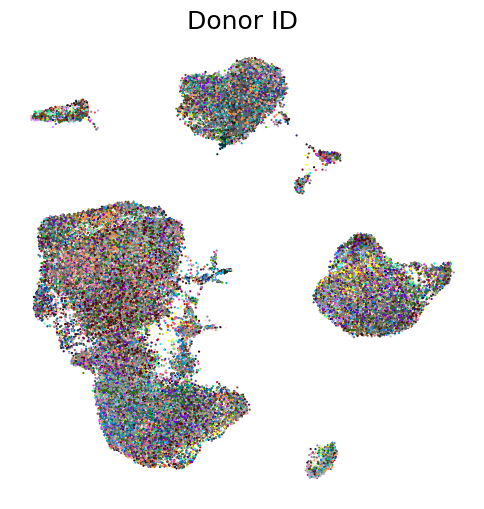

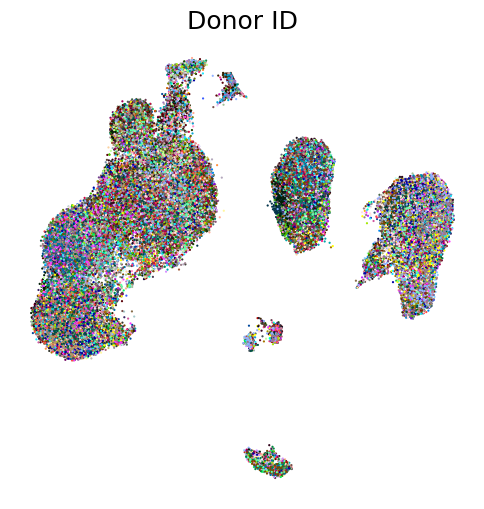

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


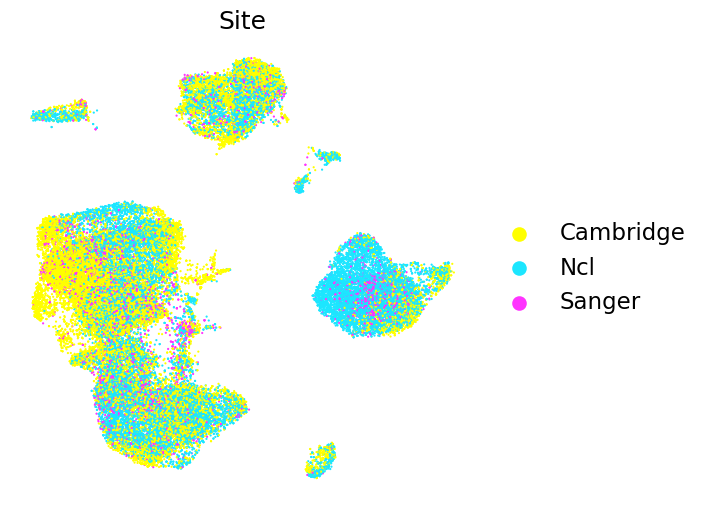

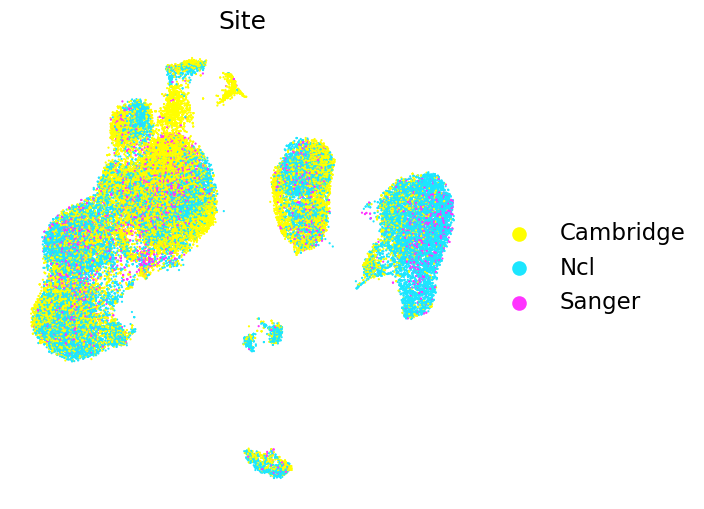

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


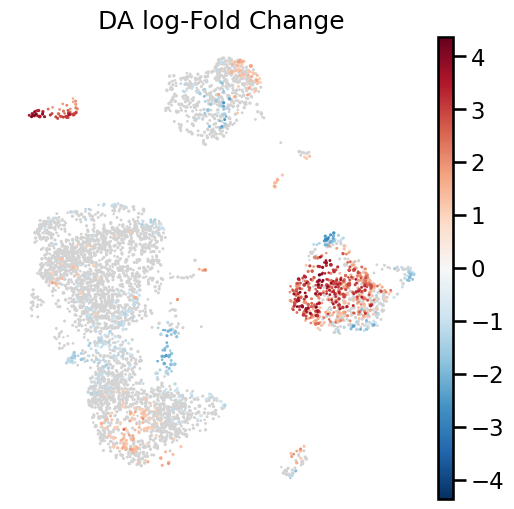

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


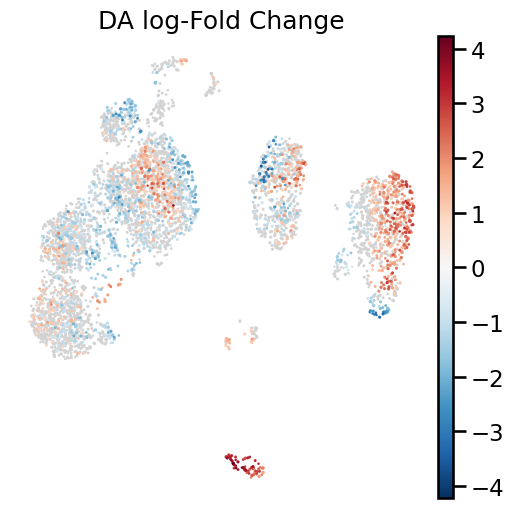

In [58]:
## Supplementary figure
milopy.utils.build_nhood_graph(adata)
milopy.utils.build_nhood_graph(adata_c)
# del adata.uns['donor_id_colors'] 
sns.set_context('talk')
with rc_context({'figure.figsize':[6,6]}):
#     sc.pl.umap(adata, color=['total_counts'], legend_loc='right margin', size=30, palette=sc.pl.palettes.godsnot_102, groups=['Platelets'], vmax=6000);
    sc.pl.umap(adata, color=['donor_id'], legend_loc='none', size=10, frameon=False, title = "Donor ID", save='PAC_donor.png');
    sc.pl.umap(adata_c, color=['donor_id'], legend_loc='none', size=10, frameon=False, title = "Donor ID", save='PC_donor.png');
    sc.pl.umap(adata[np.random.choice(adata.obs_names, adata.n_obs)], color=['Site'], legend_loc='right margin', 
               size=10, palette=sc.pl.palettes.godsnot_102, frameon=False, title = "Site", save='PAC_site.png');
    sc.pl.umap(adata_c[np.random.choice(adata_c.obs_names, adata.n_obs)], color=['Site'], legend_loc='right margin', 
               size=10, palette=sc.pl.palettes.godsnot_102, frameon=False, title = "Site", save='PC_site.png');
    milopy.plot.plot_nhood_graph(adata, min_size=0.1, save='PAC_miloDA.png')
    milopy.plot.plot_nhood_graph(adata_c, min_size=0.1, save='PC_miloDA.png')

In [72]:

print(f"# donors Atlas: {adata_atlas.obs.donor_id.unique().shape[0]}")
print(f"# donors COVID: {adata[adata.obs['Status'] == 'Covid'].obs.donor_id.unique().shape[0]}")
print(f"# donors ctrl: {adata[adata.obs['Status'] == 'Healthy'].obs.donor_id.unique().shape[0]}")

print(f"# studies Atlas: {adata_atlas.obs.dataset_id.unique().shape[0]}")

# donors Atlas: 1219
# donors COVID: 90
# donors ctrl: 23
# studies Atlas: 12


## Plot recovery

In [18]:
milopy.utils.annotate_nhoods(adata, 'author_cell_type_broad')
milopy.utils.annotate_nhoods(adata_c, 'author_cell_type_broad')

In [19]:
nhood_adata = adata.uns['nhood_adata'].copy()
nhood_adata_c = adata_c.uns['nhood_adata'].copy()

pl_cell_types = nhood_adata.obs['nhood_annotation'].value_counts().index
pl_cell_types = pl_cell_types[pl_cell_types != 'nan']

df1 = nhood_adata.obs[['nhood_IFN_signature', 'logFC', "SpatialFDR", 'nhood_annotation']]
df1['design'] = 'ACR'
df2 = nhood_adata_c.obs[['nhood_IFN_signature', 'logFC', "SpatialFDR", 'nhood_annotation']]
df2['design'] = 'CR'
pl_df = pd.concat([df1,df2])
# pl_cell_types_c = nhood_adata_c.obs.loc[nhood_adata_c.obs['nhood_IFN_signature'] > 0.1, 'nhood_annotation'].astype('str').unique()


/tmp/ipykernel_8908/4098695545.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['design'] = 'ACR'
/tmp/ipykernel_8908/4098695545.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['design'] = 'CR'


In [21]:
%%R -i pl_df
head(pl_df)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


  nhood_IFN_signature      logFC  SpatialFDR nhood_annotation design
1         -0.00220008 -0.2194488 0.773792012          NK_16hi    ACR
2         -0.06581493 -0.5853851 0.271597767            CD8_T    ACR
3         -0.07545920 -0.2437837 0.751638382           B_cell    ACR
4         -0.06753626  0.2168581 0.777359813            CD4_T    ACR
5         -0.14077664 -0.2466057 0.766543201            CD4_T    ACR
6         -0.02367600 -1.4926319 0.005747825            CD4_T    ACR


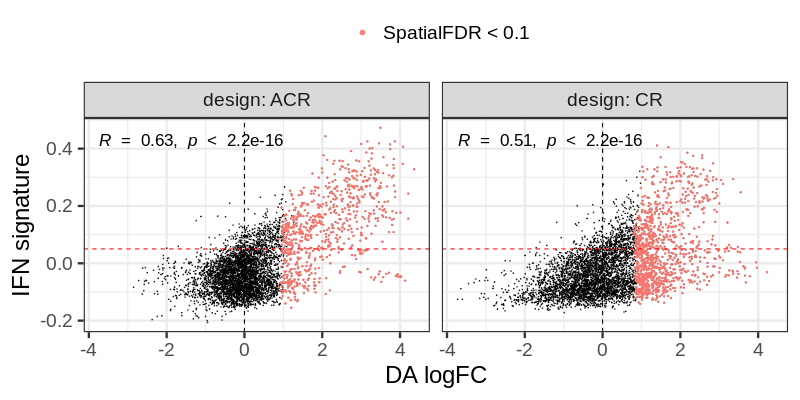

In [22]:
%%R -w 800 -h 400 -i figdir
pl_df %>%
    group_by(nhood_annotation, design) %>%
    ggplot(aes(x=logFC, y=nhood_IFN_signature)) +
    geom_point(size=0.2, alpha=0.7) +
    geom_point(data = . %>% filter(SpatialFDR < 0.1 & logFC > 0), aes(color='SpatialFDR < 0.1'), size=0.5, alpha=0.9) +
    facet_wrap(design~., labeller='label_both') +
    guides(color=guide_legend(title='', override.aes = list(size=2))) +
    theme_bw(base_size=24) +
    geom_vline(xintercept=0, linetype=2) +
    geom_hline(yintercept=0.05, linetype='dashed', color='red') +
    xlab("DA logFC") + ylab("IFN signature") +
    theme(legend.position='top') +
    ggpubr::stat_cor(size=6) +
    ggsave(paste0(figdir, 'IFNVSlogFC_all_ggplot.png'), width=12, height=6) +
    ggsave(paste0(figdir, 'IFNVSlogFC_all_ggplot.pdf'), width=12, height=6)

In [28]:
%%R
install.packages('cocor')
library(cocor)

* installing *source* package ‘cocor’ ...
** package ‘cocor’ successfully unpacked and MD5 sums checked
** using staged installation
** R
** data
** inst
** byte-compile and prepare package for lazy loading
** help
*** installing help indices
** building package indices
** testing if installed package can be loaded from temporary location
** testing if installed package can be loaded from final location
** testing if installed package keeps a record of temporary installation path
* DONE (cocor)


In [47]:
%%R
cocor_res <- cocor(formula = ~ logFC + nhood_IFN_signature | logFC + nhood_IFN_signature, 
      data = split(pl_df, pl_df$design))
cocor_res


  Results of a comparison of two correlations based on independent groups

Comparison between r1.jk (logFC, nhood_IFN_signature) = 0.6346 and r2.hm (logFC, nhood_IFN_signature) = 0.5097
Difference: r1.jk - r2.hm = 0.1249
Data: ACR: j = logFC, k = nhood_IFN_signature; CR: h = logFC, m = nhood_IFN_signature
Group sizes: n1 = 4789, n2 = 4846
Null hypothesis: r1.jk is equal to r2.hm
Alternative hypothesis: r1.jk is not equal to r2.hm (two-sided)
Alpha: 0.05

fisher1925: Fisher's z (1925)
  z = 9.1608, p-value = 0.0000
  Null hypothesis rejected

zou2007: Zou's (2007) confidence interval
  95% confidence interval for r1.jk - r2.hm: 0.0981 0.1518
  Null hypothesis rejected (Interval does not include 0)



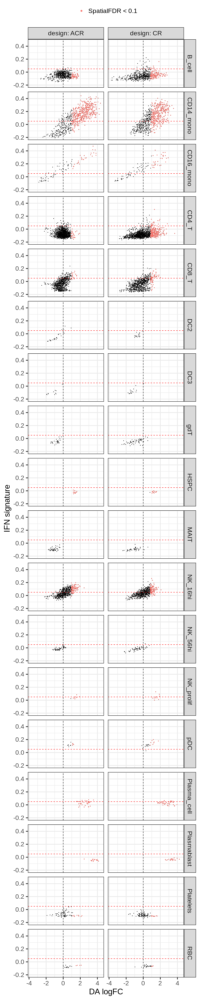

In [94]:
%%R -w 600 -h 3000
pl_df %>%
# group_by(nhood_annotation, design) %>%
# mutate(n_DA = sum(logFC > 1))  %>%
# ungroup() %>%
# filter(n_DA > 5) %>%
ggplot(aes(x=logFC, y=nhood_IFN_signature)) +
geom_point(size=0.3, alpha=0.9) +
geom_point(data = . %>% filter(SpatialFDR < 0.1 & logFC > 0), aes(color='SpatialFDR < 0.1'), size=0.5, alpha=0.9) +
facet_grid(nhood_annotation~design, labeller=labeller(design=label_both)) +
guides(color=guide_legend(title='', override.aes = list(size=2))) +
theme_bw(base_size=24) +
geom_vline(xintercept=0, linetype=2) +
geom_hline(yintercept=0.05, linetype='dashed', color='red') +
xlab("DA logFC") + ylab("IFN signature") +
theme(legend.position='top') +
ggsave(paste0(figdir, 'IFNVSlogFC_cts_ggplot.png'), width=8, height=32) +
ggsave(paste0(figdir, 'IFNVSlogFC_cts_ggplot.pdf'), width=8, height=32)

### Check IFN-low positives

In [43]:
order_cts_acr = nhood_adata.obs.groupby('nhood_annotation').mean()['nhood_IFN_signature'].sort_values().index
order_cts_cr = nhood_adata_c.obs.groupby('nhood_annotation').mean()['nhood_IFN_signature'].sort_values().index

/tmp/ipykernel_4395/1852291221.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  order_cts_acr = nhood_adata.obs.groupby('nhood_annotation').mean()['nhood_IFN_signature'].sort_values().index
/tmp/ipykernel_4395/1852291221.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  order_cts_cr = nhood_adata_c.obs.groupby('nhood_annotation').mean()['nhood_IFN_signature'].sort_values().index


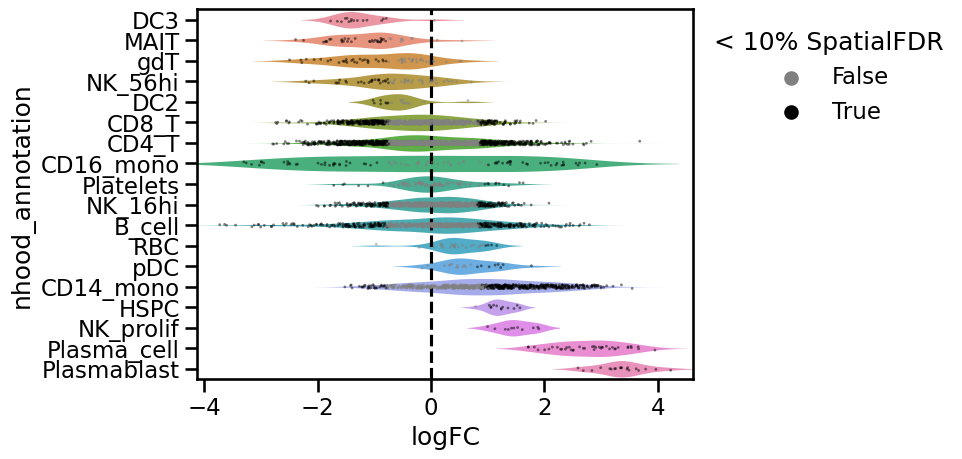

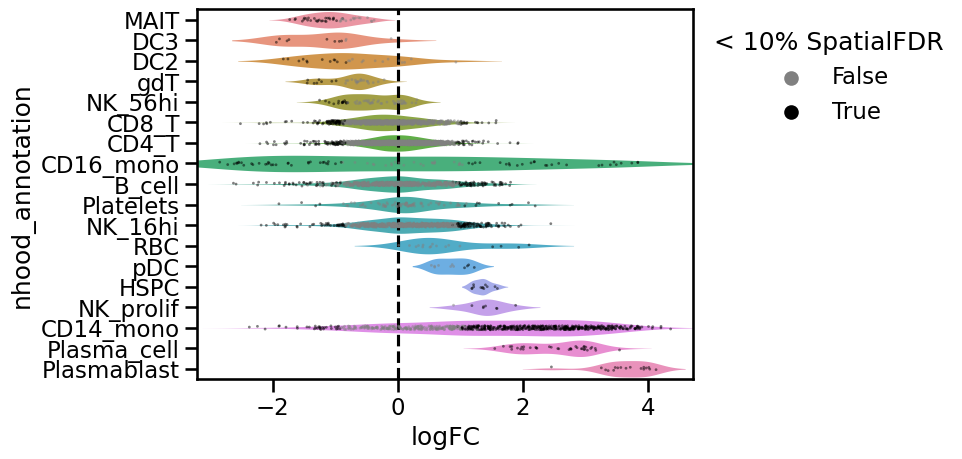

In [89]:
milopy.plot.plot_DA_beeswarm(adata_c);
plt.show()
milopy.plot.plot_DA_beeswarm(adata)

In [68]:
mki67_id = adata.var[adata.var_names == 'MKI67']['gene_id'].astype('str')[0]
adata_c.obs['MKI67_expression'] = adata_c[:, mki67_id].X.toarray()
milopy.utils.annotate_nhoods_continuous(adata_c, 'MKI67_expression')

In [81]:
adata.obs['MKI67_expression'] = adata[:, 'MKI67'].X.toarray()
milopy.utils.annotate_nhoods_continuous(adata, 'MKI67_expression')

In [82]:
nhood_acr_df = adata.uns['nhood_adata'].obs.copy()
nhood_acr_df['design'] = 'ACR'
nhood_cr_df = adata_c.uns['nhood_adata'].obs.copy()
nhood_cr_df['design'] = 'CR'
nhood_df = pd.concat([nhood_acr_df, nhood_cr_df])

In [83]:
%%R -i nhood_df
head(nhood_df)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


                                         index_cell kth_distance
1 10_1038_s41591_021_01329_2-S12_GACTGCGTCCTTTCGG-1    0.8821934
2 10_1038_s41591_021_01329_2-S11_CGGTTAATCGGATGGA-1    0.7139379
3 10_1038_s41591_021_01329_2-S12_CTGTGCTAGCTCCTCT-1    0.8985550
4 10_1038_s41591_021_01329_2-S11_CTTCTCTGTACTTAGC-1    0.7684850
5 10_1038_s41591_021_01329_2-S12_CGGACACTCAGCTTAG-1    0.6299251
6 10_1038_s41591_021_01329_2-S12_ACACCCTTCGCGCCAA-1    1.2708477
  nhood_annotation nhood_annotation_frac      logFC   logCPM          F
1          NK_16hi             0.9825581 -0.2194488 8.829422  0.3600667
2            CD8_T             0.7815126 -0.5853851 9.046490  2.8859171
3           B_cell             0.9516129 -0.2437837 8.903499  0.4305657
4            CD4_T             0.9629630  0.2168581 8.894203  0.3538933
5            CD4_T             0.9728261 -0.2466057 8.872489  0.3774968
6            CD4_T             0.6363636 -1.4926319 9.056346 12.0958361
        PValue         FDR  SpatialFDR nh

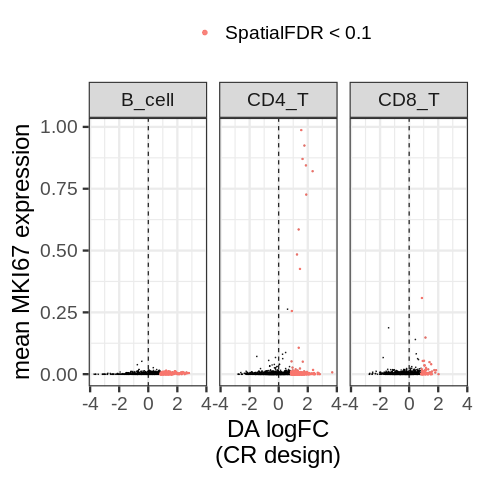

In [96]:
%%R 
nhood_df %>%
filter(nhood_annotation %in% c("CD4_T", "CD8_T", 'B_cell')) %>%
filter(design == 'CR') %>%
ggplot(aes(logFC, nhood_MKI67_expression)) +
    geom_point(size=0.2, alpha=0.7) +
    geom_point(data = . %>% filter(SpatialFDR < 0.1 & logFC > 0), aes(color='SpatialFDR < 0.1'), size=0.5, alpha=0.9) +
    facet_wrap(nhood_annotation~.) +
    guides(color=guide_legend(title='', override.aes = list(size=2))) +
    theme_bw(base_size=24) +
    geom_vline(xintercept=0, linetype=2) +
    xlab("DA logFC\n(CR design)") + ylab("mean MKI67 expression") +
    theme(legend.position='top') +
    ggsave(paste0(figdir, 'CR_MKI67VSlogFC_all_ggplot.png'), width=12, height=6) +
    ggsave(paste0(figdir, 'CR_MKI67VSlogFC_all_ggplot.pdf'), width=12, height=6)

In [246]:
milopy.utils.annotate_nhoods(adata, 'author_cell_type')
milopy.utils.annotate_nhoods(adata_c, 'author_cell_type')

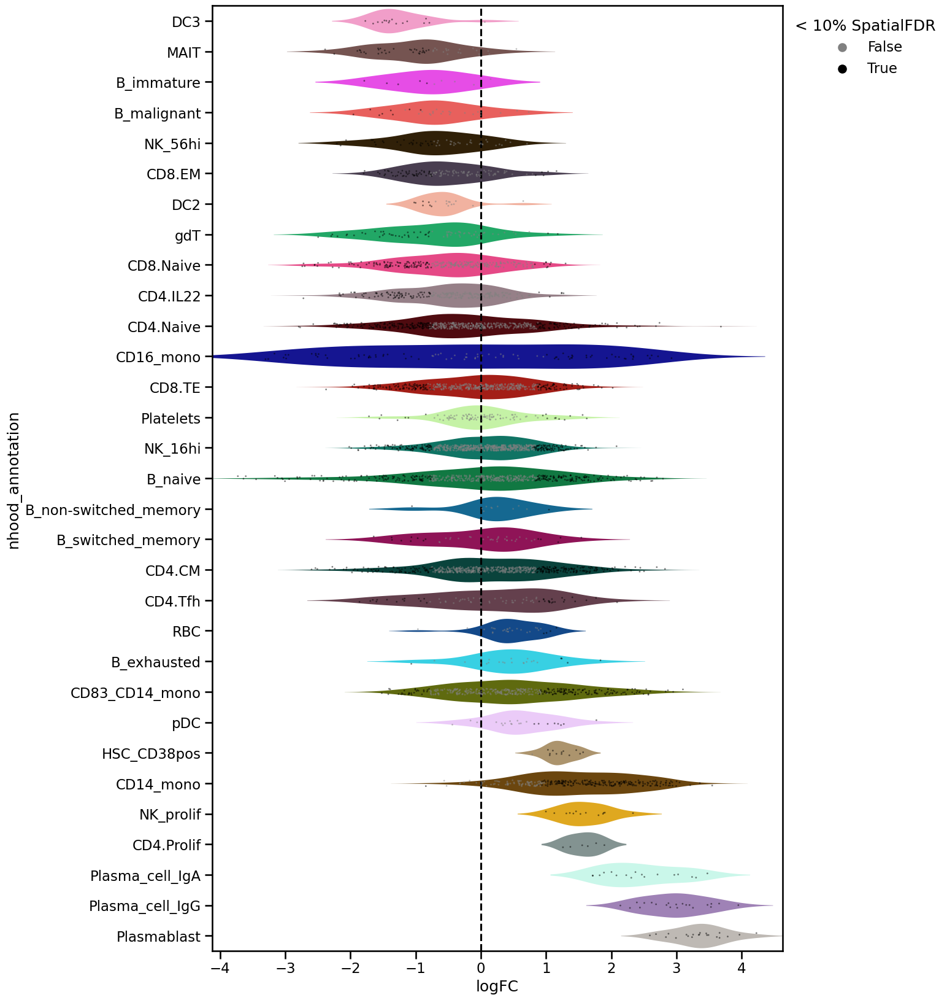

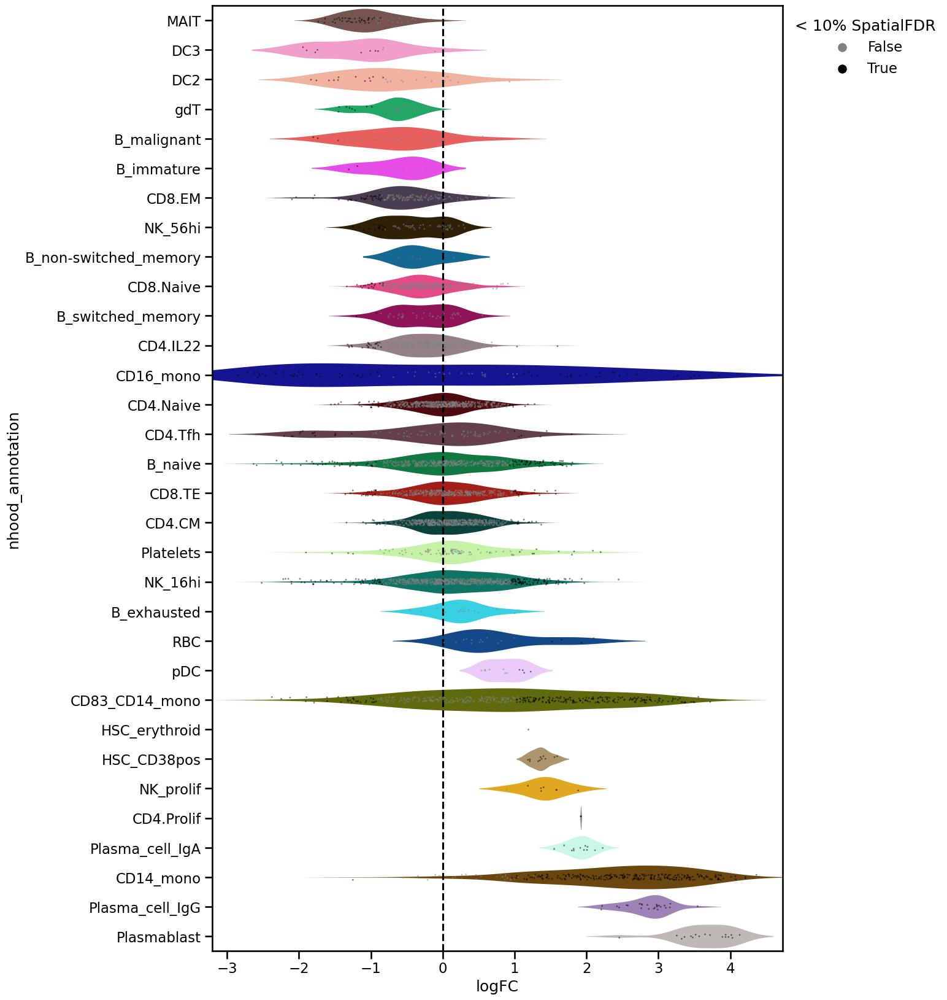

In [248]:
with rc_context({'figure.figsize':[12,20]}):
    milopy.plot.plot_DA_beeswarm(adata_c);
    plt.show()
    milopy.plot.plot_DA_beeswarm(adata)

In [252]:
nhood_df_acr = adata.uns['nhood_adata'].obs.copy()
nhood_df_cr = adata_c.uns['nhood_adata'].obs.copy()
nhood_df_acr['design'] = "ACR"
nhood_df_cr['design'] = "CR"
nh_df = pd.concat([nhood_df_cr, nhood_df_acr])

In [253]:
%%R -i nh_df
head(nh_df)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


                                            index_cell kth_distance
1 10_1038_s41591_021_01329_2-BGCV01_TGGGCGTGTCGCTTTC-1     1.565102
2 10_1038_s41591_021_01329_2-BGCV01_TAGTTGGGTATGCTTG-1     1.403343
3 10_1038_s41591_021_01329_2-BGCV01_ATGGGAGTCCCATTTA-1     1.355805
4 10_1038_s41591_021_01329_2-BGCV01_ACGCCGAGTGAAATCA-1     1.285266
5 10_1038_s41591_021_01329_2-BGCV01_GTCATTTTCGCTGATA-1     1.357077
6 10_1038_s41591_021_01329_2-BGCV01_GATTCAGAGGGTTCCC-1     1.265132
  nhood_annotation nhood_annotation_frac       logFC   logCPM           F
1          NK_16hi             0.4705882 -1.69037556 8.847513 23.53994743
2          NK_16hi             0.9225352  0.06809853 8.810621  0.03176861
3           CD4.CM             0.3903743 -0.51238337 8.963314  1.73598730
4          NK_16hi             0.9121951 -0.57317392 8.997533  2.49774128
5          NK_16hi             0.9757576 -0.41248521 8.889545  1.27260129
6          B_naive             0.8791946 -0.27122638 8.806710  0.51189149
      

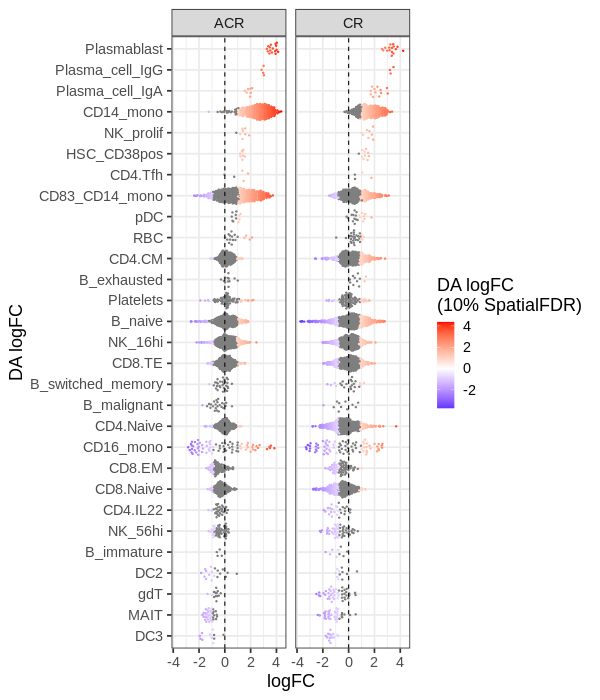

In [276]:
%%R -h 700 -w 600
nh_df %>%
filter(nhood_annotation_frac > 0.5) %>%
mutate(signif=ifelse(SpatialFDR < 0.1, logFC, NA)) %>%
group_by(nhood_annotation)%>%
mutate(mean_lfc_val = ifelse(!is.na(signif), logFC, 0)) %>%
mutate(mean_lfc = mean(mean_lfc_val)) %>%
ungroup() %>%
arrange(mean_lfc) %>%
mutate(nhood_annotation=factor(nhood_annotation, levels=unique(nhood_annotation))) %>%
ggplot(aes(nhood_annotation, logFC, color=signif)) + 
    ggbeeswarm::geom_quasirandom(size=0.5) +
        coord_flip() +
        facet_wrap(design~.) +
        scale_color_gradient2(high='red', mid='white', low='blue', name='DA logFC\n(10% SpatialFDR)') +
        theme_bw(base_size=18) +
        geom_hline(yintercept=0, linetype=2) +
        xlab('Nhood annotation\n(original fine annotation)') + xlab('DA logFC') +
        ggsave(paste0(figdir, 'beeswarm_fine_anno.png'), width=10, height=12) +
        ggsave(paste0(figdir, 'beeswarm_fine_anno.pdf'), width=10, height=12)

In [153]:
# scipy.stats.pearsonr(nhood_adata_c.obs['logFC'], nhood_adata_c.obs['nhood_IFN_signature'])
# scipy.stats.pearsonr(nhood_adata.obs['logFC'], nhood_adata.obs['nhood_IFN_signature'])
from sklearn.metrics import precision_recall_curve, auc

min_sign = 0.05
nhood_adata.obs['is_IFN_activated'] = nhood_adata.obs['nhood_IFN_signature'] > min_sign
nhood_adata_c.obs['is_IFN_activated'] = nhood_adata_c.obs['nhood_IFN_signature'] > min_sign

pr, rec, _ = precision_recall_curve(nhood_adata_c.obs['is_IFN_activated'], nhood_adata_c.obs['logFC'])
auprc_df_c = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
auprc_df_c['AUPRC'] = auc(rec, pr)
auprc_df_c['design'] = 'PC'
auprc_df_c['thresh'] = nhood_adata_c.obs['is_IFN_activated'].sum()/nhood_adata_c.n_obs

pr, rec, _ = precision_recall_curve(nhood_adata.obs['is_IFN_activated'], nhood_adata.obs['logFC'])
auprc_df = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
auprc_df['AUPRC'] = auc(rec, pr)
auprc_df['design'] = 'PAC'
auprc_df['thresh'] = nhood_adata.obs['is_IFN_activated'].sum()/nhood_adata.n_obs 

auprc_df = pd.concat([auprc_df, auprc_df_c])

In [116]:
%%R -i auprc_df
head(auprc_df)

  Precision    Recall     AUPRC design    thresh
1 0.2049663 1.0000000 0.6693779    PAC 0.2033828
2 0.2047990 0.9989733 0.6693779    PAC 0.2033828
3 0.2048421 0.9989733 0.6693779    PAC 0.2033828
4 0.2048852 0.9989733 0.6693779    PAC 0.2033828
5 0.2049284 0.9989733 0.6693779    PAC 0.2033828
6 0.2049716 0.9989733 0.6693779    PAC 0.2033828


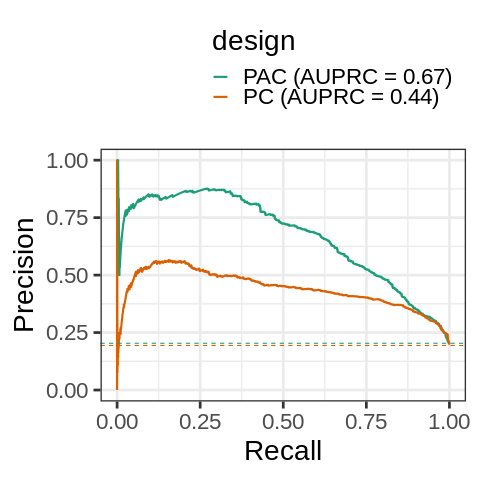

In [134]:
%%R
auprc_df %>%
mutate(design = str_c(design, ' (AUPRC = ', round(AUPRC, 2), ')')) %>%
ggplot(aes(Recall, Precision, group=design, color=design)) +
geom_line(size=1) +
geom_hline(linetype=2, aes(yintercept=thresh, color=design)) +
scale_color_brewer(palette='Dark2') +
guides(color=guide_legend(ncol=1, title.position='top')) +
theme_bw(base_size=28) +
theme(legend.position='top', legend.justification='right') +
ggsave(paste0(figdir, 'PR_curves_IFN.png'), width=6, height=8) +
ggsave(paste0(figdir, 'PR_curves_IFN.pdf'), width=6, height=8)

In [136]:
milopy.utils.annotate_nhoods(adata, 'author_cell_type')
milopy.utils.annotate_nhoods(adata_c, 'author_cell_type')

## Compare with _de novo_ integration including disease cases

In [137]:
data_dir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/'
adata_p = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.design._PAC.h5ad')

## Add dataset specific obs
new_obs = stephenson_obs.loc[[x.split('10_1038_s41591_021_01329_2-')[-1] for x in adata_p.obs_names]]
new_obs.index = adata_p.obs_names
adata_p.obs = pd.concat([new_obs.loc[:,~new_obs.columns.isin(adata_p.obs.columns)], adata_p.obs], 1)


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:7: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  import sys


In [138]:
data_dir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/'
adata_pc = sc.read_h5ad(data_dir + 'PBMC_COVID.subsample500cells.design._PC.h5ad')


## Add dataset specific obs
new_obs = stephenson_obs.loc[[x.split('10_1038_s41591_021_01329_2-')[-1] for x in adata_pc.obs_names]]
new_obs.index = adata_pc.obs_names
adata_pc.obs = pd.concat([new_obs.loc[:,~new_obs.columns.isin(adata_pc.obs.columns)], adata_pc.obs], 1)


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  


In [139]:
run_milo(adata_p, 'P', 'C', sample_col='sample_id', annotation_col='cell_type', design='~Site+is_query')
run_milo(adata_pc, 'P', 'C', sample_col='sample_id', annotation_col='cell_type', design='~Site+is_query')

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/scipy/sparse/base.py:595: RuntimeWarning: invalid value encountered in true_divide
  return np.true_divide(self.todense(), other)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/rpy2/robjects/vectors.py:980: UserWarning: R object inheriting from "POSIXct" but without attribute "tzone".
  warnings.warn('R object inheriting from "POSIXct" but without '
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/milopy/core.py:272: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only
  nhood_adata.obs = pd.concat([nhood_adata.obs, res], 1)
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/an

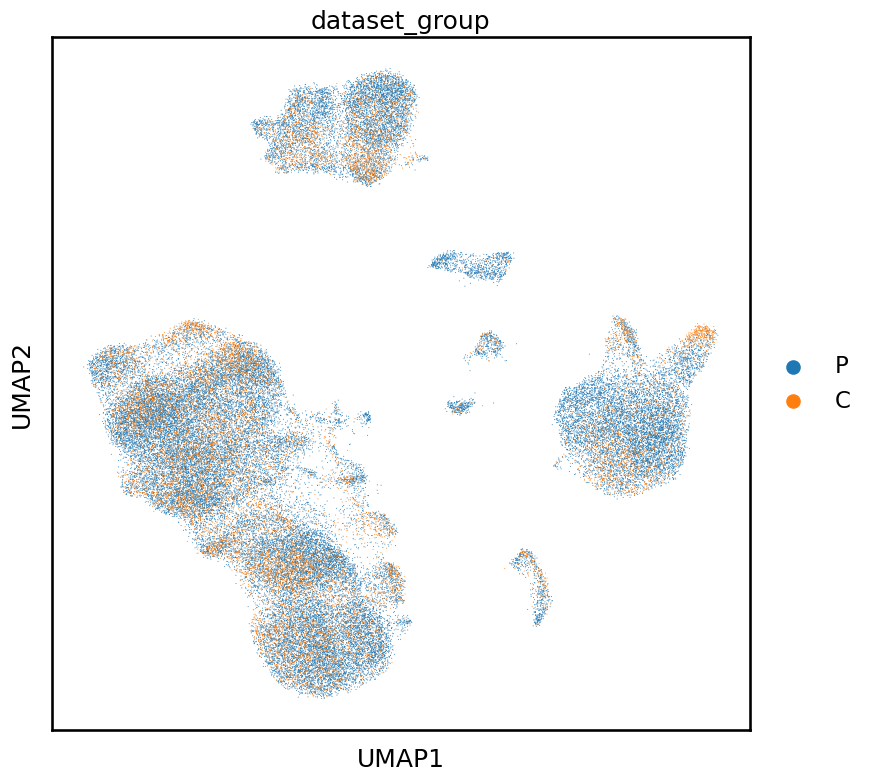

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


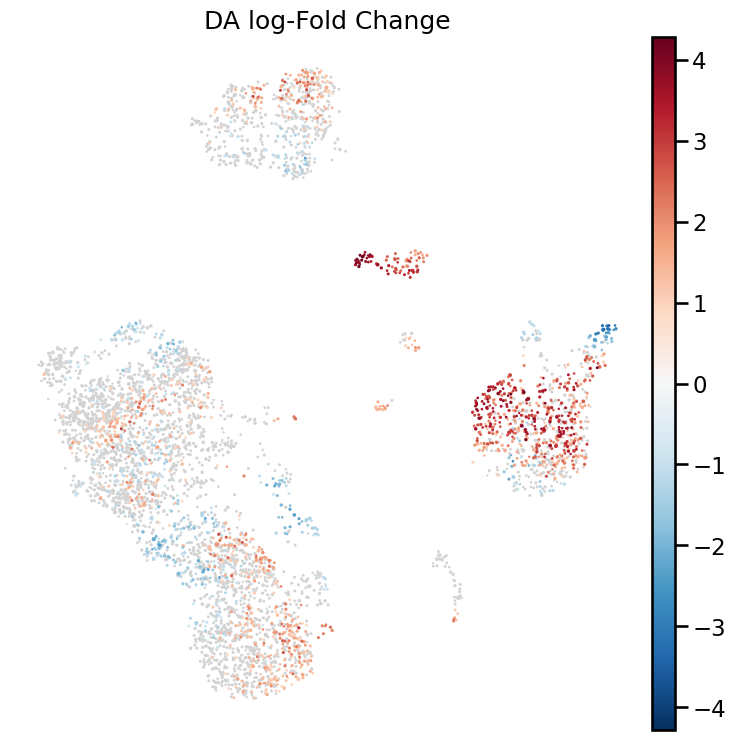

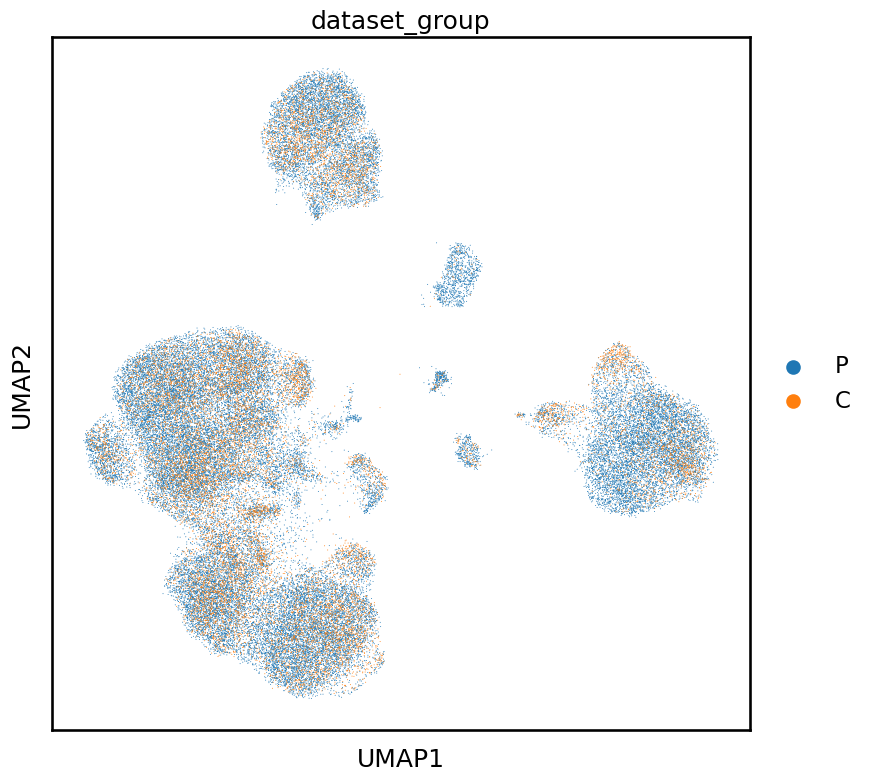

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


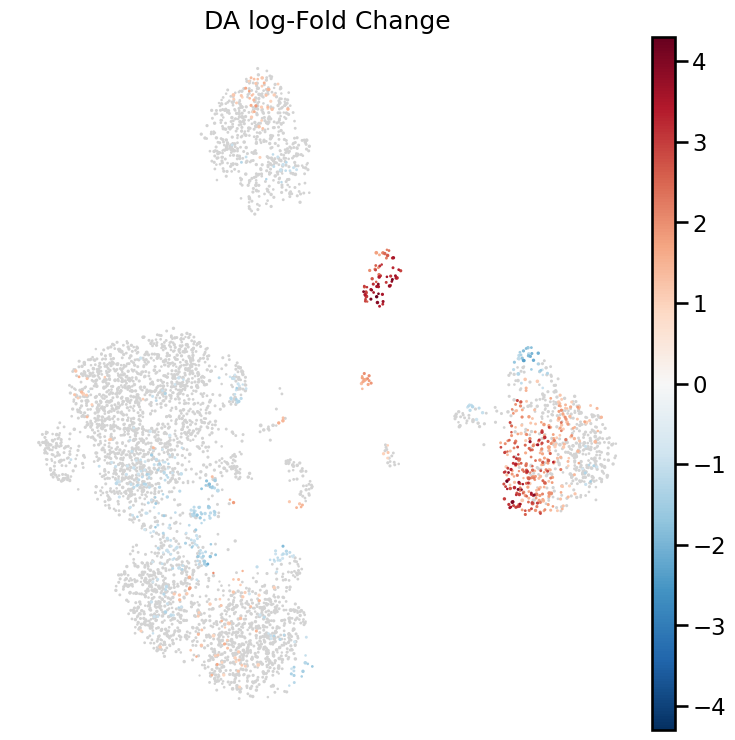

In [140]:
milopy.utils.build_nhood_graph(adata_p)
milopy.utils.build_nhood_graph(adata_pc)
with rc_context({'figure.figsize':[9,9]}):
    sc.pl.umap(adata_p, color='dataset_group')
    milopy.plot.plot_nhood_graph(adata_p, min_size=0.1)
    sc.pl.umap(adata_pc, color='dataset_group')
    milopy.plot.plot_nhood_graph(adata_pc, min_size=0.1)

In [179]:
adata_p.obs['author_cell_type_broad'] = [anno_labels_dict[x] for x in adata_p.obs['author_cell_type']]
adata_pc.obs['author_cell_type_broad'] = [anno_labels_dict[x] for x in adata_pc.obs['author_cell_type']]

In [184]:
milopy.utils.annotate_nhoods(adata_p, 'author_cell_type_broad')
adata_p.obs['IFN_signature'] = adata.obs.loc[adata_p.obs_names, 'IFN_signature']
milopy.utils.annotate_nhoods_continuous(adata_p, "IFN_signature")
nhood_adata_p = adata_p.uns['nhood_adata'].copy()

milopy.utils.annotate_nhoods(adata_pc, 'author_cell_type_broad')
adata_pc.obs['IFN_signature'] = adata.obs.loc[adata_pc.obs_names, 'IFN_signature']
milopy.utils.annotate_nhoods_continuous(adata_pc, "IFN_signature")
nhood_adata_pc = adata_pc.uns['nhood_adata'].copy()

In [185]:
from sklearn.metrics import precision_recall_curve, auc

min_sign = 0.05
nhood_adata.obs['is_IFN_activated'] = nhood_adata.obs['nhood_IFN_signature'] > min_sign
nhood_adata_c.obs['is_IFN_activated'] = nhood_adata_c.obs['nhood_IFN_signature'] > min_sign
nhood_adata_p.obs['is_IFN_activated'] = nhood_adata_p.obs['nhood_IFN_signature'] > min_sign
nhood_adata_pc.obs['is_IFN_activated'] = nhood_adata_pc.obs['nhood_IFN_signature'] > min_sign

pr, rec, _ = precision_recall_curve(nhood_adata_p.obs['is_IFN_activated'], nhood_adata_p.obs['logFC'])
auprc_df_p = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
auprc_df_p['AUPRC'] = auc(rec, pr)
auprc_df_p['design'] = 'PAC joint'
auprc_df_p['thresh'] = nhood_adata_p.obs['is_IFN_activated'].sum()/nhood_adata_p.n_obs

pr, rec, _ = precision_recall_curve(nhood_adata_pc.obs['is_IFN_activated'], nhood_adata_pc.obs['logFC'])
auprc_df_pc = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
auprc_df_pc['AUPRC'] = auc(rec, pr)
auprc_df_pc['design'] = 'PC joint'
auprc_df_pc['thresh'] = nhood_adata_pc.obs['is_IFN_activated'].sum()/nhood_adata_pc.n_obs

pr, rec, _ = precision_recall_curve(nhood_adata_c.obs['is_IFN_activated'], nhood_adata_c.obs['logFC'])
auprc_df_c = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
auprc_df_c['AUPRC'] = auc(rec, pr)
auprc_df_c['design'] = 'PC'
auprc_df_c['thresh'] = nhood_adata_c.obs['is_IFN_activated'].sum()/nhood_adata_c.n_obs

pr, rec, _ = precision_recall_curve(nhood_adata.obs['is_IFN_activated'], nhood_adata.obs['logFC'])
auprc_df = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
auprc_df['AUPRC'] = auc(rec, pr)
auprc_df['design'] = 'PAC'
auprc_df['thresh'] = nhood_adata.obs['is_IFN_activated'].sum()/nhood_adata.n_obs 

auprc_df = pd.concat([auprc_df, auprc_df_c, auprc_df_p, auprc_df_pc])

In [13]:
%%R -i auprc_df
head(auprc_df)

UsageError: Cell magic `%%R` not found.


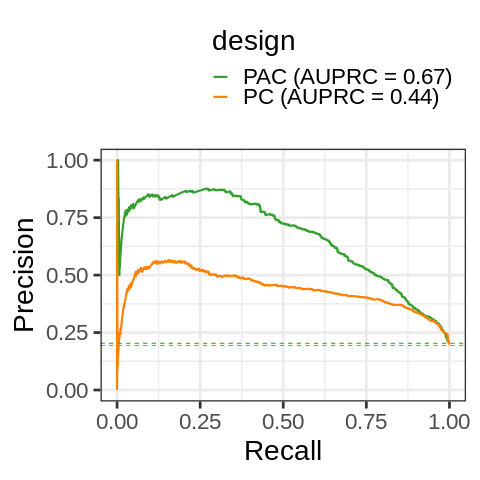

In [187]:
%%R
design_pal <- RColorBrewer::brewer.pal("Paired", n=10)[c(4,3,8,7)]

auprc_df %>%
    mutate(design = str_c(design, ' (AUPRC = ', round(AUPRC, 2), ')')) %>%
    ggplot(aes(Recall, Precision, group=design, color=design)) +
    geom_line(size=1) +
    geom_hline(linetype=2, aes(yintercept=thresh, color=design)) +
    scale_color_manual(values=design_pal) +
    guides(color=guide_legend(ncol=1, title.position='top')) +
    theme_bw(base_size=28) +
    theme(legend.position='top', legend.justification='right') +
    ggsave(paste0(figdir, 'PR_curves_IFN_joint.png'), width=6, height=8) +
    ggsave(paste0(figdir, 'PR_curves_IFN_joint.pdf'), width=6, height=8)
    
auprc_df %>%
    mutate(design = str_c(design, ' (AUPRC = ', round(AUPRC, 2), ')')) %>%
    filter(!str_detect(design, 'joint')) %>%
    ggplot(aes(Recall, Precision, group=design, color=design)) +
    geom_line(size=1) +
    geom_hline(linetype=2, aes(yintercept=thresh, color=design)) +
    scale_color_manual(values=design_pal[c(1,3)]) +
    guides(color=guide_legend(ncol=1, title.position='top')) +
    theme_bw(base_size=28) +
    theme(legend.position='top', legend.justification='right') +
    ggsave(paste0(figdir, 'PR_curves_IFN.png'), width=6, height=8) +
    ggsave(paste0(figdir, 'PR_curves_IFN.pdf'), width=6, height=8)

In [324]:
df1 = nhood_adata_p.obs[['nhood_IFN_signature', 'logFC', "SpatialFDR", 'nhood_annotation']]
df1['design'] = 'PAC'
df2 = nhood_adata_pc.obs[['nhood_IFN_signature', 'logFC', "SpatialFDR", 'nhood_annotation']]
df2['design'] = 'PC'
pl_df = pd.concat([df1,df2])
# pl_cell_types_c = nhood_adata_c.obs.loc[nhood_adata_c.obs['nhood_IFN_signature'] > 0.1, 'nhood_annotation'].astype('str').unique()


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [325]:
%%R -i pl_df
head(pl_df)

  nhood_IFN_signature      logFC SpatialFDR nhood_annotation design
1         -0.04884111  0.4399212 0.56472722          CD4.Tfh    PAC
2         -0.14655889  0.5881863 0.31498710           CD4.CM    PAC
3         -0.06466249  0.0306197 0.97009168   CD83_CD14_mono    PAC
4          0.11947952  1.3394725 0.01226933   CD83_CD14_mono    PAC
5         -0.15582995 -0.5220446 0.33904163           CD4.CM    PAC
6         -0.06020073  1.2050497 0.03165099           CD4.CM    PAC


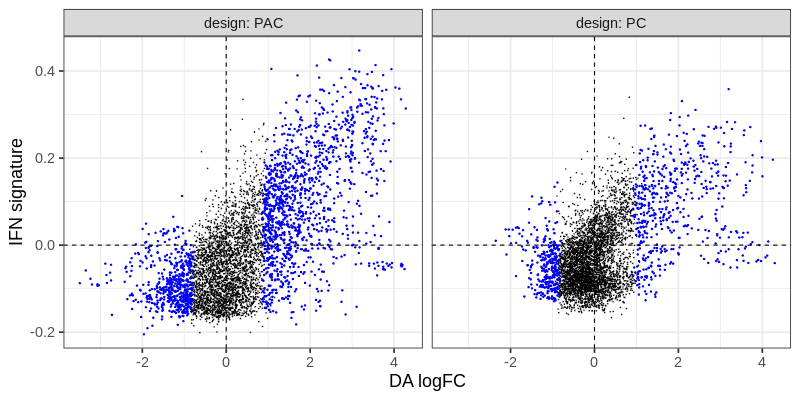

In [326]:
%%R -w 800 -h 400
pl_df %>%
    group_by(nhood_annotation, design) %>%
    mutate(frac_activated = sum(nhood_IFN_signature > 0.1)/n())  %>%
    ggplot(aes(x=logFC, y=nhood_IFN_signature)) +
    geom_point(size=0.2, alpha=0.7) +
    geom_point(data = . %>% filter(SpatialFDR < 0.1), color='blue', size=0.5, alpha=0.9) +
    theme_bw(base_size=18) +
    facet_grid(~design, labeller=label_both) +
    scale_color_brewer(palette='Accent') +
    theme(legend.position='top') +
    geom_vline(xintercept=0, linetype='dashed', color='black') +
    geom_hline(yintercept=0, linetype='dashed', color='black') +
    xlab("DA logFC") + ylab("IFN signature")

### AUPRC by cell type

In [188]:
nhood_adata_pc.obs.nhood_annotation.unique()

array(['NK_16hi', 'B_cell', 'CD4_T', 'CD8_T', 'CD14_mono', 'CD16_mono',
       'gdT', 'MAIT', 'NK_56hi', 'RBC', 'pDC', 'Platelets', 'Plasma_cell',
       'DC3', 'DC2', 'Plasmablast', 'HSPC', 'NK_prolif'], dtype=object)

In [189]:
# def calculate_AUPRC(nhood_adata_p, design_ID):
#     pr, rec, _ = precision_recall_curve(nhood_adata_p.obs['is_IFN_activated'], nhood_adata_p.obs['logFC'])
#     auprc_df_p = pd.DataFrame(np.vstack([pr, rec]).T, columns=['Precision', 'Recall'])
#     auprc_df_p['AUPRC'] = auc(rec, pr)
#     auprc_df_p['design'] = design_ID
#     auprc_df_p['thresh'] = nhood_adata_p.obs['is_IFN_activated'].sum()/nhood_adata_p.n_obs
#     return(auprc_df_p)

# auprc_df_cts = pd.DataFrame()
# for a in nhood_adata.obs.nhood_annotation.unique():
#     auprc_df_p = calculate_AUPRC(nhood_adata_p[nhood_adata_p.obs.nhood_annotation == a], 'PAC joint')
#     auprc_df_pc = calculate_AUPRC(nhood_adata_pc[nhood_adata_pc.obs.nhood_annotation == a], 'PC joint')
#     auprc_df_pac = calculate_AUPRC(nhood_adata[nhood_adata.obs.nhood_annotation == a], 'PAC')
#     auprc_df_c = calculate_AUPRC(nhood_adata_c[nhood_adata_c.obs.nhood_annotation == a], 'PC')
#     auprc_df = pd.concat([auprc_df_c, auprc_df_pc, auprc_df_p, auprc_df_pac])
#     auprc_df['annotation'] = a

# auprc_df_cts = pd.concat([auprc_df_cts, auprc_df])

/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/sklearn/metrics/_ranking.py:681: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]


## Save outputs

In [23]:
milopy.utils.write_milo_adata(adata, filepath=data_dir + 'PBMC_COVID.subsample500cells.design.query_PC_refA.post_milo.h5ad')

## Check IFN-low enriched states

In [13]:
data_dir = '/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/'
adata = milopy.utils.read_milo_adata(data_dir + 'PBMC_COVID.subsample500cells.design.query_PC_refA.post_milo.h5ad')

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [14]:
anno_labels = adata.obs['author_cell_type'].unique()
anno_groups = {}
anno_groups['B_cell'] = [x for x in adata.obs['author_cell_type'].unique() if x.startswith('B_')]
anno_groups['HSPC'] = [x for x in adata.obs['author_cell_type'].unique() if x.startswith('HSC_')]
anno_groups['CD14_mono'] =[x for x in adata.obs['author_cell_type'].unique() if 'CD14_mono' in x]
anno_groups['CD16_mono'] =[x for x in adata.obs['author_cell_type'].unique() if 'CD16_mono' in x]
anno_groups['CD4_T'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("CD4.")]
anno_groups['CD8_T'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("CD8.")]
anno_groups['ILC'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("ILC")]
anno_groups['Plasma_cell'] =[x for x in adata.obs['author_cell_type'].unique() if x.startswith("Plasma_cell")]

for x in anno_labels: 
    if x not in sum(anno_groups.values(), []):
        anno_groups[x] = [x]

anno_labels_dict = {x:k for k,v in anno_groups.items() for x in v}
adata.obs['author_cell_type_broad'] = [anno_labels_dict[x] for x in adata.obs['author_cell_type']]
milopy.utils.annotate_nhoods(adata, anno_col='author_cell_type_broad')

In [15]:
milo_res = adata.uns['nhood_adata'].obs.copy()

In [16]:
mono_res=milo_res[milo_res.nhood_annotation.isin(['CD14_mono', 'CD16_mono'])]

In [49]:
%%R -i mono_res
head(mono_res)

                                          index_cell kth_distance
7  10_1038_s41591_021_01329_2-S11_CTACATTGTCATCGGC-1    0.8488339
9  10_1038_s41591_021_01329_2-S11_CGTCACTGTCATACTG-1    0.7458368
16 10_1038_s41591_021_01329_2-S11_GACTAACCACTTACGA-1    0.8635404
21 10_1038_s41591_021_01329_2-S11_TGGGCGTTCAGTCAGT-1    0.7818075
23 10_1038_s41591_021_01329_2-S11_GTCTCGTAGTTTCCTT-1    0.9215596
25 10_1038_s41591_021_01329_2-S11_AGTGAGGAGGCTCAGA-1    1.1544625
   nhood_annotation nhood_annotation_frac       logFC   logCPM            F
7         CD14_mono             0.9772727 -0.78879948 8.859451  3.969117777
9         CD14_mono             0.9802955  0.49986790 8.967559  1.254272107
16        CD14_mono             1.0000000  0.03823584 8.730108  0.008553883
21        CD14_mono             0.8720379  1.26915138 9.003519  6.943061569
23        CD14_mono             0.9800000  2.82206506 8.790340 28.341172501
25        CD14_mono             0.9935898 -0.68602556 8.801006  3.122999346
      

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


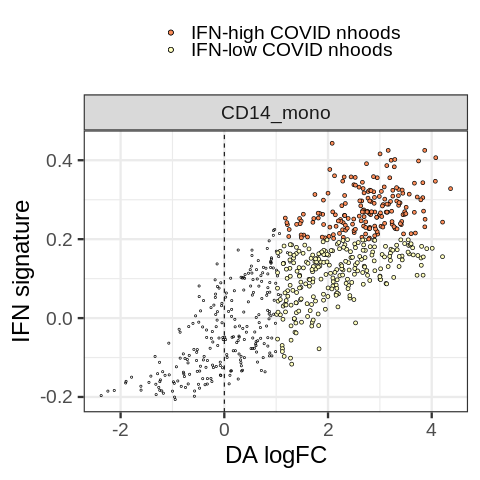

In [199]:
%%R
mono_res %>%
    filter(nhood_annotation == 'CD14_mono') %>%
    ggplot(aes(logFC, nhood_IFN_signature)) +
    geom_point(size=0.7, shape=21) +
    geom_point(data=. %>% filter(SpatialFDR < 0.1 & logFC > 1 & nhood_IFN_signature > 0.2), 
               shape=21,
               aes(fill='IFN-high COVID nhoods')) +
    geom_point(data=. %>% filter(SpatialFDR < 0.1 & logFC > 1 & nhood_IFN_signature < 0.2), 
               shape=21,
               aes(fill='IFN-low COVID nhoods')) +
    facet_wrap(nhood_annotation~.) +
    guides(fill=guide_legend(title='', override.aes = list(size=2), ncol=1)) +
    theme_bw(base_size=24) +
    scale_fill_brewer(palette='Spectral', name='') +
    geom_vline(xintercept=0, linetype=2) +
#     geom_hline(yintercept=0, linetype='dashed', color='red') +
    xlab("DA logFC") + ylab("IFN signature") +
    theme(legend.position='top') +
    ggsave(paste0(figdir, 'groups_CD14_monos.png'), height=7, width=7) +
    ggsave(paste0(figdir, 'groups_CD14_monos.pdf'), height=7, width=7)
    

In [64]:
import diff2atlas

def run_glmGamPoi_DE(pbulk_adata, 
                     design = '~ Site + nhood_groups',
                    ref_level = 'in_nhoods_other',
                    contrast = 'nhood_groupsin_nhoods_critical',
                     n_hvgs = 5000):
    '''
    Run R code for DE analysis with glmGamPoi
    
    Params:
    ------
    - pbulk_adata: anndata object with pseudobulked data
    
    '''
    
    ## Define R function
    glmgampoi_str = f'''
        library(SingleCellExperiment)
        library(glmGamPoi)
        library(scran)
        library(scater)

        run_de <- function(args){{
            pbulk_sdata_X <- args[[1]]
            pbulk_sdata_obs <- args[[2]]
            pbulk_sdata_var <- args[[3]]
            n_hvgs <- args[[4]]

            sce <- SingleCellExperiment(assays = list(counts = t(pbulk_sdata_X)), colData = pbulk_sdata_obs)
            sce <- logNormCounts(sce)

            ## Feature selection w scran (just on test cell types)
            dec <- modelGeneVar(sce)
            hvgs <- getTopHVGs(dec, n = n_hvgs)
            subset_sce <- sce[hvgs,]

            ## Fit
            fit <- glm_gp(subset_sce, design = {design}, reference_level = '{ref_level}')

            ## Test 
            de_res <- test_de(fit, contrast = '{contrast}')    
            de_res[,'gene_name'] <- pbulk_sdata_var[hvgs,]['gene_name']
            return(de_res)
        }}'''
    
    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP
    
    ## Get anndata components
    pbulk_sdata_X = pbulk_adata.X.toarray().copy()
    pbulk_sdata_obs = pbulk_adata.obs.copy()
    pbulk_sdata_var = pbulk_adata.var.copy()
    
    r_pkg = STAP(glmgampoi_str, "r_pkg")
    # this was needed for the code to run on jhub
    # if you have a different version of rpy2 you may not need these two lines
    rpy2.robjects.pandas2ri.activate()
    rpy2.robjects.numpy2ri.activate()
    
    # PASS OBJECTS INTO FUNCTION
    args = [pbulk_sdata_X, pbulk_sdata_obs, pbulk_sdata_var, n_hvgs]
    de_res_df = r_pkg.run_de(args).to_csvfile('./DE_results.csv')
    de_res_df = pd.read_csv('./DE_results.csv', index_col=0)
    de_res_df.index = de_res_df['gene_name']
    de_res_df.drop('name', 1, inplace=True)
    os.remove('./DE_results.csv')
    return(de_res_df)

def find_nhood_group_markers(
    adata, 
    test_group: str,
    ctrl_group: str,
    confounders_obs = None,
    nhood_group_obs: str = 'nhood_groups',
    min_n_nhoods: int = 3,
    pbulk_use_layer: str = None,
    n_hvgs: int = 5
    ):
    '''
    Find genes differentially expressed between cells in 2 groups of neighbourhoods
    
    Params:
    -------
    - adata: AnnData object storing nhood info in adata.uns['nhood_adata']
    - design: design formula for the test, passed to glmGamPoi
    - test_group: which neighbourhood group is the test group?
    - ctrl_group: which neighbourhood group is the reference group?
    - nhood_group_obs: the column in adata.uns['nhood_adata'] storing the neighbourhood group information
    - min_n_nhoods: cells are assigned to a neighbourhood group only if it belongs to at least min_n_nhoods neighbourhoods in the group
    - pbulk_use_layer: layer storing counts (if None, adata.X is used) 
    - n_hvgs: how many HVGS to use for the DE test (the more you use, the longer it takes)
    
    Returns:
    --------
    pd.DataFrame storing DE test results
    '''

    ## Find cells in nhoods of interest
    groups = adata.uns['nhood_adata'].obs[nhood_group_obs].dropna().unique()
    for g in groups:
        nhoods_oi = adata.uns['nhood_adata'].obs_names[adata.uns['nhood_adata'].obs[nhood_group_obs] == g]
        diff2atlas.utils.get_cells_in_nhoods(adata, nhoods_oi)
        adata.obs[f'in_nhoods_{g}'] = adata.obs['in_nhoods'].copy()

    ## Find most representative group (cell belongs to mostly to neighbourhoods of that group)
    adata.obs['nhood_groups'] = np.nan
    adata.obs['nhood_groups'] = adata.obs[[f'in_nhoods_{g}' for g in groups]].idxmax(1)
    ## Keep only if cell is in at least min_n_nhoods nhoods of the same group
    adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan 

    ## Make pseudobulk adata for cells if different nhood groups and samples
    sdata = adata[~adata.obs['nhood_groups'].isna()].copy()
    sdata.X = sdata.layers['counts'].copy()
    if confounders_obs is None:
        design = '~ nhood_groups'
        pbulk_sdata = diff2atlas.utils.anndata2pseudobulk(
            sdata, 
            group_by=[adata.uns['nhood_adata'].uns['sample_col'], 'nhood_groups'], 
            min_ncells=1, 
            use_layer=pbulk_use_layer)
    else:
        if isinstance(confounders_obs, str):
            confounder_obs = [confounders_obs]
        design = "~ " + ' + '.join(confounders_obs) + ' + nhood_groups'
        pbulk_sdata = diff2atlas.utils.anndata2pseudobulk(
            sdata, 
            group_by=[nhood_adata.uns['sample_col'], 'nhood_groups'] + confounders_obs, 
            min_ncells=1, 
            use_layer=pbulk_use_layer)
    
    pbulk_sdata.var = adata.var.copy() 
    de_results = run_glmGamPoi_DE(pbulk_sdata, design=design, 
                           ref_level = f'in_nhoods_{ctrl_group}', 
                           contrast = f'nhood_groupsin_nhoods_{test_group}', 
                           n_hvgs=n_hvgs)
    return(de_results)

In [18]:
## Select nhoods of interest
cd14_mono_res = mono_res[mono_res.nhood_annotation == 'CD14_mono']
low_ifn_monos_nhoods = cd14_mono_res.index[(cd14_mono_res.SpatialFDR < 0.1) & (cd14_mono_res.logFC > 0) & (cd14_mono_res.nhood_IFN_signature < 0.2)]
high_ifn_monos_nhoods = cd14_mono_res.index[(cd14_mono_res.SpatialFDR < 0.1) & (cd14_mono_res.logFC > 0) & (cd14_mono_res.nhood_IFN_signature > 0.2)]

In [19]:
other_monos_nhoods = cd14_mono_res.index[~((cd14_mono_res.SpatialFDR < 0.1) & (cd14_mono_res.logFC > 0))]

In [20]:
## Mark nhood groups
nhood_adata = adata.uns['nhood_adata'].copy()
nhood_adata.obs['nhood_groups'] = np.nan
nhood_adata.obs.loc[low_ifn_monos_nhoods, 'nhood_groups'] = 'low_ifn_enr'
nhood_adata.obs.loc[high_ifn_monos_nhoods, 'nhood_groups'] = 'high_ifn_enr'
nhood_adata.obs.loc[other_monos_nhoods, 'nhood_groups'] = 'other_CD14_monos'
adata.uns['nhood_adata'] = nhood_adata.copy()

In [65]:
## Run DE testing
DE_monos_ifn = find_nhood_group_markers(
    adata[adata.obs['author_cell_type'] == 'CD14_mono' ], 
    test_group='low_ifn_enr', 
    ctrl_group='high_ifn_enr', 
    confounders_obs=['Site'],
    n_hvgs = 7500
    )


/nfs/team205/ed6/bin/diff2atlas/diff2atlas/utils.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['in_nhoods'] = in_nhoods
/tmp/ipykernel_10319/3522525962.py:110: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():
/tmp/ipykernel_10319/3522525962.py:67: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  de_res_df.drop('name', 1, inplace=True)


In [66]:
DE_monos_ifn

,pval,adj_pval,f_statistic,df1,df2,lfc,gene_name
gene_name,,,,,,,
IFI27,4.855253e-01,7.758508e-01,0.487977,1,233.831244,-0.338966,IFI27
IFITM1,1.510698e-02,1.146512e-01,5.992048,1,233.831244,-0.870994,IFITM1
IFITM3,1.583460e-02,1.175652e-01,5.906960,1,233.831244,-0.612019,IFITM3
IFI30,1.016861e-19,3.170572e-16,99.280062,1,233.831244,-0.777538,IFI30
IFI6,1.570185e-01,4.739434e-01,2.015630,1,233.831244,-0.353517,IFI6
...,...,...,...,...,...,...,...
ARMCX6,3.398490e-01,6.691818e-01,0.914735,1,233.831244,-0.239128,ARMCX6
AGAP9,4.289123e-02,2.254707e-01,4.144752,1,233.831244,1.184103,AGAP9
C12orf65,5.691454e-02,2.672583e-01,3.661205,1,233.831244,-0.942446,C12orf65


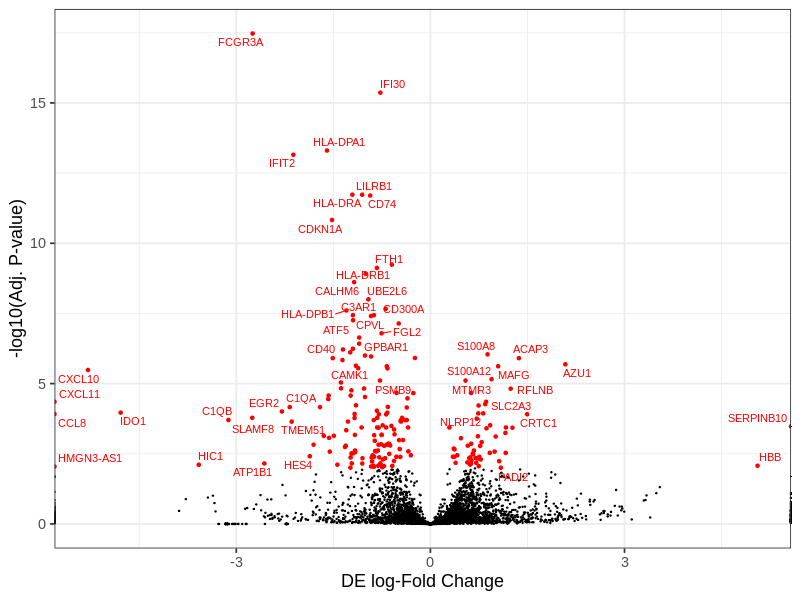

In [176]:
%%R -i DE_monos_ifn -w 800 -h 600 -i figdir
max_lfc = 15
DE_monos_ifn$lfc <- ifelse(abs(DE_monos_ifn$lfc) > max_lfc, sign(DE_monos_ifn$lfc) * Inf, DE_monos_ifn$lfc)
DE_monos_ifn %>%
#     filter(contrast == 'mild_enr-other') %>%
    mutate(signif = adj_pval < 0.01) %>%
    mutate(label = ifelse(signif & (abs(lfc) > 0.75), as.character(gene_name), NA)) %>%
    ggplot(aes(lfc, -log10(adj_pval))) + 
    geom_point(size=0.5) +
    geom_point(data=. %>% filter(signif), color='red') +
    ggrepel::geom_text_repel(aes(label=label), color='red') +
    theme_bw(base_size=18) +
    xlab("DE log-Fold Change") +
    ylab('-log10(Adj. P-value)') +
    ggsave(paste0(figdir, 'volcano_CD14_monos.png'), height=7, width=7) +
    ggsave(paste0(figdir, 'volcano_CD14_monos.pdf'), height=7, width=7) 

In [71]:
data_dir + "CD14_mono.DE_results.csv"

'/lustre/scratch117/cellgen/team205/ed6/PBMC_COVID/CD14_mono.DE_results.csv'

In [70]:
## Save for supplementary
DE_monos_ifn.to_csv(data_dir + "CD14_mono.DE_results.csv")

In [20]:
def assign_cells_2_nhood_group(
    adata, 
    confounders_obs = None,
    nhood_group_obs: str = 'nhood_groups',
    min_n_nhoods: int = 3,
    pbulk_use_layer: str = None,
    ):
    '''
    
    '''
    ## Find cells in nhoods of interest
    groups = adata.uns['nhood_adata'].obs[nhood_group_obs].dropna().unique()
    for g in groups:
        nhoods_oi = adata.uns['nhood_adata'].obs_names[adata.uns['nhood_adata'].obs[nhood_group_obs] == g]
        diff2atlas.utils.get_cells_in_nhoods(adata, nhoods_oi)
        adata.obs[f'in_nhoods_{g}'] = adata.obs['in_nhoods'].copy()

    ## Find most representative group (cell belongs to mostly to neighbourhoods of that group)
    adata.obs['nhood_groups'] = np.nan
    adata.obs['nhood_groups'] = adata.obs[[f'in_nhoods_{g}' for g in groups]].idxmax(1)
    ## Keep only if cell is in at least min_n_nhoods nhoods of the same group
    adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan 

In [54]:
assign_cells_2_nhood_group(adata)

/tmp/ipykernel_21347/2242147816.py:22: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan


In [55]:
groups = adata.uns['nhood_adata'].obs['nhood_groups'].dropna().unique()
min_n_nhoods = 3
adata.obs['nhood_groups'] = np.nan
adata.obs['nhood_groups'] = adata.obs[[f'in_nhoods_{g}' for g in groups]].idxmax(1)
## Keep only if cell is in at least min_n_nhoods nhoods of the same group
adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan 


/tmp/ipykernel_21347/879146469.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan


In [183]:
plt.rcParams['figure.figsize'] = [10, 10]
# n_cells_sev = adata.obs[['nhood_groups', 'Status_on_day_collection_summary', 'Days_from_onset', 'donor_id']].dropna().value_counts().reset_index()
# n_cells_sev['n_cells'] = n_cells_sev[0]

# n_cells_sev
# n_cells_sev = adata_c.obs[['nhood_groups', 'Status_on_day_collection_summary', 'Days_from_onset', 'donor_id']].dropna().value_counts().reset_index()
# n_cells_sev['n_cells'] = n_cells_sev[0]

# n_cells_sev
n_cells_sev = adata.obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id']].dropna()
n_cells_sev['n_cells'] = 1
n_cells_sev = n_cells_sev.groupby(['nhood_groups', 'Status_on_day_collection_summary', 'donor_id']).sum().reset_index()

order_severity = ['Healthy', 'Asymptomatic', 'Mild', "Moderate", "Severe", "Critical"]
# sns.boxplot(data=n_cells_sev, x='Status_on_day_collection_summary', y='n_cells', hue='nhood_groups', order=order_severity)
# sns.stripplot(data=n_cells_sev, x='Status_on_day_collection_summary', y='n_cells', hue='nhood_groups', 
#               color='black', position='dodge',
#               order=order_severity)
# n_cells_sev = n_cells_sev[~n_cells_sev.Days_from_onset.isin(['Healthy', 'LPS', 'Not_known', 'nan'])]

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


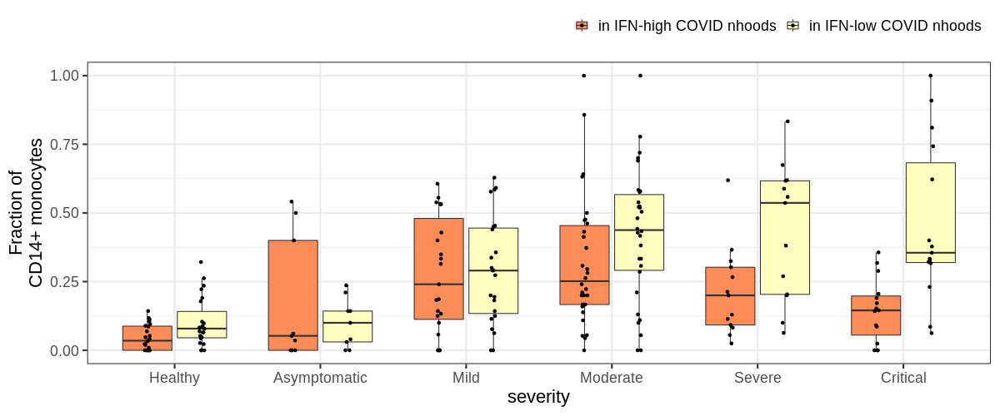

In [185]:
%%R -i order_severity -i n_cells_sev -w 1200 -h 500
n_cells_sev %>%
    filter(Status_on_day_collection_summary %in% order_severity) %>%
    mutate(severity = factor(Status_on_day_collection_summary, levels=order_severity)) %>%
    group_by(donor_id, severity) %>%
    mutate(frac_cells = n_cells/sum(n_cells)) %>%
    ungroup() %>%
    filter(nhood_groups != 'in_nhoods_other_CD14_monos') %>%
    ggplot(aes(severity, frac_cells, fill = nhood_groups)) +
    geom_boxplot(outlier.alpha=0) +
    geom_point(position=position_jitterdodge(jitter.width=0.1)) +
#     facet_wrap(nhood_groups~.) +
#     scale_y_log10() +
    scale_fill_brewer(palette='Spectral', 
                      labels=c('in_nhoods_high_ifn_enr' = 'in IFN-high COVID nhoods', 'in_nhoods_low_ifn_enr' = 'in IFN-low COVID nhoods'),
                      name=''
                     ) +
    ylab('Fraction of\nCD14+ monocytes') +
    theme_bw(base_size=22) +
    theme(legend.position='top', legend.justification=c(1,1)) +
    ggsave(paste0(figdir, 'CD14_monos_severity.png'), height=7, width=10) +
    ggsave(paste0(figdir, 'CD14_monos_severity.pdf'), height=7, width=10) 

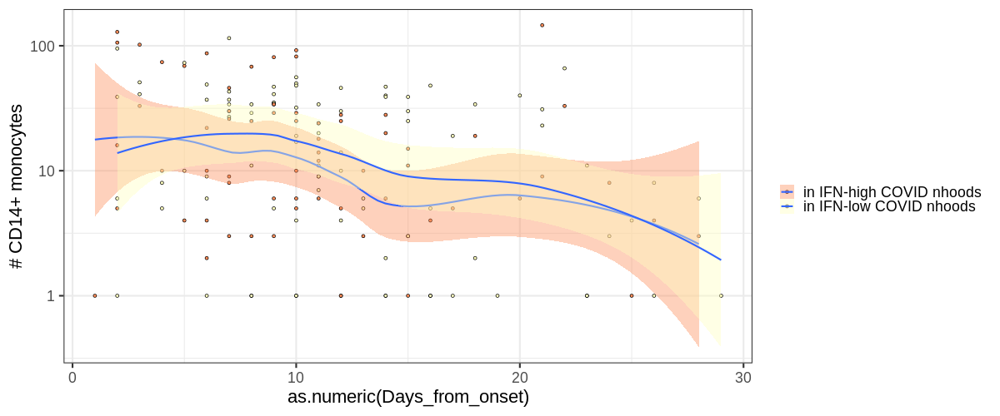

In [134]:
%%R -i order_severity -i n_cells_sev -w 1200 -h 500
n_cells_sev %>%
    filter(nhood_groups != 'in_nhoods_other_CD14_monos') %>%
    filter(Status_on_day_collection_summary %in% order_severity) %>%
    mutate(severity = factor(Status_on_day_collection_summary, levels=order_severity)) %>%
#     filter(Days_from_onset != 'Not_known') %>%
    ggplot(aes(as.numeric(Days_from_onset), n_cells, fill = nhood_groups)) +
#     geom_boxplot(outlier.alpha=0) +
    geom_point(shape=21) +
#     facet_wrap(nhood_groups~.) +
    scale_y_log10() +
    geom_smooth() +
    scale_color_brewer(palette='Spectral', 
                      labels=c('in_nhoods_high_ifn_enr' = 'in IFN-high COVID nhoods', 'in_nhoods_low_ifn_enr' = 'in IFN-low COVID nhoods'),
                      name=''
                     ) +
    scale_fill_brewer(palette='Spectral', 
                      labels=c('in_nhoods_high_ifn_enr' = 'in IFN-high COVID nhoods', 'in_nhoods_low_ifn_enr' = 'in IFN-low COVID nhoods'),
                      name=''
                     ) +
    ylab('# CD14+ monocytes') +
    theme_bw(base_size=22)

### Compare to CR design

In [146]:
milo_res_c = adata_c.uns['nhood_adata'].obs.copy()

In [149]:
mono_res_c = milo_res_c[milo_res_c.nhood_annotation.isin(['CD14_mono', 'CD16_mono'])]

In [150]:
%%R -i mono_res_c
head(mono_res_c)

AttributeError: 'float' object has no attribute 'encode'

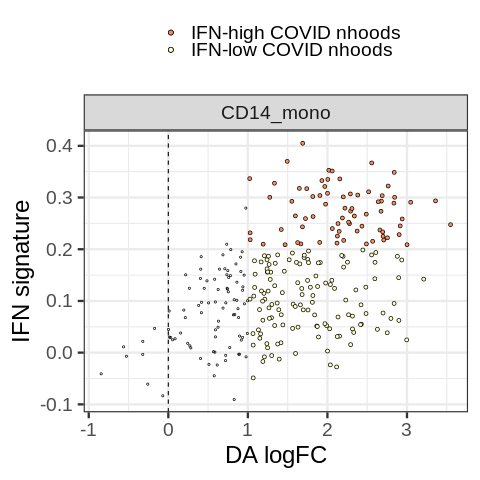

In [151]:
%%R
mono_res_c %>%
    filter(nhood_annotation == 'CD14_mono') %>%
    ggplot(aes(logFC, nhood_IFN_signature)) +
    geom_point(size=0.7, shape=21) +
    geom_point(data=. %>% filter(SpatialFDR < 0.1 & logFC > 1 & nhood_IFN_signature > 0.2), 
               shape=21,
               aes(fill='IFN-high COVID nhoods')) +
    geom_point(data=. %>% filter(SpatialFDR < 0.1 & logFC > 1 & nhood_IFN_signature < 0.2), 
               shape=21,
               aes(fill='IFN-low COVID nhoods')) +
    facet_wrap(nhood_annotation~.) +
    guides(fill=guide_legend(title='', override.aes = list(size=2), ncol=1)) +
    theme_bw(base_size=24) +
    scale_fill_brewer(palette='Spectral', name='') +
    geom_vline(xintercept=0, linetype=2) +
#     geom_hline(yintercept=0, linetype='dashed', color='red') +
    xlab("DA logFC") + ylab("IFN signature") +
    theme(legend.position='top') +
    ggsave(paste0(figdir, 'groups_CD14_monos_CR.png'), height=7, width=7) +
    ggsave(paste0(figdir, 'groups_CD14_monos_CR.pdf'), height=7, width=7)
    

In [21]:
## Select nhoods of interest
cd14_mono_res = mono_res_c[mono_res_c.nhood_annotation == 'CD14_mono']
low_ifn_monos_nhoods = cd14_mono_res.index[(cd14_mono_res.SpatialFDR < 0.1) & (cd14_mono_res.logFC > 0) & (cd14_mono_res.nhood_IFN_signature < 0.2)]
high_ifn_monos_nhoods = cd14_mono_res.index[(cd14_mono_res.SpatialFDR < 0.1) & (cd14_mono_res.logFC > 0) & (cd14_mono_res.nhood_IFN_signature > 0.2)]

In [22]:
other_monos_nhoods = cd14_mono_res.index[~((cd14_mono_res.SpatialFDR < 0.1) & (cd14_mono_res.logFC > 0))]

In [23]:
## Mark nhood groups
nhood_adata = adata_c.uns['nhood_adata'].copy()
nhood_adata.obs['nhood_groups'] = np.nan
nhood_adata.obs.loc[low_ifn_monos_nhoods, 'nhood_groups'] = 'low_ifn_enr'
nhood_adata.obs.loc[high_ifn_monos_nhoods, 'nhood_groups'] = 'high_ifn_enr'
nhood_adata.obs.loc[other_monos_nhoods, 'nhood_groups'] = 'other_CD14_monos'
adata_c.uns['nhood_adata'] = nhood_adata.copy()

In [32]:
adata_c.layers['counts'] = adata_c.X.copy()

In [58]:
sc.pp.normalize_per_cell(adata_c)
sc.pp.log1p(adata_c)

In [33]:
## Run DE testing
DE_monos_ifn = find_nhood_group_markers(
    adata_c[adata_c.obs['author_cell_type'] == 'CD14_mono' ], 
    test_group='low_ifn_enr', 
    ctrl_group='high_ifn_enr', 
    confounders_obs=['Site'],
    n_hvgs = 7500
    )


/nfs/team205/ed6/bin/diff2atlas/diff2atlas/utils.py:19: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs['in_nhoods'] = in_nhoods
/tmp/ipykernel_21347/4003174621.py:110: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


RRuntimeError: Error in `[.data.frame`(pbulk_sdata_var[hvgs, ], "gene_name") : 
  undefined columns selected


In [ ]:
%%R -i DE_monos_ifn -w 800 -h 600 -i figdir
max_lfc = 15
DE_monos_ifn$lfc <- ifelse(abs(DE_monos_ifn$lfc) > max_lfc, sign(DE_monos_ifn$lfc) * Inf, DE_monos_ifn$lfc)
DE_monos_ifn %>%
#     filter(contrast == 'mild_enr-other') %>%
    mutate(signif = adj_pval < 0.01) %>%
    mutate(label = ifelse(signif & (abs(lfc) > 0.75), as.character(gene_name), NA)) %>%
    ggplot(aes(lfc, -log10(adj_pval))) + 
    geom_point(size=0.5) +
    geom_point(data=. %>% filter(signif), color='red') +
    ggrepel::geom_text_repel(aes(label=label), color='red') +
    theme_bw(base_size=18) +
    xlab("DE log-Fold Change") +
    ylab('-log10(Adj. P-value)') +
    ggsave(paste0(figdir, 'volcano_CD14_monos_CR.png'), height=7, width=7) +
    ggsave(paste0(figdir, 'volcano_CD14_monos_CR.pdf'), height=7, width=7) 

In [37]:
assign_cells_2_nhood_group(adata_c)

/tmp/ipykernel_21347/2242147816.py:22: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  adata.obs.loc[~(adata.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan


In [38]:
groups = adata_c.uns['nhood_adata'].obs['nhood_groups'].dropna().unique()
min_n_nhoods = 3
adata_c.obs['nhood_groups'] = np.nan
adata_c.obs['nhood_groups'] = adata_c.obs[[f'in_nhoods_{g}' for g in groups]].idxmax(1)
## Keep only if cell is in at least min_n_nhoods nhoods of the same group
adata_c.obs.loc[~(adata_c.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan 


/tmp/ipykernel_21347/2976013588.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.any and Series.any will be keyword-only.
  adata_c.obs.loc[~(adata_c.obs[[f'in_nhoods_{g}' for g in groups]] > min_n_nhoods).any(1), 'nhood_groups'] = np.nan


In [170]:
adata_c.obs['nhood_groups']

10_1038_s41591_021_01329_2-BGCV01_GACCTGGGTAAGCACG-1       NaN
10_1038_s41591_021_01329_2-BGCV01_CAGCAGCAGCGTCTAT-1       NaN
10_1038_s41591_021_01329_2-BGCV01_CACTCCAGTCCGTCAG-1       NaN
10_1038_s41591_021_01329_2-BGCV01_CGGCTAGCATACTCTT-1       NaN
10_1038_s41591_021_01329_2-BGCV01_GGGCACTAGCTCCTTC-1       NaN
                                                          ... 
10_1038_s41591_021_01329_2-ATGTGTGCACCAGATT-newcastle59    NaN
10_1038_s41591_021_01329_2-TGAGCATAGGCAGGTT-newcastle59    NaN
10_1038_s41591_021_01329_2-TCGCGAGAGCTAGCCC-newcastle59    NaN
10_1038_s41591_021_01329_2-TATGCCCTCACCTCGT-newcastle59    NaN
10_1038_s41591_021_01329_2-GCACATAGTCAATGTC-newcastle59    NaN
Name: nhood_groups, Length: 62509, dtype: category
Categories (3, object): ['in_nhoods_high_ifn_enr', 'in_nhoods_low_ifn_enr', 'in_nhoods_other_CD14_monos']

In [179]:
n_cells_sev = adata_c.obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id']].dropna()
n_cells_sev['n_cells'] = 1
n_cells_sev = n_cells_sev.groupby(['nhood_groups', 'Status_on_day_collection_summary', 'donor_id']).sum().reset_index()

,nhood_groups,Status_on_day_collection_summary,donor_id,n_cells
0,in_nhoods_high_ifn_enr,Asymptomatic,AP1,0
1,in_nhoods_high_ifn_enr,Asymptomatic,AP2,0
2,in_nhoods_high_ifn_enr,Asymptomatic,AP3,0
3,in_nhoods_high_ifn_enr,Asymptomatic,AP4,0
4,in_nhoods_high_ifn_enr,Asymptomatic,AP5,0
...,...,...,...,...
2851,in_nhoods_other_CD14_monos,Severe,newcastle21v2,0
2852,in_nhoods_other_CD14_monos,Severe,newcastle49,9
2853,in_nhoods_other_CD14_monos,Severe,newcastle59,0
2854,in_nhoods_other_CD14_monos,Severe,newcastle65,0


In [180]:
plt.rcParams['figure.figsize'] = [10, 10]
# n_cells_sev = adata_c.obs[['nhood_groups', 'Status_on_day_collection_summary', 'Days_from_onset', 'donor_id']].dropna().value_counts().reset_index()
# n_cells_sev['n_cells'] = n_cells_sev[0]

# n_cells_sev
n_cells_sev = adata_c.obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id']].dropna()
n_cells_sev['n_cells'] = 1
n_cells_sev = n_cells_sev.groupby(['nhood_groups', 'Status_on_day_collection_summary', 'donor_id']).sum().reset_index()
order_severity = ['Healthy', 'Asymptomatic', 'Mild', "Moderate", "Severe", "Critical"]
# sns.boxplot(data=n_cells_sev, x='Status_on_day_collection_summary', y='n_cells', hue='nhood_groups', order=order_severity)
# sns.stripplot(data=n_cells_sev, x='Status_on_day_collection_summary', y='n_cells', hue='nhood_groups', 
#               color='black', position='dodge',
#               order=order_severity)
# n_cells_sev = n_cells_sev[~n_cells_sev.Days_from_onset.isin(['Healthy', 'LPS', 'Not_known', 'nan'])]


,nhood_groups,Status_on_day_collection_summary,donor_id,n_cells
0,in_nhoods_high_ifn_enr,Asymptomatic,AP1,0
1,in_nhoods_high_ifn_enr,Asymptomatic,AP2,0
2,in_nhoods_high_ifn_enr,Asymptomatic,AP3,0
3,in_nhoods_high_ifn_enr,Asymptomatic,AP4,0
4,in_nhoods_high_ifn_enr,Asymptomatic,AP5,0
...,...,...,...,...
2018,in_nhoods_other_CD14_monos,Asymptomatic,newcastle21v2,0
2019,in_nhoods_other_CD14_monos,Asymptomatic,newcastle49,0
2020,in_nhoods_other_CD14_monos,Asymptomatic,newcastle59,0
2021,in_nhoods_other_CD14_monos,Asymptomatic,newcastle65,0


/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


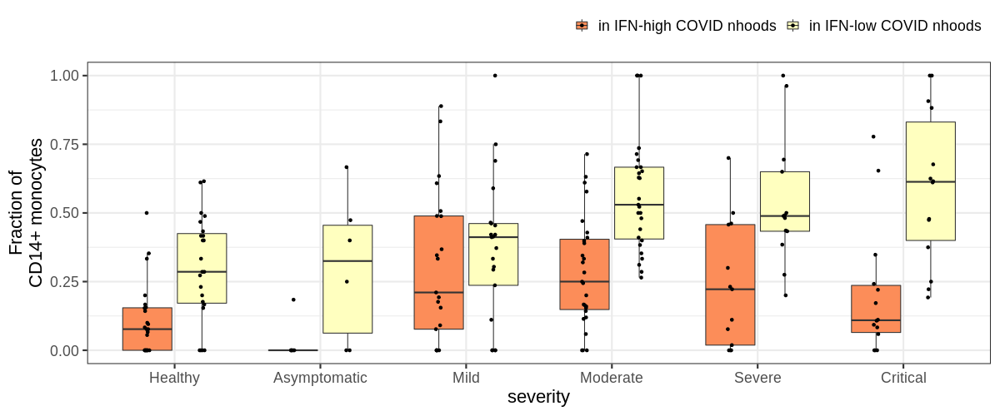

In [182]:
%%R -i order_severity -i n_cells_sev -w 1200 -h 500 -i figdir
n_cells_sev %>%
    filter(Status_on_day_collection_summary %in% order_severity) %>%
    mutate(severity = factor(Status_on_day_collection_summary, levels=order_severity)) %>%
    group_by(donor_id, severity) %>%
    mutate(frac_cells = n_cells/sum(n_cells)) %>%
    ungroup() %>%
#     filter(severity == 'Asymptomatic') %>%
#     select(nhood_groups, frac_cells, donor_id)
    filter(nhood_groups != 'in_nhoods_other_CD14_monos') %>%
    ggplot(aes(severity, frac_cells, fill = nhood_groups)) +
    geom_boxplot(outlier.alpha=0) +
    geom_point(position=position_jitterdodge(jitter.width=0.1)) +
#     facet_wrap(nhood_groups~.) +
#     scale_y_log10() +
    scale_fill_brewer(palette='Spectral', 
                      labels=c('in_nhoods_high_ifn_enr' = 'in IFN-high COVID nhoods', 'in_nhoods_low_ifn_enr' = 'in IFN-low COVID nhoods'),
                      name=''
                     ) +
    ylab('Fraction of\nCD14+ monocytes') +
    theme_bw(base_size=22) +
    theme(legend.position='top', legend.justification=c(1,1)) +
    ggsave(paste0(figdir, 'CD14_monos_severity_CR.png'), height=7, width=10) +
    ggsave(paste0(figdir, 'CD14_monos_severity_CR.pdf'), height=7, width=10) 

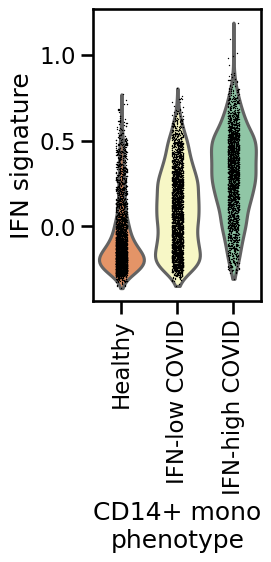

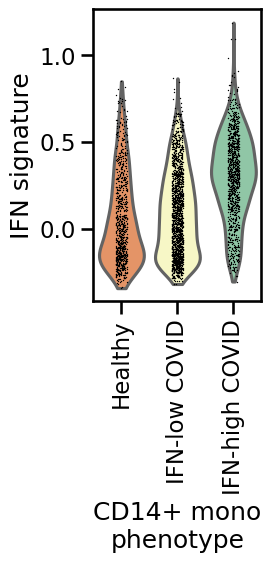

In [152]:
mono_phenotype = {
    'in_nhoods_low_ifn_enr':'IFN-low COVID',
    'in_nhoods_high_ifn_enr':'IFN-high COVID',
    'in_nhoods_other_CD14_monos':'Healthy',
    }

with rc_context({'figure.figsize':[3,4]}):
    adata.obs['mono_phenotype'] = [mono_phenotype[x] if x in mono_phenotype.keys() else np.nan for x in adata.obs['nhood_groups']]
    adata.obs['mono_phenotype'] = adata.obs['mono_phenotype'].astype('category').cat.reorder_categories(['Healthy','IFN-low COVID', 'IFN-high COVID'])
    sc.pl.violin(adata, 'IFN_signature', groupby='mono_phenotype', palette='Spectral', rotation=90, 
                 xlabel='CD14+ mono\nphenotype', ylabel='IFN signature', save='mono_phenotypes_ACR.png');
    
with rc_context({'figure.figsize':[3,4]}):
    adata_c.obs['mono_phenotype'] = [mono_phenotype[x] if x in mono_phenotype.keys() else np.nan for x in adata_c.obs['nhood_groups']]
    adata_c.obs['mono_phenotype'] = adata_c.obs['mono_phenotype'].astype('category').cat.reorder_categories(['Healthy','IFN-low COVID', 'IFN-high COVID'])
    sc.pl.violin(adata_c, 'IFN_signature', groupby='mono_phenotype', palette='Spectral', rotation=90, 
                 xlabel='CD14+ mono\nphenotype', ylabel='IFN signature', save='mono_phenotypes_CR.png');
# sc.pl.violin(adata, 'IFN_signature',groupby='nhood_groups')
# sc.pl.violin(adata_c, 'IFN_signature',groupby='nhood_groups')

In [65]:
adata.obs['S100A8_expression'] = adata[:,'S100A8'].X.toarray().flatten()
adata_c.obs['S100A8_expression'] = adata_c[:,'ENSG00000143546'].X.toarray().flatten()

In [119]:
# n_cells_sev = adata_c.obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']].dropna().value_counts().reset_index()
# n_cells_sev['n_cells'] = n_cells_sev[0]
mean_S100A8 = adata_c[~adata_c.obs['nhood_groups'].isna()].\
    obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']].\
    groupby(['Status_on_day_collection_summary', 'nhood_groups']).mean().reset_index()
frac_S100A8 = adata_c[~adata_c.obs['nhood_groups'].isna()].\
    obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']]
frac_S100A8.loc[frac_S100A8['S100A8_expression'] > 0, 'S100A8_expression'] = 1
frac_S100A8 = frac_S100A8.\
    groupby(['Status_on_day_collection_summary', 'nhood_groups']).sum().reset_index()
size_S100A8 = adata_c[~adata_c.obs['nhood_groups'].isna()].\
    obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']].\
    groupby(['Status_on_day_collection_summary', 'nhood_groups']).size().reset_index()

mean_S100A8['S100A8_frac'] = frac_S100A8['S100A8_expression']/size_S100A8[0]
mean_S100A8['S100A8_ncells'] = size_S100A8[0]
mean_S100A8 = mean_S100A8[mean_S100A8['Status_on_day_collection_summary'].isin(order_severity)]
mean_S100A8['design'] = 'CR'
mean_S100A8_CR = mean_S100A8.copy()

/tmp/ipykernel_21347/510077300.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  groupby(['Status_on_day_collection_summary', 'nhood_groups']).mean().reset_index()
/tmp/ipykernel_21347/510077300.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  groupby(['Status_on_day_collection_summary', 'nhood_groups']).sum().reset_index()


In [120]:
# n_cells_sev = adata_c.obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']].dropna().value_counts().reset_index()
# n_cells_sev['n_cells'] = n_cells_sev[0]
mean_S100A8 = adata[~adata.obs['nhood_groups'].isna()].\
    obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']].\
    groupby(['Status_on_day_collection_summary', 'nhood_groups']).mean().reset_index()
frac_S100A8 = adata[~adata.obs['nhood_groups'].isna()].\
    obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']]
frac_S100A8.loc[frac_S100A8['S100A8_expression'] > 0, 'S100A8_expression'] = 1
frac_S100A8 = frac_S100A8.\
    groupby(['Status_on_day_collection_summary', 'nhood_groups']).sum().reset_index()
size_S100A8 = adata[~adata.obs['nhood_groups'].isna()].\
    obs[['nhood_groups', 'Status_on_day_collection_summary', 'donor_id', 'S100A8_expression']].\
    groupby(['Status_on_day_collection_summary', 'nhood_groups']).size().reset_index()

mean_S100A8['S100A8_frac'] = frac_S100A8['S100A8_expression']/size_S100A8[0]
mean_S100A8['S100A8_ncells'] = size_S100A8[0]
mean_S100A8 = mean_S100A8[mean_S100A8['Status_on_day_collection_summary'].isin(order_severity)]
mean_S100A8['design'] = 'ACR'

/tmp/ipykernel_21347/4202641141.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  groupby(['Status_on_day_collection_summary', 'nhood_groups']).mean().reset_index()
/tmp/ipykernel_21347/4202641141.py:10: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  groupby(['Status_on_day_collection_summary', 'nhood_groups']).sum().reset_index()


In [121]:
mean_S100A8_df = pd.concat([mean_S100A8, mean_S100A8_CR])

In [122]:
%%R -i mean_S100A8_df
head(mean_S100A8_df)

  Status_on_day_collection_summary               nhood_groups S100A8_expression
1                     Asymptomatic     in_nhoods_high_ifn_enr          3.815430
2                     Asymptomatic      in_nhoods_low_ifn_enr          4.700357
3                     Asymptomatic in_nhoods_other_CD14_monos          3.925021
4                         Critical     in_nhoods_high_ifn_enr          3.993044
5                         Critical      in_nhoods_low_ifn_enr          4.982008
6                         Critical in_nhoods_other_CD14_monos          4.262602
  S100A8_frac S100A8_ncells design
1   1.0000000           160    ACR
2   1.0000000            80    ACR
3   0.9949495           198    ACR
4   0.9947917           192    ACR
5   0.9974093           386    ACR
6   1.0000000           393    ACR


/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


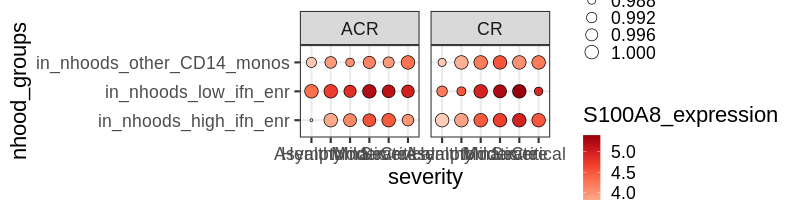

In [124]:
%%R -w 800 -h 200
mean_S100A8_df %>%
    mutate(severity = factor(Status_on_day_collection_summary, levels=order_severity)) %>%
    ggplot(aes(severity, nhood_groups)) +
    geom_point(aes(size=S100A8_frac, fill=S100A8_expression), shape=21) +
    facet_wrap(design~.) +
    scale_fill_distiller(palette='Reds', direction=1) +
    theme_bw(base_size=22)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


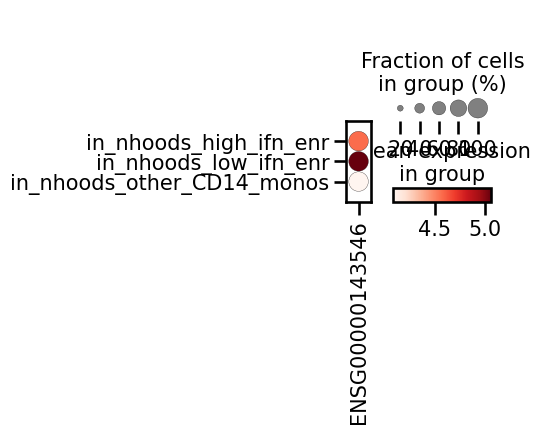

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


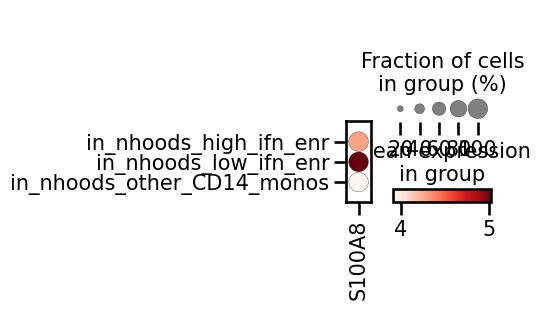

In [61]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.dotplot(adata_c, 'ENSG00000143546', groupby='nhood_groups' );
sc.pl.dotplot(adata, 'S100A8', groupby='nhood_groups' )

## Compare designs on cluster-based DA analysis

In [100]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

In [230]:
split_seed = 42
n_iters = 3
def label_transfer_classify(adata, n_iters = 10, split_seed=42):
    X = adata.obsm['X_scVI'].copy()
    y = adata.obs['author_cell_type'].copy()
    out_all_df = pd.DataFrame()
    for s in np.arange(split_seed, split_seed+n_iters):
        X_train, X_test, y_train, y_test = train_test_split(
                    X, y, test_size=0.2, random_state=s)

        clf = KNeighborsClassifier(
            n_neighbors=30,
            metric="euclidean"
            ).fit(X_train, y_train)
        class_out = classification_report(y_test, clf.predict(X_test), output_dict=True)
        out_df = pd.DataFrame.from_dict(class_out).T.reset_index()
        out_df['split_seed'] = s
        out_all_df = pd.concat([out_all_df, out_df])
    return(out_all_df)

In [231]:
clf_acr = label_transfer_classify(adata)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

In [232]:
clf_cr = label_transfer_classify(adata_c)

/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1334: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier

In [233]:
clf_cr['design'] = 'CR'
clf_acr['design'] = 'ACR'
clf_results = pd.concat([clf_cr, clf_acr])

In [241]:
ct_counts = adata.obs['author_cell_type'].value_counts()
keep_cts = ct_counts[ct_counts > 100].index.astype('str')
keep_cts

Index(['NK_16hi', 'CD4.CM', 'CD4.Naive', 'B_naive', 'CD83_CD14_mono', 'CD8.TE',
       'CD8.Naive', 'CD14_mono', 'CD4.IL22', 'CD4.Tfh', 'CD8.EM', 'Platelets',
       'gdT', 'CD16_mono', 'MAIT', 'NK_56hi', 'B_switched_memory',
       'B_immature', 'RBC', 'B_malignant', 'B_non-switched_memory', 'NKT',
       'pDC', 'DC3', 'Plasma_cell_IgG', 'NK_prolif', 'B_exhausted',
       'Plasmablast', 'CD4.EM', 'Plasma_cell_IgA', 'DC2', 'C1_CD16_mono',
       'HSC_CD38pos', 'CD8.Prolif', 'Plasma_cell_IgM'],
      dtype='object')

In [242]:
mean_p_acr = clf_acr[['index','f1-score']].groupby('index').median()
mean_p_acr.columns = ['precision_ACR']
mean_p_cr = clf_cr[['index','f1-score']].groupby('index').median()
mean_p_cr.columns = ['precision_CR']
p_mean = pd.concat([mean_p_cr, mean_p_acr],1 )
p_delta = p_mean['precision_ACR'] - p_mean['precision_CR']
sorted_ixs = p_delta.sort_values().index

/tmp/ipykernel_4395/1023192447.py:5: FutureWarning: In a future version of pandas all arguments of concat except for the argument 'objs' will be keyword-only.
  p_mean = pd.concat([mean_p_cr, mean_p_acr],1 )


In [243]:
clf_results['anno_group'] = [anno_labels_dict[x] if x in anno_labels_dict.keys() else np.nan for x in clf_results['index']]

In [244]:
%%R -i clf_results -i keep_cts -i sorted_ixs
head(clf_results)

                  index precision    recall  f1-score support split_seed design
1                  ASDC 0.0000000 0.0000000 0.0000000       3         42     CR
2           B_exhausted 0.6666667 0.5625000 0.6101695      64         42     CR
3            B_immature 0.7454545 0.3445378 0.4712644     119         42     CR
4           B_malignant 0.7000000 0.7241379 0.7118644      87         42     CR
5               B_naive 0.7961783 0.9319664 0.8587377    1073         42     CR
6 B_non-switched_memory 0.4285714 0.1785714 0.2521008      84         42     CR
  anno_group
1       ASDC
2     B_cell
3     B_cell
4     B_cell
5     B_cell
6     B_cell


/home/jovyan/my-conda-envs/oor-benchmark/lib/python3.10/site-packages/rpy2/robjects/pandas2ri.py:56: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for name, values in obj.iteritems():


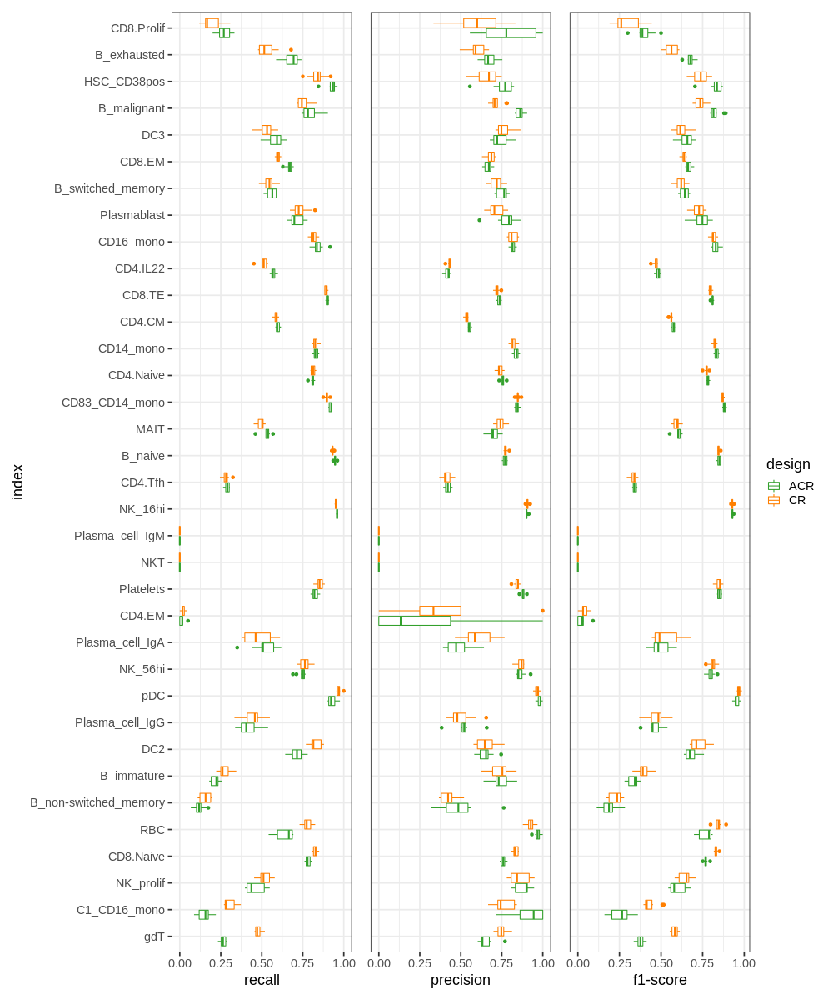

In [245]:
%%R -h 1200 -w 1000
pl_df <- clf_results %>%
    filter(index %in% unlist(keep_cts)) %>%
    group_by(index) %>%
    mutate(median_score = median(`precision`)) %>%
    ungroup() %>%
    filter(!index %in% c('accuracy', 'weighted avg', 'macro avg')) %>%
    arrange(median_score) %>%
    mutate(index = factor(index, levels=unlist(sorted_ixs))) %>%
    mutate(anno_group = ifelse(str_detect(anno_group, "NK"), "NK", anno_group)) %>%
    mutate(anno_group = ifelse( str_detect(anno_group, "ILC"), "ILC", anno_group)) %>%
    mutate(anno_group = ifelse(str_detect(anno_group, "DC"), "DC", anno_group)) %>%
    mutate(anno_group = ifelse(str_detect(anno_group, "mono"), "Monos", anno_group))
    
r_plot <- pl_df %>%
    ggplot(aes(index, `precision`, color=design)) +
    geom_boxplot() +
    coord_flip() +
    theme_bw(base_size=18) +
#     facet_grid(anno_group~., space='free', scales='free') +
    scale_color_manual(values=design_palette)
p_plot <- pl_df %>%
    ggplot(aes(index, `recall`, color=design)) +
    geom_boxplot() +
    coord_flip() +
#     facet_grid(anno_group~., space='free', scales='free') +
    theme_bw(base_size=18) +
    scale_color_manual(values=design_palette)
f_plot <- pl_df %>%
    ggplot(aes(index, `f1-score`, color=design)) +
    geom_boxplot() +
    coord_flip() +
    theme_bw(base_size=18) +
#     facet_grid(anno_group~., space='free', scales='free') +
    scale_color_manual(values=design_palette)
    
p_plot + (r_plot + remove_y_axis()) + (f_plot + remove_y_axis())+
plot_layout(guides='collect') 

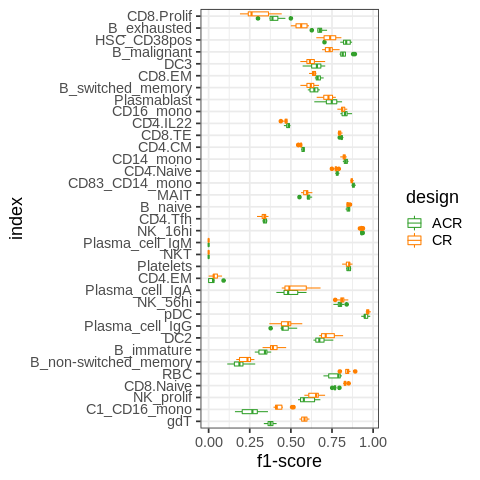

In [292]:
%%R
f_plot + 
    ggsave(paste0(figdir, 'KNN_classifier_labels_F1score.png'), height=7, width=10) +
    ggsave(paste0(figdir, 'KNN_classifier_labels_F1score.pdf'), height=7, width=10) 

`summarise()` has grouped output by 'design'. You can override using the `.groups` argument.


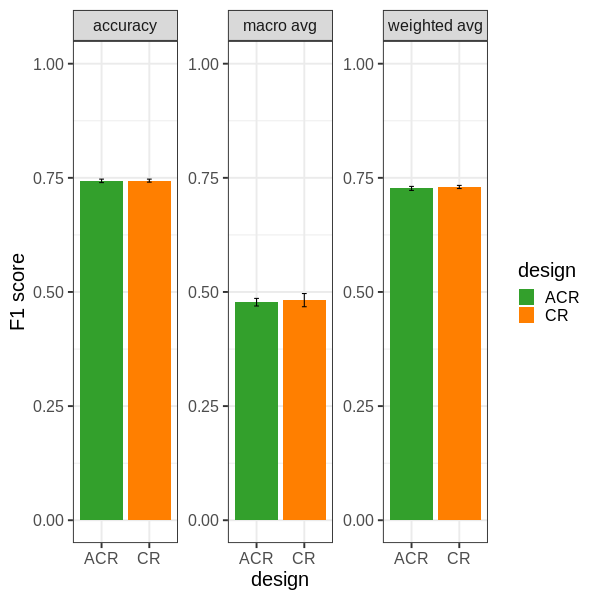

In [291]:
%%R -h 600 -w 600
clf_results %>%
    filter(index %in% c('accuracy', 'weighted avg', 'macro avg')) %>%
    group_by(design, index) %>%
    summarise(mean_score=mean(`f1-score`), sd_score=sd(`f1-score`)) %>%
    ggplot(aes(design, mean_score, fill=design)) +
    geom_col(position='dodge') +
    geom_errorbar(aes(ymin=mean_score - sd_score, ymax=mean_score + sd_score), position='dodge', width=0.1) +
    facet_wrap(index~., scales='free') +
    scale_fill_manual(values=design_palette) +
    ylim(0,1) +
    ylab("F1 score") +
    theme_bw(base_size=20) +
        ggsave(paste0(figdir, 'KNN_classifier_labels_mean.png'), height=7, width=10) +
    ggsave(paste0(figdir, 'KNN_classifier_labels_mean.pdf'), height=7, width=10) 


In [97]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report

def label_transfer_classify(adata, n_iters = 5, split_seed=42):
    '''Train classifier on latent space to identify OOR cell state in disease cells'''
    X = adata[adata.obs['dataset_group'] == 'query'].obsm['X_scVI'].copy()
    y = adata[adata.obs['dataset_group'] == 'query'].obs['OOR_state']
    class_out = {'precision':[], 'recall':[], 'f1-score':[], 'accuracy':[], 'support':[]}
    for s in np.arange(split_seed, split_seed+n_iters):
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.33, random_state=s)

#         clf = LogisticRegression(random_state=0).fit(X_train, y_train)
        clf = KNeighborsClassifier(n_neighbors=50, metric="euclidean").fit(X_train, y_train)
        class_out_iter = classification_report(y_test, clf.predict(X_test), output_dict=True)['1']
        class_out_iter['accuracy'] = classification_report(y_test, clf.predict(X_test), output_dict=True)['accuracy']
        for k in class_out.keys():
            class_out[k].append(class_out_iter[k])
    return(pd.DataFrame(class_out))

In [ ]:
adata_c.

In [28]:
## Rename clusters by majority voting 
def label_leiden(adata, anno_col='author_cell_type_broad'):
    cmat = sc.metrics.confusion_matrix('leiden', anno_col, adata.obs)
    majority_df = pd.concat([cmat.idxmax(1), cmat.max(1)], 1)
    majority_df.columns=['label','fraction']
    adata.obs['leiden_label'] = [x + "_" + majority_df.loc[x, 'label'] for x in adata.obs['leiden']]
    adata.obs['leiden_label_frac'] = [majority_df.loc[x, 'fraction'] for x in adata.obs['leiden']]

## Leiden clustering 
sc.tl.leiden(adata, resolution=2.0)
sc.tl.leiden(adata_c, resolution=2.0)

label_leiden(adata)
label_leiden(adata_c)

... storing 'author_cell_type_broad' as categorical
... storing 'leiden_label' as categorical


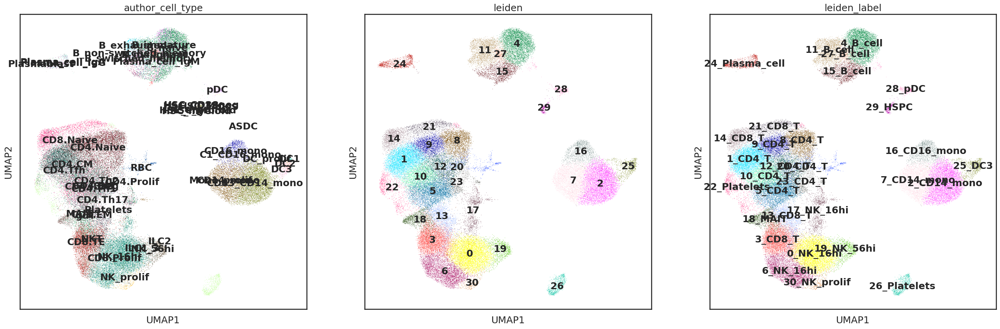

... storing 'author_cell_type_broad' as categorical
... storing 'leiden_label' as categorical


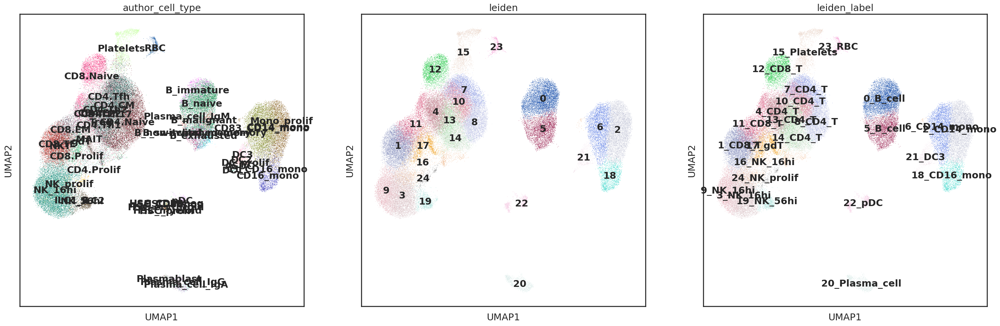

In [100]:
with rc_context({'figure.figsize':[10,10]}):
    sc.pl.umap(adata, color=['author_cell_type', 'leiden','leiden_label'], legend_loc='on data')
    sc.pl.umap(adata_c, color=['author_cell_type', 'leiden','leiden_label'], legend_loc='on data')

In [223]:
(adata.obs[['author_cell_type_broad', 'author_cell_type']]
        .drop_duplicates()
        .sort_values('author_cell_type_broad')
        ['author_cell_type'].astype('str')
        )

10_1038_s41591_021_01329_2-BGCV04_GGACGTCAGGCTAGCA-1                      ASDC
10_1038_s41591_021_01329_2-BGCV10_TCACAAGTCACTCTTA-1               B_malignant
10_1038_s41591_021_01329_2-S11_GATCTAGTCACTATTC-1                      B_naive
10_1038_s41591_021_01329_2-S11_ATCATCTAGCCAGGAT-1                   B_immature
10_1038_s41591_021_01329_2-S11_CAGCAGCTCAATCTCT-1        B_non-switched_memory
10_1038_s41591_021_01329_2-S12_AGCGGTCGTGCACGAA-1            B_switched_memory
10_1038_s41591_021_01329_2-S12_TCACGAAAGCTAGTTC-1                  B_exhausted
10_1038_s41591_021_01329_2-S11_GAGTCCGGTTCAGGCC-1                      CD4.Tfh
10_1038_s41591_021_01329_2-BGCV05_ATCGAGTCAGTCAGCC-1                  CD4.Th17
10_1038_s41591_021_01329_2-S24_CCATTCGGTCGATTGT-1                      CD4.Th2
10_1038_s41591_021_01329_2-S11_GCAATCACACCAACCG-1                     CD4.IL22
10_1038_s41591_021_01329_2-S12_TTCGGTCAGGAATGGA-1                       CD4.EM
10_1038_s41591_021_01329_2-S12_ATTGGTGCAATCTACG-1   

In [248]:
def plot_confusion(adata):
    row_order = (adata.obs[['author_cell_type_broad', 'author_cell_type']]
        .drop_duplicates()
        .sort_values('author_cell_type_broad')
        ['author_cell_type'].astype('str')
        )
        
    cmat = sc.metrics.confusion_matrix('author_cell_type', 'leiden',  adata.obs)
    # cmat.index = cmat.index.astype("category").cat.reorder_categories(row_order )
    # col_order = cmat.idxmax(0).sort_values().index
    sort_mapping = row_order.reset_index()['author_cell_type'].reset_index().set_index('author_cell_type')
    idxmax = pd.DataFrame(cmat.loc[row_order].idxmax(0))
    idxmax['map'] = idxmax[0].map(sort_mapping['index'])
    col_order = idxmax.sort_values('map').index
    sns.heatmap(cmat.loc[row_order, col_order])

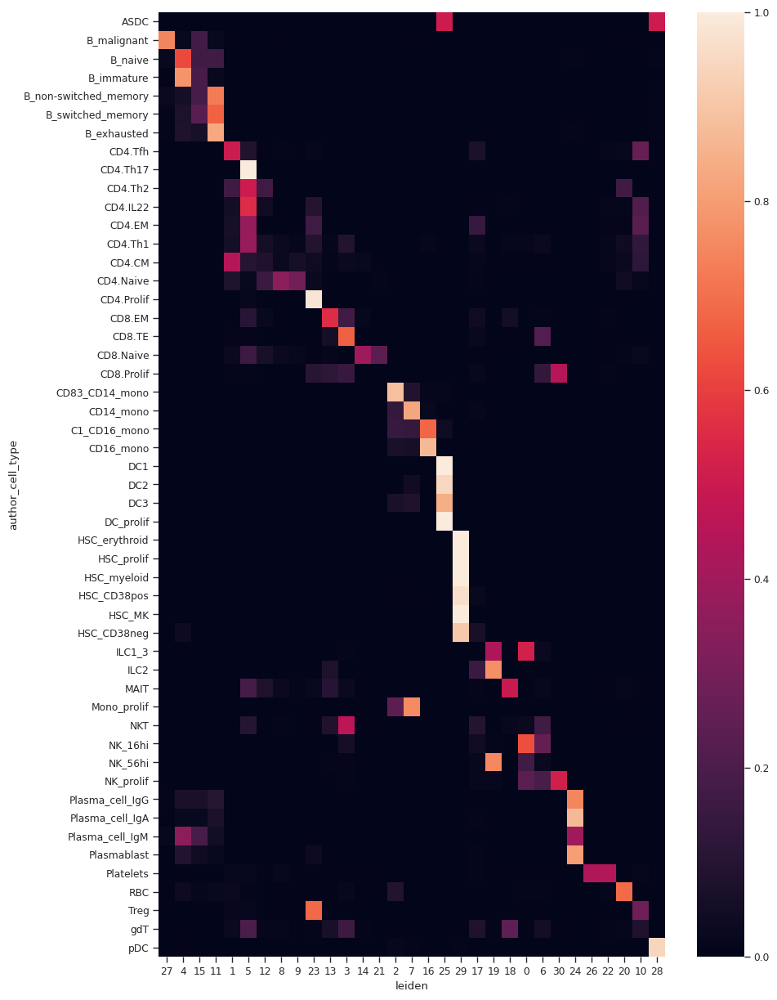

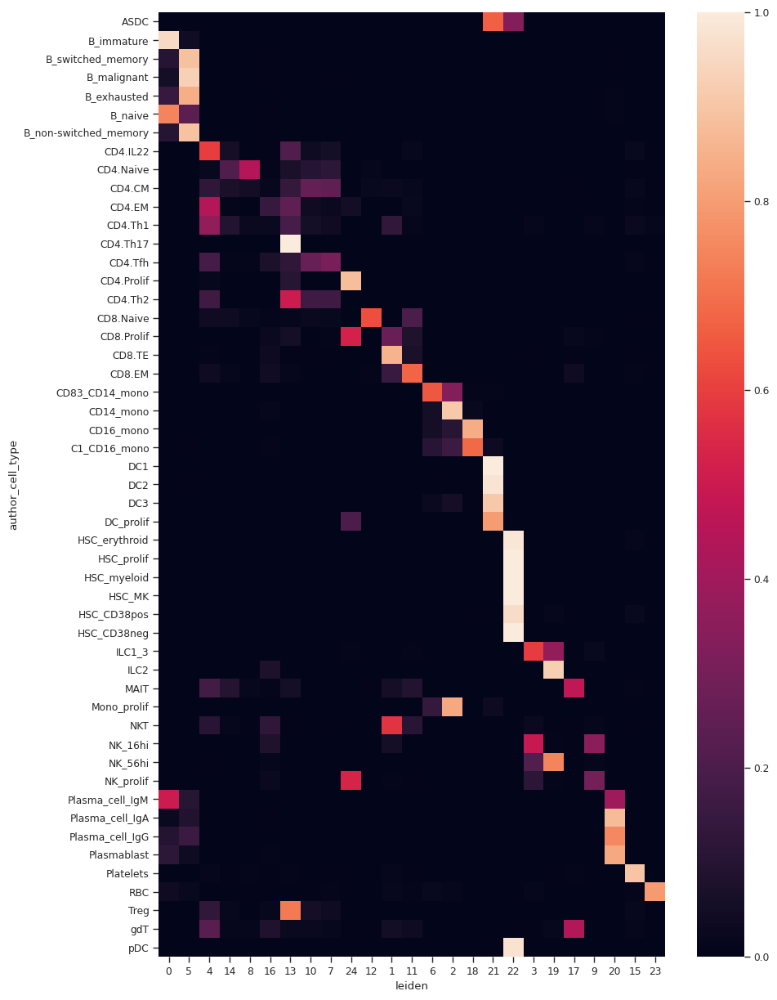

In [ ]:
with rc_context({'figure.figsize': [10,15]}):
    plot_confusion(adata)
    plt.tight_layout()
    plt.savefig(figdir + 'clustering_confusion_PAC.png')
    plt.show()
    plot_confusion(adata_c)
    plt.tight_layout()
    plt.savefig(figdir + 'clustering_confusion_PC.png')

In [259]:
from sklearn.metrics import adjusted_rand_score
nmi_PAC = adjusted_rand_score(adata.obs['author_cell_type'], adata.obs['leiden'])
nmi_PC = adjusted_rand_score(adata_c.obs['author_cell_type'], adata_c.obs['leiden'])

In [260]:
nmi_PAC

0.44920705959765295

In [261]:
nmi_PC

0.44292519025742616

In [102]:
from diff2atlas.diff_analysis_wrappers import run_sccoda
pac_sccoda_res = run_sccoda(adata, condition_col = 'dataset_group', sample_col = 'sample_id', annotation_col = 'leiden_label', ref_cell_type = 'automatic')
# run_sccoda(adata_c, condition_col = 'dataset_group', sample_col = 'donor_id', annotation_col = 'leiden_label', ref_cell_type = '1_CD4_T')


Automatic reference selection! Reference cell type set to 19_NK_56hi
Zero counts encountered in data! Added a pseudocount of 0.5.


100%|██████████| 20000/20000 [04:39<00:00, 71.62it/s]


MCMC sampling finished. (350.142 sec)
Acceptance rate: 57.2%


In [101]:
pc_sccoda_res = run_sccoda(adata_c, condition_col = 'dataset_group', sample_col = 'sample_id', annotation_col = 'leiden_label', ref_cell_type = 'automatic')

Automatic reference selection! Reference cell type set to 19_NK_56hi
Zero counts encountered in data! Added a pseudocount of 0.5.


100%|██████████| 20000/20000 [04:05<00:00, 81.44it/s]
6 out of the last 6 calls to <function CompositionalModel.sampling.<locals>.sample_mcmc at 0x7f4b5946b170> triggered tf.function retracing. Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop, (2) passing tensors with different shapes, (3) passing Python objects instead of tensors. For (1), please define your @tf.function outside of the loop. For (2), @tf.function has reduce_retracing=True option that can avoid unnecessary retracing. For (3), please refer to https://www.tensorflow.org/guide/function#controlling_retracing and https://www.tensorflow.org/api_docs/python/tf/function for  more details.


MCMC sampling finished. (309.931 sec)
Acceptance rate: 54.3%


In [86]:
pac_sccoda_res.summary()

Compositional Analysis summary:

Data: 130 samples, 31 cell types
Reference index: 11
Formula: condition

Intercepts:
                Final Parameter  Expected Sample
Cell Type                                       
0_NK_16hi                 1.002        42.600944
10_CD4_T                  0.068        16.741261
11_B_cell                 0.159        18.336185
12_CD4_T                  0.163        18.409676
13_CD8_T                  0.095        17.199433
14_CD8_T                 -0.206        12.728918
15_B_cell                -0.251        12.168813
16_CD16_mono             -0.500         9.486563
17_NK_16hi               -0.257        12.096019
18_MAIT                  -0.086        14.351815
19_NK_56hi               -0.182        13.038107
1_CD4_T                   0.451        24.554040
20_CD4_T                 -0.490         9.581905
21_CD8_T                 -0.381        10.685380
22_Platelets             -0.689         7.852849
23_CD4_T                 -0.399        10.494763


In [103]:
pc_sccoda_res.set_fdr(0.2)
pac_sccoda_res.set_fdr(0.2)

In [136]:
credible_changes = pc_sccoda_res.credible_effects()['condition[T.P]']
pc_sccoda_res.effect_df.loc[['condition[T.P]']][credible_changes.values]

Final Parameter  HDI 3%  HDI 97%     SD  \
Covariate      Cell Type                                                 
condition[T.P] 2_CD14_mono            0.447591   0.140    0.790  0.194   
               7_CD4_T               -0.302961  -0.565    0.006  0.186   
               10_CD4_T               0.459562   0.136    0.746  0.162   
               17_gdT                -0.447289  -0.766   -0.141  0.177   
               20_Plasma_cell         0.436800   0.077    0.782  0.194   
               21_DC3                -0.193721  -0.527    0.074  0.156   
               24_NK_prolif           0.187051  -0.149    0.533  0.166   

                               Inclusion probability  Expected Sample  \
Covariate      Cell Type                                                
condition[T.P] 2_CD14_mono                  0.947133        25.117126   
               7_CD4_T                      0.795067        17.993275   
               10_CD4_T                     0.998800        25.623783   
               17_gdT                       0.983667        11.736110   
               20_Plasma_cell               0.986733         9.745046   
               21_DC3                       0.526467         8.830730   
               24_NK_prolif                 0.547800         8.158088   

                               log2-fold change  
Covariate      Cell Type                         
condition[T.P] 2_CD14_mono             0.620161  
               7_CD4_T                -0.462657  
               10_CD4_T                0.637431  
               17_gdT                 -0.670877  
               20_Plasma_cell          0.604593  
               21_DC3                 -0.305057  
               24_NK_prolif            0.244281

In [109]:
credible_changes = pac_sccoda_res.credible_effects()['condition[T.P]']
pac_sccoda_res.effect_df.loc[['condition[T.P]']][credible_changes.values]

Final Parameter  HDI 3%  HDI 97%     SD  \
Covariate      Cell Type                                                 
condition[T.P] 1_CD4_T                0.203204  -0.040    0.474  0.152   
               2_CD14_mono            0.210179  -0.026    0.458  0.148   
               6_NK_16hi              0.203864  -0.045    0.456  0.150   
               7_CD14_mono            0.407795   0.087    0.735  0.191   
               18_MAIT               -0.380302  -0.687    0.001  0.212   
               24_Plasma_cell         0.395342   0.040    0.748  0.215   

                               Inclusion probability  Expected Sample  \
Covariate      Cell Type                                                
condition[T.P] 1_CD4_T                      0.706333        26.121014   
               2_CD14_mono                  0.691667        31.680943   
               6_NK_16hi                    0.657133        29.529818   
               7_CD14_mono                  0.945933        14.488145   
               18_MAIT                      0.904800         9.404935   
               24_Plasma_cell               0.914667         9.032945   

                               log2-fold change  
Covariate      Cell Type                         
condition[T.P] 1_CD4_T                 0.233087  
               2_CD14_mono             0.243150  
               6_NK_16hi               0.234040  
               7_CD14_mono             0.528249  
               18_MAIT                -0.608733  
               24_Plasma_cell          0.510284

In [146]:
credible_changes = pac_sccoda_res.credible_effects()['condition[T.P]']
pac_res_df = pac_sccoda_res.effect_df.loc[['condition[T.P]']].reset_index()
pac_res_df['is_credible'] = credible_changes.values

credible_changes = pc_sccoda_res.credible_effects()['condition[T.P]']
pc_res_df = pc_sccoda_res.effect_df.loc[['condition[T.P]']].reset_index()
pc_res_df['is_credible'] = credible_changes.values

In [143]:
## Compute mean IFN signature 
# pac_mean_IFN = adata.obs.groupby('leiden_label').mean()['IFN_signature']
# pc_mean_IFN = adata_c.obs.groupby('leiden_label').mean()['IFN_signature']

pac_mean_IFN = adata.obs.groupby(['dataset_group', 'leiden_label']).mean()['IFN_signature'].reset_index().pivot(
        columns=[ "dataset_group"],
        index=annotation_col,
        values="IFN_signature")

pc_mean_IFN = adata_c.obs.groupby(['dataset_group', 'leiden_label']).mean()['IFN_signature'].reset_index().pivot(
        columns=[ "dataset_group"],
        index=annotation_col,
        values="IFN_signature")

In [147]:
pc_res_df.index = pc_res_df['Cell Type']
pc_res_df = pd.concat([pc_res_df, pc_mean_IFN], 1)
pc_res_df['design'] = 'PC'

pac_res_df.index = pac_res_df['Cell Type']
pac_res_df = pd.concat([pac_res_df, pac_mean_IFN], 1)
pac_res_df['design'] = 'PAC'


,Covariate,Cell Type,Final Parameter,HDI 3%,HDI 97%,SD,Inclusion probability,Expected Sample,log2-fold change,is_credible,P,C,design
0_NK_16hi,condition[T.P],0_NK_16hi,0.000000,-0.282,0.121,0.070,0.358067,41.245256,-0.060074,False,0.065628,-0.103139,PAC
1_CD4_T,condition[T.P],1_CD4_T,0.203204,-0.040,0.474,0.152,0.706333,26.121014,0.233087,True,-0.087831,-0.155002,PAC
2_CD14_mono,condition[T.P],2_CD14_mono,0.210179,-0.026,0.458,0.148,0.691667,31.680943,0.243150,True,0.079215,-0.151165,PAC
3_CD8_T,condition[T.P],3_CD8_T,0.000000,-0.247,0.185,0.075,0.412467,27.181487,-0.060074,False,0.041072,-0.126990,PAC
4_B_cell,condition[T.P],4_B_cell,0.000000,-0.191,0.269,0.081,0.389067,27.675184,-0.060074,False,-0.032009,-0.136804,PAC
5_CD4_T,condition[T.P],5_CD4_T,0.000000,-0.277,0.159,0.071,0.335467,27.290430,-0.060074,False,-0.036504,-0.139087,PAC
6_NK_16hi,condition[T.P],6_NK_16hi,0.203864,-0.045,0.456,0.150,0.657133,29.529818,0.234040,True,0.143597,-0.094865,PAC
7_CD14_mono,condition[T.P],7_CD14_mono,0.407795,0.087,0.735,0.191,0.945933,14.488145,0.528249,True,0.191891,-0.128978,PAC
8_CD4_T,condition[T.P],8_CD4_T,0.000000,-0.275,0.204,0.077,0.357800,18.662872,-0.060074,False,-0.042477,-0.139656,PAC
9_CD4_T,condition[T.P],9_CD4_T,0.000000,-0.262,0.219,0.082,0.410867,18.039001,-0.060074,False,-0.065015,-0.142773,PAC


In [148]:

sccoda_res_df = pd.concat([pac_res_df, pc_res_df])
sccoda_res_df


,Covariate,Cell Type,Final Parameter,HDI 3%,HDI 97%,SD,Inclusion probability,Expected Sample,log2-fold change,is_credible,P,C,design
0_NK_16hi,condition[T.P],0_NK_16hi,0.000000,-0.282,0.121,0.070,0.358067,41.245256,-0.060074,False,0.065628,-0.103139,PAC
1_CD4_T,condition[T.P],1_CD4_T,0.203204,-0.040,0.474,0.152,0.706333,26.121014,0.233087,True,-0.087831,-0.155002,PAC
2_CD14_mono,condition[T.P],2_CD14_mono,0.210179,-0.026,0.458,0.148,0.691667,31.680943,0.243150,True,0.079215,-0.151165,PAC
3_CD8_T,condition[T.P],3_CD8_T,0.000000,-0.247,0.185,0.075,0.412467,27.181487,-0.060074,False,0.041072,-0.126990,PAC
4_B_cell,condition[T.P],4_B_cell,0.000000,-0.191,0.269,0.081,0.389067,27.675184,-0.060074,False,-0.032009,-0.136804,PAC
5_CD4_T,condition[T.P],5_CD4_T,0.000000,-0.277,0.159,0.071,0.335467,27.290430,-0.060074,False,-0.036504,-0.139087,PAC
6_NK_16hi,condition[T.P],6_NK_16hi,0.203864,-0.045,0.456,0.150,0.657133,29.529818,0.234040,True,0.143597,-0.094865,PAC
7_CD14_mono,condition[T.P],7_CD14_mono,0.407795,0.087,0.735,0.191,0.945933,14.488145,0.528249,True,0.191891,-0.128978,PAC
8_CD4_T,condition[T.P],8_CD4_T,0.000000,-0.275,0.204,0.077,0.357800,18.662872,-0.060074,False,-0.042477,-0.139656,PAC
9_CD4_T,condition[T.P],9_CD4_T,0.000000,-0.262,0.219,0.082,0.410867,18.039001,-0.060074,False,-0.065015,-0.142773,PAC


In [178]:
covid_palette = {'Covid':'#fb9a99', "Healthy":'#1f78b4', 'LPS':'#fdbf6f', 'Non_covid':'#fdbf6f'}
covid_palette_df = pd.DataFrame.from_dict(covid_palette.items())

,0,1
0,Covid,#fb9a99
1,Healthy,#1f78b4
2,LPS,#fdbf6f
3,Non_covid,#fdbf6f


In [179]:
%%R -i sccoda_res_df -i covid_palette_df
head(sccoda_res_df)


NameError: name 'covid_palette_df' is not defined

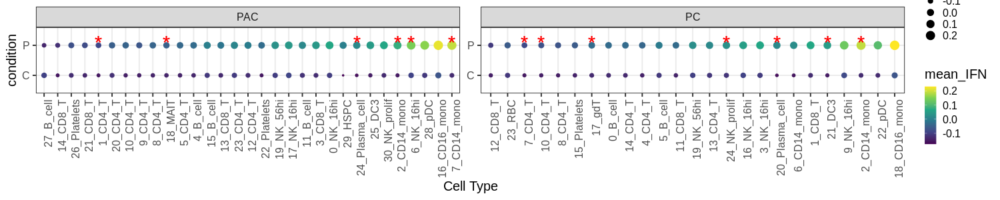

In [167]:
%%R -w 1500 -h 300
sccoda_res_df %>%
## Sort by delta in IFN signature 
arrange(P-C) %>%
mutate(`Cell Type` = factor(`Cell Type`, levels = unique(`Cell Type`))) %>%
pivot_longer(cols = c("P", "C"), names_to = "condition", values_to = "mean_IFN") %>%
ggplot(aes(`Cell Type`, condition,  color = mean_IFN, size=mean_IFN)) +
geom_point() +
geom_text(data=. %>% filter(is_credible==1), y = 2.1, nudge_y=0.6, label='*', size=10, color='red')+
scale_color_viridis_c() + 
facet_wrap(design~., scales='free') +
theme_bw(base_size=20) +
theme(axis.text.x=element_text(angle=90, vjust=1, hjust=1)) 

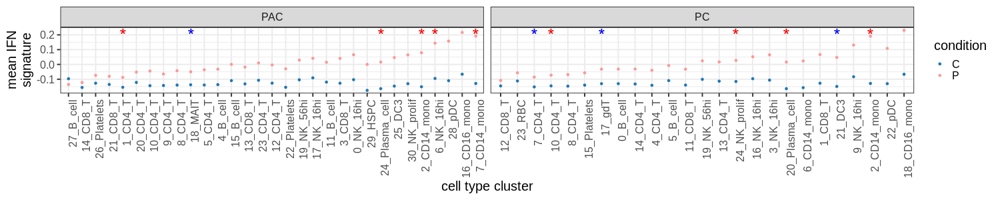

In [182]:
%%R -w 1500 -h 300 
sccoda_res_df %>%
## Sort by delta in IFN signature 
arrange(P-C) %>%
mutate(`Cell Type` = factor(`Cell Type`, levels = unique(`Cell Type`))) %>%
pivot_longer(cols = c("P", "C"), names_to = "condition", values_to = "mean_IFN") %>%
ggplot(aes(`Cell Type`, mean_IFN, color=condition)) +
geom_point(size=1.5) +
geom_text(data=. %>% filter(is_credible==1 & `log2-fold change` > 0), y = 0.21, label='*', size=8, color='red')+
geom_text(data=. %>% filter(is_credible==1 & `log2-fold change` < 0), y = 0.21, label='*', size=8, color='blue')+
# scale_color_viridis_c() + 
scale_color_manual(values=c(P = '#fb9a99', C='#1f78b4')) +
facet_wrap(design~., scales='free_x') +
theme_bw(base_size=20) +
xlab("cell type cluster") + ylab('mean IFN\nsignature') +
theme(axis.text.x=element_text(angle=90, vjust=1, hjust=1)) +



In [125]:
pac_obs_df = adata.obs.copy()
pac_obs_df['design'] = 'PAC'
pc_obs_df = adata_c.obs.copy()
pc_obs_df['design'] = 'PC'
obs_df = pd.concat([pac_obs_df, pc_obs_df])

In [134]:
%%R -i obs_df
head(obs_df)

  n_genes total_counts_mt pct_counts_mt initial_clustering Resample
1     829              25      2.224199                CD4  Initial
2    1006              22      1.007326                CD4  Initial
3    1156             101      4.732896            NK_16hi  Initial
4    1673              37      0.864284                CD8  Initial
5    1453              53      1.822558            NK_16hi  Initial
6     765              83      6.134516               CD14  Initial
  Collection_Day Swab_result Status Smoker Status_on_day_collection
1             D0    Positive  Covid Smoker                  ITU_NIV
2             D0    Positive  Covid Smoker                  ITU_NIV
3             D0    Positive  Covid Smoker                  ITU_NIV
4             D0    Positive  Covid Smoker                  ITU_NIV
5             D0    Positive  Covid Smoker                  ITU_NIV
6             D0    Positive  Covid Smoker                  ITU_NIV
  Status_on_day_collection_summary Days_from_ons

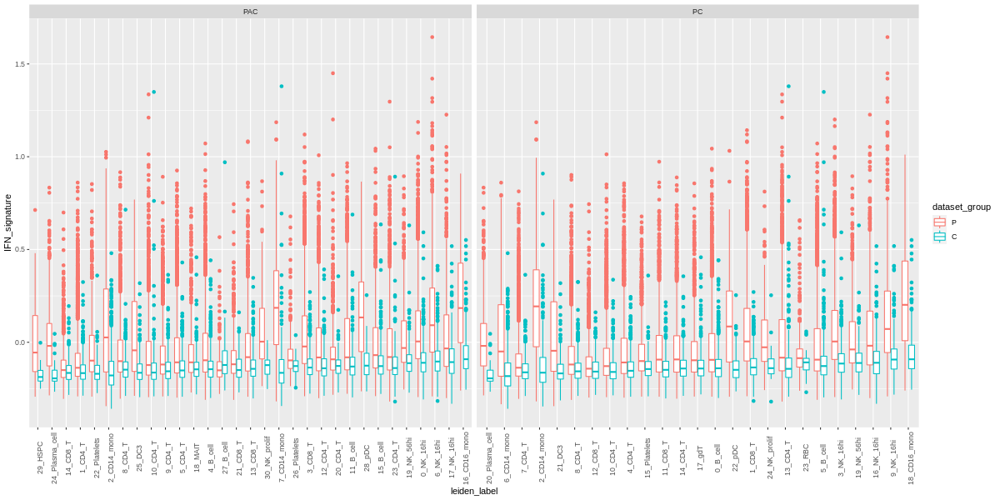

In [135]:
%%R -w 1200 -h 600
obs_df %>%
group_by(leiden_label, design, dataset_group) %>%
mutate(mean_IFN = mean(IFN_signature)) %>%
ungroup() %>%
arrange(mean_IFN) %>%
mutate(leiden_label = factor(leiden_label, levels = unique(leiden_label))) %>%
ggplot(aes(leiden_label, IFN_signature, color=dataset_group)) +
geom_boxplot() +
theme(axis.text.x=element_text(angle=90)) +
facet_wrap(design~., scales='free_x')

## Compare designs on DE analysis

In [245]:
## Leiden clustering 
sc.tl.leiden(adata, resolution=1.5)
label_leiden(adata)

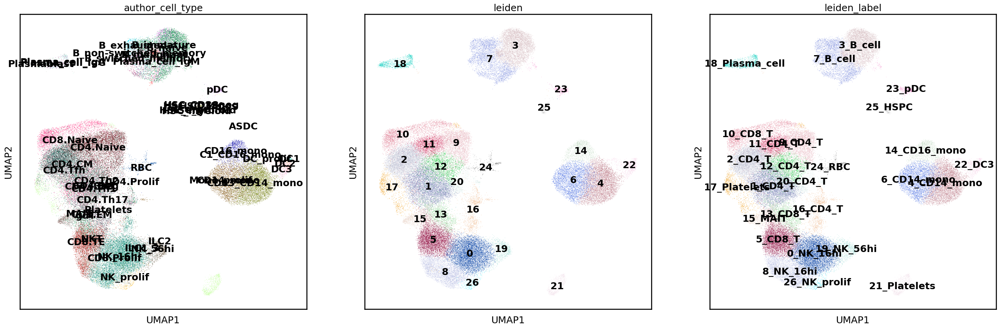

In [246]:
with rc_context({'figure.figsize':[10,10]}):
    sc.pl.umap(adata, color=['author_cell_type', 'leiden','leiden_label'], legend_loc='on data')

In [415]:
## Leiden clustering 
sc.tl.leiden(adata_c, resolution=1.5)

label_leiden(adata_c)

In [461]:
import diff2atlas

def run_glmGamPoi_DE(pbulk_adata, 
                     design = '~ Site + nhood_groups',
                    ref_level = 'in_nhoods_other',
                    contrast = 'nhood_groupsin_nhoods_critical',
                     n_hvgs = 5000):
    '''
    Run R code for DE analysis with glmGamPoi
    
    Params:
    ------
    - pbulk_adata: anndata object with pseudobulked data
    
    '''
    
    ## Define R function
    glmgampoi_str = f'''
        library(SingleCellExperiment)
        library(glmGamPoi)
        library(scran)
        library(scater)

        run_de <- function(args){{
            pbulk_sdata_X <- args[[1]]
            pbulk_sdata_obs <- args[[2]]
            pbulk_sdata_var <- args[[3]]
            n_hvgs <- args[[4]]

            sce <- SingleCellExperiment(assays = list(counts = t(pbulk_sdata_X)), colData = pbulk_sdata_obs)
            sce <- logNormCounts(sce)
            
            ## Feature selection w scran (just on test cell types)
            dec <- modelGeneVar(sce)
            hvgs <- getTopHVGs(dec, n = n_hvgs)
            subset_sce <- sce[hvgs,]

            ## Fit
            fit <- glm_gp(subset_sce, design = {design}, reference_level = '{ref_level}')
            
            
            ## Test 
            de_res <- test_de(fit, contrast = '{contrast}')    
            de_res[,'gene_name'] <- pbulk_sdata_var[hvgs,]['gene_name']
            return(de_res)
        }}'''
    
    import rpy2.robjects.pandas2ri
    import rpy2.robjects.numpy2ri
    from rpy2.robjects.packages import STAP
    
    ## Get anndata components
    pbulk_sdata_X = pbulk_adata.X.toarray().copy()
    pbulk_sdata_obs = pbulk_adata.obs.copy()
    pbulk_sdata_var = pbulk_adata.var.copy()
    
    r_pkg = STAP(glmgampoi_str, "r_pkg")
    # this was needed for the code to run on jhub
    # if you have a different version of rpy2 you may not need these two lines
    rpy2.robjects.pandas2ri.activate()
    rpy2.robjects.numpy2ri.activate()
    
    # PASS OBJECTS INTO FUNCTION
    args = [pbulk_sdata_X, pbulk_sdata_obs, pbulk_sdata_var, n_hvgs]
    de_res_df = r_pkg.run_de(args)
    de_res_df = pd.DataFrame(de_res_df)
    de_res_df.index = de_res_df['gene_name']
    de_res_df.drop('name', 1, inplace=True)
    return(de_res_df)

def pseudobulk_DE(
    adata, 
    test_obs: str,
    celltype_obs: str,
    sample_obs: str,
    test_group: str,
    ctrl_group: str,
    confounders_obs = None,
    pbulk_use_layer: str = 'counts',
    n_hvgs: int = 5
    ):
    '''
    Find genes differentially expressed between cells in 2 groups of neighbourhoods
    
    Params:
    -------
    - adata: AnnData object storing nhood info in adata.uns['nhood_adata']
    - design: design formula for the test, passed to glmGamPoi
    - test_obs
    - celltype_obs
    - sample_obs
    - test_group: which neighbourhood group is the test group?
    - ctrl_group: which neighbourhood group is the reference group?
    - nhood_group_obs: the column in adata.uns['nhood_adata'] storing the neighbourhood group information
    - min_n_nhoods: cells are assigned to a neighbourhood group only if it belongs to at least min_n_nhoods neighbourhoods in the group
    - pbulk_use_layer: layer storing counts (if None, adata.X is used) 
    - n_hvgs: how many HVGS to use for the DE test (the more you use, the longer it takes)
    
    Returns:
    --------
    pd.DataFrame storing DE test results
    '''

    ## Make pseudobulk adata for cells if different nhood groups and samples
    if confounders_obs is None:
        design = f'~ {test_obs}'
        pbulk_by = [test_obs] + [sample_obs, celltype_obs]
    
    else:
        if isinstance(confounders_obs, str):
            confounder_obs = [confounders_obs]
        design = "~ " + ' + '.join(confounders_obs) + f' + {test_obs}'
        pbulk_by = [test_obs] + confounders_obs + [sample_obs, celltype_obs]
    
    pbulk_sdata = diff2atlas.utils.anndata2pseudobulk(
            adata, 
            group_by = pbulk_by, 
            min_ncells = 10, 
            agg='s',
            use_layer = pbulk_use_layer)
    
    ## Filter celltypes with at least 3 replicates per condition
    n_samples = pbulk_sdata.obs[pbulk_sdata.obs[test_cov].isin([test_group, ctrl_group])].groupby([celltype_obs, test_obs]).size().reset_index()
    n_conditions = n_samples.groupby(celltype_obs).size()[0]
    min_n_samples = n_samples.groupby(celltype_obs).min()[0]
    test_celltypes = min_n_samples.index[(min_n_samples > 3) & (n_conditions == 2)]
    
    ## Run DE tests
    de_results = pd.DataFrame()
    for ct in test_celltypes:
        print(ct)
        try:
            de_results_ct = run_glmGamPoi_DE(pbulk_sdata[pbulk_sdata.obs[celltype_obs] == ct], design = design, 
                                       ref_level = ctrl_group, 
                                       contrast = f'{test_obs}{test_group}', 
                                       n_hvgs=n_hvgs)
        except:
            print("Excluded!")
            continue
        de_results_ct[celltype_obs] = ct
        de_results = pd.concat([de_results, de_results_ct])
        
    return(de_results)


In [326]:
# pbulk_sdata = diff2atlas.utils.anndata2pseudobulk(
#             adata, 
#             group_by = ['Status'] + ['Site'] + ['sample_id', 'leiden_label'], 
#             min_ncells = 10, 
#             agg='s',
#             use_layer = 'counts')

# df = pbulk_sdata.obs

# %%R -i df
# head(df)

# %%R -w 800 -h 400
# df %>%
#     ggplot(aes(sample_id, leiden_label, fill = n_cells)) +
#     geom_tile() +
#     facet_grid(.~Status, scales='free', space='free') +
#     scale_fill_viridis_c()

In [399]:
DE_results_PAC = pseudobulk_DE(adata, test_obs='Status', 
              celltype_obs='leiden_label', 
              sample_obs='sample_id',
              confounders_obs=['Site'], 
              test_group = 'Covid', 
              ctrl_group = 'Healthy',
              n_hvgs = 5000
             )

0_NK_16hi
10_CD8_T
11_CD4_T
12_CD4_T
13_CD8_T
14_CD16_mono
15_MAIT
16_CD4_T
17_Platelets
Excluded!
19_NK_56hi
1_CD4_T
22_DC3
25_HSPC
Excluded!
2_CD4_T
3_B_cell
4_CD14_mono
5_CD8_T
6_CD14_mono
7_B_cell
8_NK_16hi
9_CD4_T


In [422]:
adata_c.layers['counts'] = adata_c.X.copy()

In [445]:
from pyensembl import EnsemblRelease

## Utility function to parse 
# gene annotations from pyensembl
def ens_genes2df(genes):
    '''
    Convert pyemsembl genes to feature 
    dataframe readable by muon
    '''
    genes_df = pd.DataFrame()
    genes_df['Chromosome'] = ["chr" + x.contig for x in genes]
    genes_df['Start'] = [x.start for x in genes]
    genes_df['End'] = [x.end for x in genes]
    genes_df['GeneName'] = [x.gene_name for x in genes]
    genes_df['GeneID'] = [x.gene_id for x in genes]
    return(genes_df)

## Get gene annotations and ranges from pyensembl
data = EnsemblRelease(93)
gene_names = data.genes()
genes_df = ens_genes2df(gene_names)
genes_df.index = genes_df['GeneID'].values.copy()

In [450]:
# genes_df = adata.var.copy()
# genes_df.index = genes_df.gene_id
adata_c = adata_c[:,adata_c.var_names.isin(genes_df.index)].copy()

feature_id
ENSG00000243485    MIR1302-2HG
ENSG00000238009     AL627309.1
ENSG00000239945     AL627309.3
ENSG00000239906     AL627309.2
ENSG00000229905     AL669831.2
                      ...     
ENSG00000277196     AC007325.2
ENSG00000278384     AL354822.1
ENSG00000277856     AC233755.2
ENSG00000275063     AC233755.1
ENSG00000271254     AC240274.1
Name: GeneName, Length: 24726, dtype: object

In [459]:
adata_c.var['gene_name'] = genes_df.loc[adata_c.var_names]['GeneName'].values
adata_c.var['gene_id'] = adata_c.var_names.copy()
adata_c.var_names = adata_c.var['gene_name'].values

In [462]:
DE_results_PC = pseudobulk_DE(adata_c, test_obs='Status', 
              celltype_obs='leiden_label', 
              sample_obs='sample_id',
              confounders_obs=['Site'], 
              test_group = 'Covid', 
              ctrl_group = 'Healthy',
              n_hvgs = 5000
             )

0_NK_16hi
10_CD4_T
11_Platelets
12_NK_16hi
13_gdT
14_CD16_mono
15_NK_56hi
17_DC3
1_CD8_T
20_NK_prolif
Excluded!
2_CD4_T
3_CD4_T
4_CD4_T
5_B_cell
6_CD14_mono
7_CD14_mono
8_B_cell
9_CD8_T


In [463]:
DE_results_PC['is_IFN_gene'] = DE_results_PC.gene_name.isin(ifn_signature_genes)
DE_results_PAC['is_IFN_gene'] = DE_results_PAC.gene_name.isin(ifn_signature_genes)

In [499]:
n_ifn_DEGs = DE_results_PAC[DE_results_PAC['adj_pval'] < 0.1].groupby('leiden_label').sum('is_IFN_gene')['is_IFN_gene']
n_DEGs = DE_results_PAC[DE_results_PAC['adj_pval'] < 0.1].groupby('leiden_label').size()
(n_ifn_DEGs/len(ifn_signature_genes)).sort_values(ascending=False)

leiden_label
0_NK_16hi       1.00
4_CD14_mono     1.00
5_CD8_T         1.00
8_NK_16hi       0.96
1_CD4_T         0.96
14_CD16_mono    0.88
9_CD4_T         0.84
22_DC3          0.72
7_B_cell        0.68
6_CD14_mono     0.56
13_CD8_T        0.48
11_CD4_T        0.48
12_CD4_T        0.32
3_B_cell        0.24
2_CD4_T         0.20
10_CD8_T        0.16
19_NK_56hi      0.08
15_MAIT         0.04
16_CD4_T        0.00
Name: is_IFN_gene, dtype: float64

(array([5., 7., 2., 0., 0., 1., 1., 0., 0., 1.]),
 array([0.    , 0.0375, 0.075 , 0.1125, 0.15  , 0.1875, 0.225 , 0.2625,
        0.3   , 0.3375, 0.375 ]),
 <BarContainer object of 10 artists>)

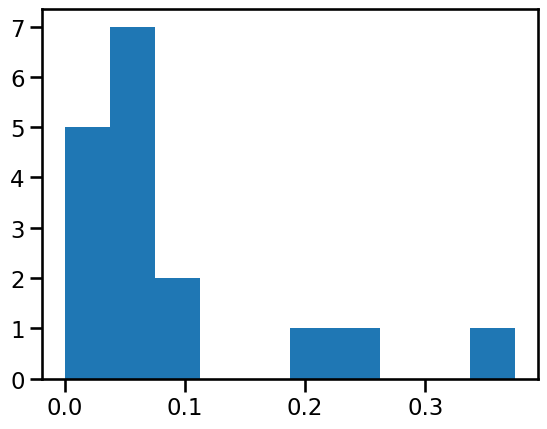

In [502]:
n_ifn_DEGs = DE_results_PC[DE_results_PC['adj_pval'] < 0.1].groupby('leiden_label').sum('is_IFN_gene')['is_IFN_gene']
n_DEGs = DE_results_PC[DE_results_PC['adj_pval'] < 0.1].groupby('leiden_label').size()
plt.hist(n_ifn_DEGs/n_DEGs)

In [477]:
%%R -i DE_results_PC -i DE_results_PAC
head(DE_results_PC)
head(DE_results_PAC)

          pval     adj_pval f_statistic df1     df2         lfc gene_name
1 9.696412e-01 0.9922648145  0.00145371   1 137.778 -0.02295457    RPS4Y1
2 5.722224e-03 0.0891312204  7.88052279   1 137.778  2.58943042  MTRNR2L8
3 5.253440e-02 0.3258957681  3.82441864   1 137.778  1.77472325       HBB
4 9.667013e-06 0.0007436164 21.11620002   1 137.778 -0.47278701     EEF1G
5 8.254903e-01 0.9545528447  0.04880078   1 137.778 -0.12747474     MYOM2
6 3.117971e-02 0.2486420202  4.73957127   1 137.778  0.78898983     PTGDS
  leiden_label is_IFN_gene
1    0_NK_16hi           0
2    0_NK_16hi           0
3    0_NK_16hi           0
4    0_NK_16hi           0
5    0_NK_16hi           0
6    0_NK_16hi           0


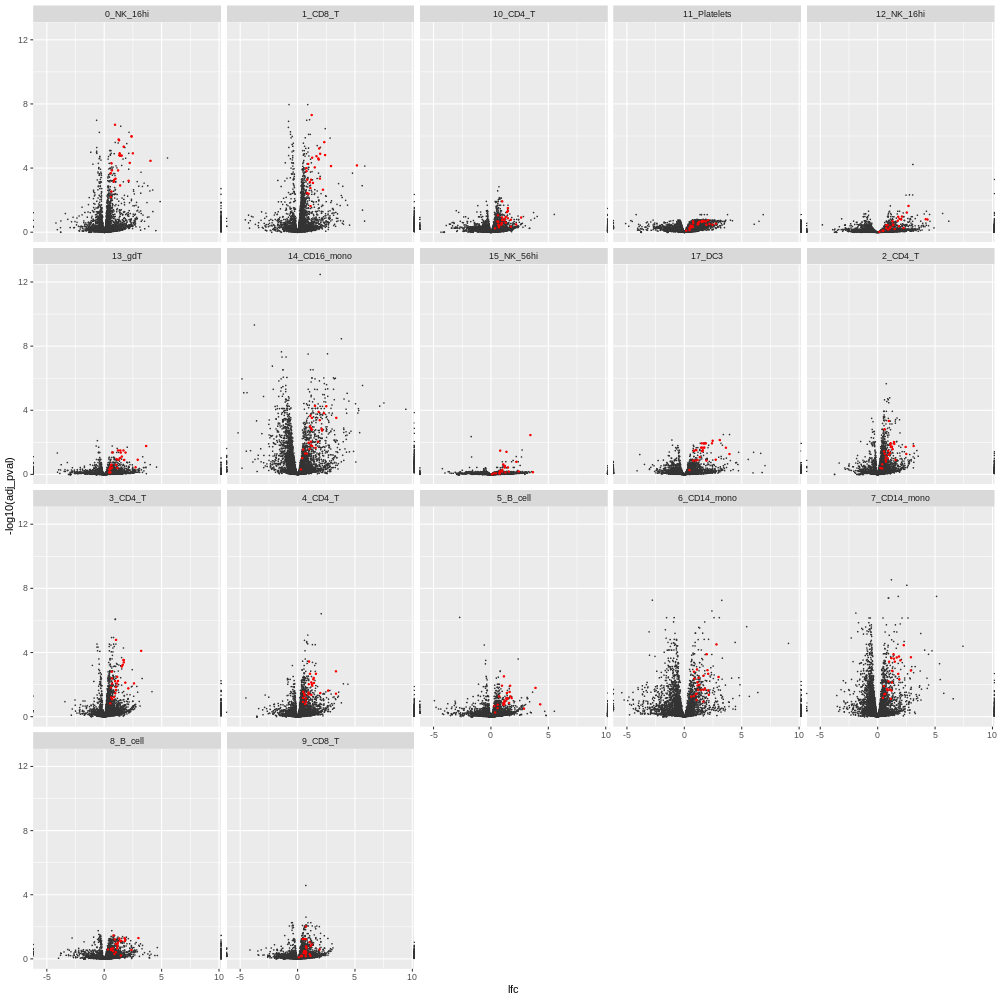

In [475]:
%%R -w 1000 -h 1000
DE_results_PC %>%
mutate(lfc = ifelse(abs(lfc) > 10, sign(lfc) * Inf, lfc)) %>%
ggplot(aes(lfc, -log10(adj_pval))) +
geom_point(size=0.1, color='grey20') +
geom_point(data=. %>% filter(is_IFN_gene), size=0.5, color='red') +
facet_wrap(leiden_label~.)

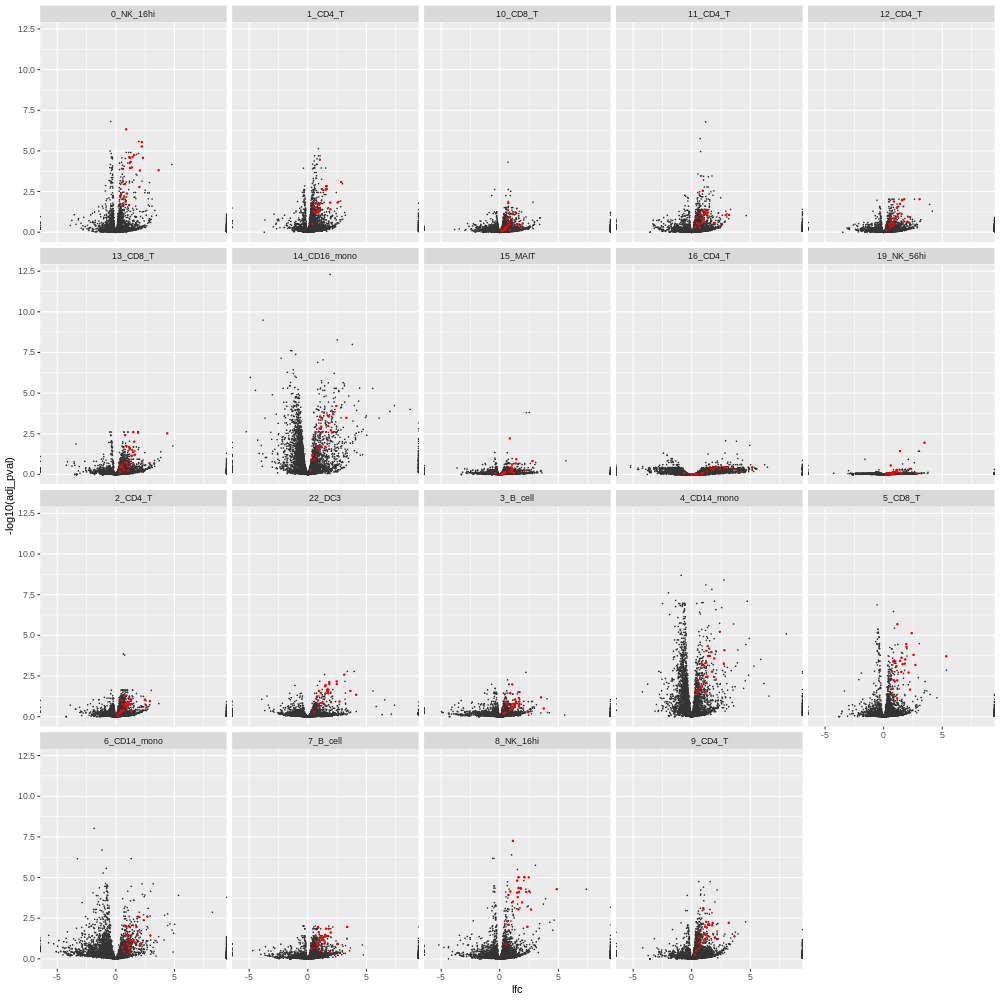

In [478]:
%%R -w 1000 -h 1000
DE_results_PAC %>%
mutate(lfc = ifelse(abs(lfc) > 10, sign(lfc) * Inf, lfc)) %>%
ggplot(aes(lfc, -log10(adj_pval))) +
geom_point(size=0.1, color='grey20') +
geom_point(data=. %>% filter(is_IFN_gene), size=0.5, color='red') +
facet_wrap(leiden_label~.)

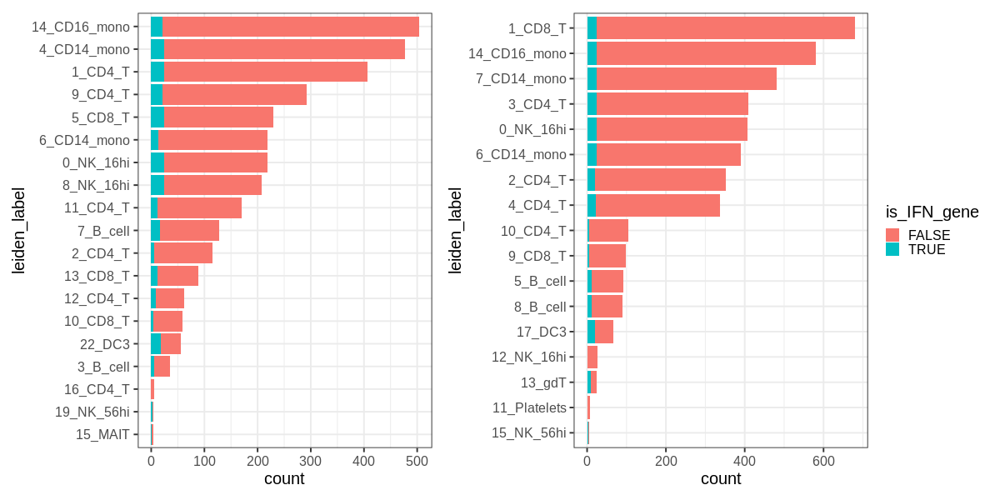

In [503]:
%%R -w 1200 -h 600
p1 <- DE_results_PAC %>%
filter((adj_pval < 0.1) & (lfc > 0)) %>%
group_by(leiden_label) %>%
mutate(n=n()) %>%
ungroup() %>%
arrange(n) %>%
mutate(leiden_label = factor(leiden_label, levels=unique(leiden_label))) %>%
ggplot(aes( leiden_label)) +
geom_bar(aes(fill=is_IFN_gene))  +
coord_flip() +
theme_bw(base_size=20)

p2 <- DE_results_PC %>%
filter((adj_pval < 0.1) & (lfc > 0)) %>%
mutate(lfc = ifelse(abs(lfc) > 10, sign(lfc) * Inf, lfc)) %>%
group_by(leiden_label) %>%
mutate(n=n()) %>%
ungroup() %>%
arrange(n) %>%
mutate(leiden_label = factor(leiden_label, levels=unique(leiden_label))) %>%
ggplot(aes( leiden_label)) +
geom_bar(aes(fill=is_IFN_gene)) +
coord_flip() +
theme_bw(base_size=20)

(p1 | p2) + plot_layout(guides='collect')

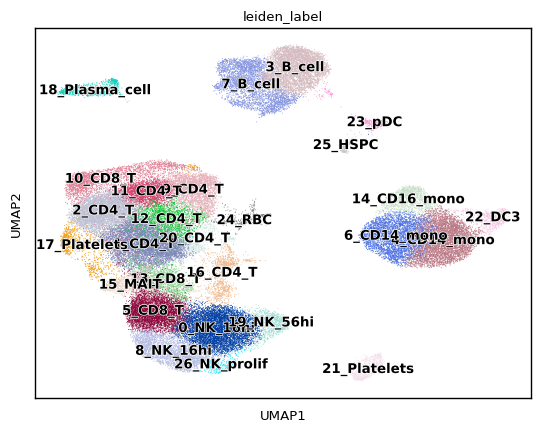

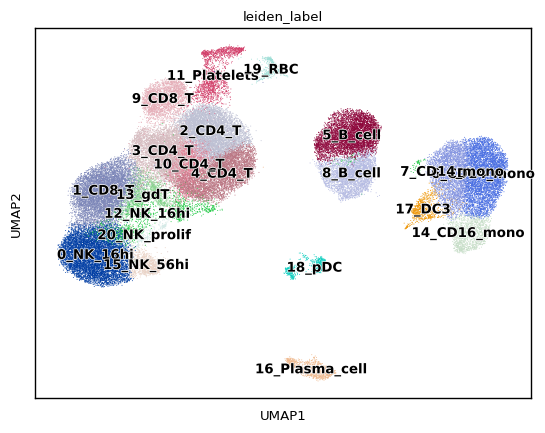

In [532]:
sns.set_context('paper')
sc.pl.umap(adata, color='leiden_label', legend_loc='on data', legend_fontoutline=1)
sc.pl.umap(adata_c, color='leiden_label', legend_loc='on data', legend_fontoutline=1)

In [ ]:
{'0_NK_16hi':'0_NK_16hi'}

In [642]:
ct_df_pc = DE_results_PC[DE_results_PC.leiden_label == '5_B_cell']
ct_df_pc['design'] = 'PC'
ct_df_pc = ct_df_pc.drop_duplicates()
ct_df_pac = DE_results_PAC[DE_results_PAC.leiden_label == '3_B_cell']
ct_df_pac['design'] = 'PAC'


/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/jovyan/my-conda-envs/emma_env/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


In [643]:
ct_df = pd.concat([ct_df_pac, ct_df_pc])
ct_df = ct_df[['lfc', 'adj_pval', 'design', 'gene_name']]
ct_df.pivot(index='gene_name', columns='design', values=['lfc', 'adj_pval']).reset_index()

gene_name        lfc            adj_pval          
design                  PAC        PC       PAC        PC
0           A1BG  -0.261678 -0.172203  0.728817  0.764250
1        A2M-AS1  22.032041       NaN  0.764294       NaN
2         A4GALT  21.412891       NaN  0.862963       NaN
3         AARSD1   0.157762  0.366857  0.907664  0.738394
4       AASDHPPT   0.425155       NaN  0.484683       NaN
...          ...        ...       ...       ...       ...
6710     ZSCAN31  -0.311097       NaN  0.936148       NaN
6711      ZSWIM3   1.982729  2.364679  0.580623  0.373360
6712      ZSWIM7   0.512586       NaN  0.297762       NaN
6713        ZXDC   0.899610  0.671401  0.445143  0.479017
6714       ZZEF1  -0.126664 -0.122162  0.900846  0.892157

[6715 rows x 5 columns]

In [644]:
%%R -i ct_df
type(ct_df$gene_name)

[1] "character"


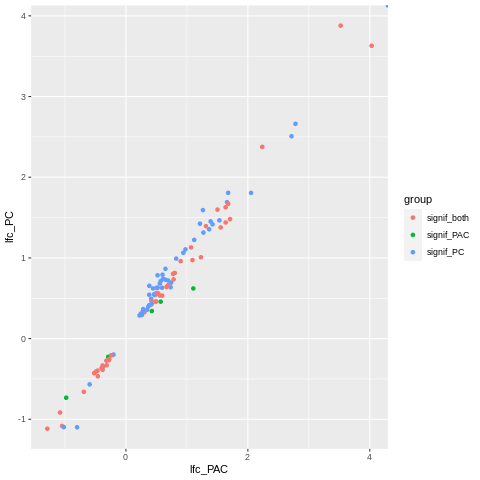

In [646]:
%%R
ct_df %>%
mutate(lfc = ifelse(abs(lfc) > 10, sign(lfc) * Inf, lfc)) %>%
# select(c('lfc', 'adj_pval', 'design', 'gene_name')) %>%
pivot_wider(values_from=c('lfc', 'adj_pval'), names_from='design') %>%
mutate(group = ifelse((adj_pval_PC < 0.1) & (adj_pval_PAC < 0.1), 'signif_both',
                      ifelse((adj_pval_PC >= 0.1) & (adj_pval_PAC < 0.1), 'signif_PAC',
                             ifelse((adj_pval_PC < 0.1) & (adj_pval_PAC >= 0.1), 'signif_PC', NA)
                     ))) %>%
filter(!is.na(group)) %>%
ggplot(aes(lfc_PAC, lfc_PC,color=group)) +
geom_point() 

In [649]:
%%R
ct_df %>%
mutate(lfc = ifelse(abs(lfc) > 10, sign(lfc) * Inf, lfc)) %>%
select(c('lfc', 'adj_pval', 'design', 'gene_name')) %>%
pivot_wider( values_from=c('lfc', 'adj_pval'), names_from='design') %>%
mutate(group = ifelse((adj_pval_PC < 0.1) & (adj_pval_PAC < 0.1), 'signif_both',
                      ifelse((adj_pval_PC >= 0.1) & (adj_pval_PAC < 0.1), 'signif_PAC',
                             ifelse((adj_pval_PC < 0.1) & (adj_pval_PAC >= 0.1), 'signif_PC', NA)
                     ))) %>%
filter(group == 'signif_PC') 

   gene_name    lfc_PAC     lfc_PC adj_pval_PAC adj_pval_PC     group
1      ISG15  1.6760638  1.8065503    0.1698918  0.07025953 signif_PC
2     S100A8  1.4207817  1.4159426    0.1145324  0.04935753 signif_PC
3        MX1  1.3888620  1.4523958    0.1467979  0.07025953 signif_PC
4     PLSCR1  1.6583847  1.6900909    0.1201010  0.05461065 signif_PC
5       OAS1  1.2710969  1.3142203    0.1917279  0.07425824 signif_PC
6      IFI44  2.7161930  2.5083319    0.1201010  0.09997556 signif_PC
7      CYB5A  0.6092389  0.7413146    0.2880564  0.09723757 signif_PC
8       OAS2  1.2145581  1.4244733    0.2514020  0.07954270 signif_PC
9       BST2  0.6466579  0.7296966    0.1467979  0.05461065 signif_PC
10     ODF3B  0.9762071  1.1055077    0.1917279  0.08441209 signif_PC
11      VCAN  2.0523548  1.8059393    0.1145324  0.05597205 signif_PC
12   MRPS18B  0.6001161  0.7921500    0.2454659  0.03293235 signif_PC
13     COPS2  0.5208265  0.6299759    0.1962470  0.05461065 signif_PC
14      RPS2 -0.3745

In [518]:
DE_signif_df = DE_results_PC[DE_results_PC.adj_pval < 0.1].copy()
n_signif_cts_PC = DE_signif_df.drop('gene_name', 1).reset_index().groupby('gene_name').size().sort_values()

DE_signif_df = DE_results_PAC[DE_results_PAC.adj_pval < 0.1].copy()
n_signif_cts_PAC = DE_signif_df.drop('gene_name', 1).reset_index().groupby('gene_name').size().sort_values()

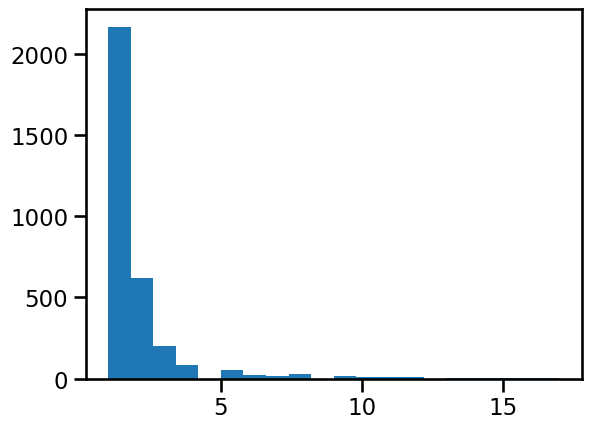

In [526]:
plt.hist(n_signif_cts_PAC, bins=20);

----